In [2]:
%whos

Variable                        Type        Data/Info
-----------------------------------------------------
pydev_jupyter_vars              module      <module 'pydev_jupyter_va<...>g/pydev_jupyter_vars.py'>
remove_imported_pydev_package   function    <function remove_imported<...>v_package at 0x124870900>
sys                             module      <module 'sys' (built-in)>


**House Price Prediction**

In [177]:
#Basic Components
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import pickle
import datetime


#SckitLearn & Statmodel
import statsmodels.api as sm
from sklearn.model_selection import learning_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error

#LGBM & XGB
import lightgbm as lgb
from lightgbm import LGBMRegressor
import xgboost as xgb
from xgboost import XGBRegressor
import warnings

warnings.filterwarnings ("ignore")
pd.set_option ('display.float_format', lambda x: '%.2f' % x)
pd.set_option ('display.width', None)
pd.set_option ('display.max_columns', None)

# **1.Data Collection**

In [6]:
#read the datasets
train = pd.read_excel('/Users/ibrahim/PycharmProjects/hpp_stream/dataset/DataFrame.xlsx')

In [7]:
train.shape

(2919, 81)

In [9]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.00,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,856.00,GasA,Ex,Y,SBrkr,856,854,0,1710,1.00,0.00,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.00,RFn,2.00,548.00,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.00,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,1262.00,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.00,1.00,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.00,RFn,2.00,460.00,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.00,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,920.00,GasA,Ex,Y,SBrkr,920,866,0,1786,1.00,0.00,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.00,RFn,2.00,608.00,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.00,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216.00,Unf,0.00,540.00,756.00,GasA,Gd,Y,SBrkr,961,756,0,1717,1.00,0.00,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.00,Unf,3.00,642.00,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.00,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,1145.00,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.00,0.00,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.00,RFn,3.00,836.00,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# **2.Exploratory Data Analysis (EDA)**

In [10]:
#When we checked the data description file, it is seen that all NA values are not actually missing value. Some of them represent absence.
#Thats why we replaced the NA to Absence
NA_change = train[['PoolQC','MiscFeature','GarageType','GarageQual','GarageFinish','GarageCond','FireplaceQu','Fence',
                   'BsmtQual','BsmtFinType2','BsmtFinType1','BsmtExposure','BsmtCond','Alley']]

In [11]:
null_train = pd.DataFrame(train.isnull().sum())
null_train = null_train.reset_index()
null_train = null_train.rename(columns={'index': 'Variables', 0:'Count'})
null_train['Proportion'] = null_train['Count']/len(train)
#checked only columns with null values
null_train[null_train['Count']>0].sort_values('Proportion', ascending=False)

,Variables,Count,Proportion
72,PoolQC,2909,1.00
74,MiscFeature,2814,0.96
6,Alley,2721,0.93
73,Fence,2348,0.80
25,MasVnrType,1766,0.61
57,FireplaceQu,1420,0.49
3,LotFrontage,486,0.17
60,GarageFinish,159,0.05
63,GarageQual,159,0.05
64,GarageCond,159,0.05


In [12]:
NA_change_col = NA_change.columns
train[NA_change_col] = train[NA_change_col].fillna('Absence')
train[NA_change_col]

,PoolQC,MiscFeature,GarageType,GarageQual,GarageFinish,GarageCond,FireplaceQu,Fence,BsmtQual,BsmtFinType2,BsmtFinType1,BsmtExposure,BsmtCond,Alley
0,Absence,Absence,Attchd,TA,RFn,TA,Absence,Absence,Gd,Unf,GLQ,No,TA,Absence
1,Absence,Absence,Attchd,TA,RFn,TA,TA,Absence,Gd,Unf,ALQ,Gd,TA,Absence
2,Absence,Absence,Attchd,TA,RFn,TA,TA,Absence,Gd,Unf,GLQ,Mn,TA,Absence
3,Absence,Absence,Detchd,TA,Unf,TA,Gd,Absence,TA,Unf,ALQ,No,Gd,Absence
4,Absence,Absence,Attchd,TA,RFn,TA,TA,Absence,Gd,Unf,GLQ,Av,TA,Absence
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,Absence,Absence,Absence,Absence,Absence,Absence,Absence,Absence,TA,Unf,Unf,No,TA,Absence
2915,Absence,Absence,CarPort,TA,Unf,TA,Absence,Absence,TA,Unf,Rec,No,TA,Absence
2916,Absence,Absence,Detchd,TA,Unf,TA,TA,Absence,TA,Unf,ALQ,No,TA,Absence
2917,Absence,Shed,Absence,Absence,Absence,Absence,Absence,MnPrv,Gd,Unf,GLQ,Av,TA,Absence


In [13]:
null_train = pd.DataFrame(train.isnull().sum())
null_train = null_train.reset_index()
null_train = null_train.rename(columns={'index': 'Variables', 0:'Count'})
null_train['Proportion'] = null_train['Count']/len(train)
#checked only columns with null values
null_train[null_train['Count']>0].sort_values('Proportion', ascending=False)

,Variables,Count,Proportion
25,MasVnrType,1766,0.61
3,LotFrontage,486,0.17
59,GarageYrBlt,159,0.05
26,MasVnrArea,23,0.01
2,MSZoning,4,0.00
47,BsmtFullBath,2,0.00
9,Utilities,2,0.00
55,Functional,2,0.00
48,BsmtHalfBath,2,0.00
62,GarageArea,1,0.00


In [14]:
print(train.shape)


(2919, 81)


In [15]:
#checked the type of the columns and non-null variables - It has 43 object, 35 integer and 3 float type of variables.
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2915 non-null   object 
 3   LotFrontage    2433 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          2919 non-null   object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2917 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallC


## 2.1 Features Inspection

### 2.1.A. Categorical Features

In [16]:
#checked consistency type of categorical columns.
cat = train.select_dtypes(include=['object'])
cat

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Absence,Attchd,RFn,TA,TA,Y,Absence,Absence,Absence,WD,Normal
1,RL,Pave,Absence,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,NaN,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,Absence,Absence,Absence,WD,Normal
2,RL,Pave,Absence,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,Absence,Absence,Absence,WD,Normal
3,RL,Pave,Absence,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,NaN,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,Absence,Absence,Absence,WD,Abnorml
4,RL,Pave,Absence,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,Absence,Absence,Absence,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,RM,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,Gable,CompShg,CemntBd,CmentBd,NaN,TA,TA,CBlock,TA,TA,No,Unf,Unf,GasA,Gd,Y,SBrkr,TA,Typ,Absence,Absence,Absence,Absence,Absence,Y,Absence,Absence,Absence,WD,Normal
2915,RM,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,Gable,CompShg,CemntBd,CmentBd,NaN,TA,TA,CBlock,TA,TA,No,Rec,Unf,GasA,TA,Y,SBrkr,TA,Typ,Absence,CarPort,Unf,TA,TA,Y,Absence,Absence,Absence,WD,Abnorml
2916,RL,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Detchd,Unf,TA,TA,Y,Absence,Absence,Absence,WD,Abnorml
2917,RL,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,Gable,CompShg,HdBoard,Wd Shng,NaN,TA,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,TA,Y,SBrkr,TA,Typ,Absence,Absence,Absence,Absence,Absence,Y,Absence,MnPrv,Shed,WD,Normal


In [17]:
#It seems accurate
for col in cat:
    print(train[col].value_counts(normalize=True).sort_values(ascending=False).round(2))

MSZoning
RL        0.78
RM        0.16
FV        0.05
RH        0.01
C (all)   0.01
Name: proportion, dtype: float64
Street
Pave   1.00
Grvl   0.00
Name: proportion, dtype: float64
Alley
Absence   0.93
Grvl      0.04
Pave      0.03
Name: proportion, dtype: float64
LotShape
Reg   0.64
IR1   0.33
IR2   0.03
IR3   0.01
Name: proportion, dtype: float64
LandContour
Lvl   0.90
HLS   0.04
Bnk   0.04
Low   0.02
Name: proportion, dtype: float64
Utilities
AllPub   1.00
NoSeWa   0.00
Name: proportion, dtype: float64
LotConfig
Inside    0.73
Corner    0.18
CulDSac   0.06
FR2       0.03
FR3       0.00
Name: proportion, dtype: float64
LandSlope
Gtl   0.95
Mod   0.04
Sev   0.01
Name: proportion, dtype: float64
Neighborhood
NAmes     0.15
CollgCr   0.09
OldTown   0.08
Edwards   0.07
Somerst   0.06
NridgHt   0.06
Gilbert   0.06
Sawyer    0.05
NWAmes    0.04
SawyerW   0.04
Mitchel   0.04
BrkSide   0.04
Crawfor   0.04
IDOTRR    0.03
Timber    0.02
NoRidge   0.02
StoneBr   0.02
SWISU     0.02
ClearCr   0.

In [18]:
#checked the number of unique values for each column. We should investigate columns with bigger unique numbers such as 25, 15,16
for col in cat:
    print(train[[col]].nunique())

MSZoning    5
dtype: int64
Street    2
dtype: int64
Alley    3
dtype: int64
LotShape    4
dtype: int64
LandContour    4
dtype: int64
Utilities    2
dtype: int64
LotConfig    5
dtype: int64
LandSlope    3
dtype: int64
Neighborhood    25
dtype: int64
Condition1    9
dtype: int64
Condition2    8
dtype: int64
BldgType    5
dtype: int64
HouseStyle    8
dtype: int64
RoofStyle    6
dtype: int64
RoofMatl    8
dtype: int64
Exterior1st    15
dtype: int64
Exterior2nd    16
dtype: int64
MasVnrType    3
dtype: int64
ExterQual    4
dtype: int64
ExterCond    5
dtype: int64
Foundation    6
dtype: int64
BsmtQual    5
dtype: int64
BsmtCond    5
dtype: int64
BsmtExposure    5
dtype: int64
BsmtFinType1    7
dtype: int64
BsmtFinType2    7
dtype: int64
Heating    6
dtype: int64
HeatingQC    5
dtype: int64
CentralAir    2
dtype: int64
Electrical    5
dtype: int64
KitchenQual    4
dtype: int64
Functional    7
dtype: int64
FireplaceQu    6
dtype: int64
GarageType    7
dtype: int64
GarageFinish    4
dtype: int6

In [19]:
print(train.shape)


(2919, 81)


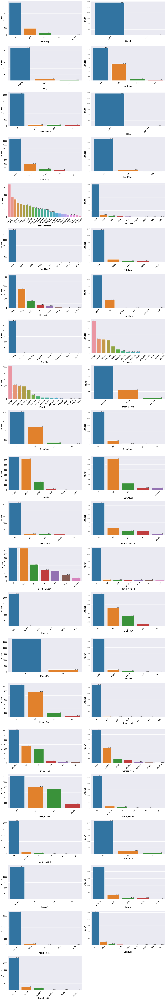

In [20]:
#Second alternative for visualization
fig = plt.figure(figsize=(20,140))
for index,col in enumerate(cat.columns):
    plt.subplot(26,2,index+1)
    ax = sns.countplot(x=cat.iloc[:,index], data=cat.dropna(), order=train[col].value_counts().sort_values(ascending=False).index)
    plt.ylabel('COUNT', size = 18,color="black")
    plt.xlabel(col, fontsize = 18,color="black")
    plt.xticks(size = 15,color="black", rotation = 45 )
    plt.yticks(size = 15,color="black" )
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/len(train))
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax.annotate(percentage, (x, y),ha='right')

fig.tight_layout(pad=1.0)

In [21]:
cat.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

#### 2.1.A.1Creating New Features

In [22]:
#Adding some columns related to features that there are in the house (train)
train['Pool_'] = train.apply(lambda x: 'No' if x['PoolQC']=='Absence' else 'Yes', axis=1)
train['Basement_'] = train.apply(lambda x: 'No' if x['BsmtQual']=='Absence' else 'Yes', axis=1)
train['Fence_'] = train.apply(lambda x: 'No' if x['Fence']=='Absence' else 'Yes', axis=1)
train['Fireplace_'] = train.apply(lambda x: 'No' if x['FireplaceQu']=='Absence' else 'Yes', axis=1)
train['Garage_'] = train.apply(lambda x: 'No' if x['GarageType']=='Absence' else 'Yes', axis=1)
train['Alley_'] = train.apply(lambda x: 'No' if x['Alley']=='Absence' else 'Yes', axis=1)

In [23]:
train[['Pool_','Basement_','Fence_','Fireplace_','Garage_','Alley_']].head()

,Pool_,Basement_,Fence_,Fireplace_,Garage_,Alley_
0,No,Yes,No,No,Yes,No
1,No,Yes,No,Yes,Yes,No
2,No,Yes,No,Yes,Yes,No
3,No,Yes,No,Yes,Yes,No
4,No,Yes,No,Yes,Yes,No


In [24]:
print(train.shape)


(2919, 87)


#### 2.1.A.2 Elimination of the columns with more than 95% values

In [25]:
# Create empty lists to store the useful and useless variables
usefull = []
useless = []

cat = train.select_dtypes(include=['object'])

# Create a dictionary to store the category counts
category_counts = {}

# Loop through each categorical variable
for variable in cat:

    # Count the number of occurrences of each category in the variable
    category_counts[variable] = {}
    for category in train[variable].unique():
        # Skip NaN categories
        if pd.isna(category):
            continue
        category_counts[variable][category] = train[variable].value_counts(normalize=True)[category]

    # Calculate the total count of categories across all variables
    total_count = sum(category_counts[variable].values())

    # Check if any category has a count of 95% or more
    for category in category_counts[variable]:
        if category_counts[variable][category] >= 0.95:
            useless.append(variable)
            break

    # If no category has a count of 95% or more, add the variable to the useful list
    if variable not in useless:
        usefull.append(variable)

    # Calculate the percentage of each category relative to the total count
    for category in category_counts[variable]:
        category_counts[variable][category] = category_counts[variable][category] / total_count * 100

# Print the category counts for each variable
for variable in cat:
    print(f"Variable: {variable}")
    for category, count in category_counts[variable].items():
        print(f"{category}: {count:.2f}%")
    print("\n")

# Print the useful and useless lists
print(f"Usefull variables: {usefull}")
print(f"Useless variables: {useless}")

Variable: MSZoning
RL: 77.70%
RM: 15.78%
C (all): 0.86%
FV: 4.77%
RH: 0.89%


Variable: Street
Pave: 99.59%
Grvl: 0.41%


Variable: Alley
Absence: 93.22%
Grvl: 4.11%
Pave: 2.67%


Variable: LotShape
Reg: 63.69%
IR1: 33.16%
IR2: 2.60%
IR3: 0.55%


Variable: LandContour
Lvl: 89.83%
Bnk: 4.01%
Low: 2.06%
HLS: 4.11%


Variable: Utilities
AllPub: 99.97%
NoSeWa: 0.03%


Variable: LotConfig
Inside: 73.07%
FR2: 2.91%
Corner: 17.51%
CulDSac: 6.03%
FR3: 0.48%


Variable: LandSlope
Gtl: 95.17%
Mod: 4.28%
Sev: 0.55%


Variable: Neighborhood
CollgCr: 9.15%
Veenker: 0.82%
Crawfor: 3.53%
NoRidge: 2.43%
Mitchel: 3.91%
Somerst: 6.24%
NWAmes: 4.49%
OldTown: 8.19%
BrkSide: 3.70%
Sawyer: 5.17%
NridgHt: 5.69%
NAmes: 15.18%
SawyerW: 4.28%
IDOTRR: 3.19%
MeadowV: 1.27%
Edwards: 6.65%
Timber: 2.47%
Gilbert: 5.65%
StoneBr: 1.75%
ClearCr: 1.51%
NPkVill: 0.79%
Blmngtn: 0.96%
BrDale: 1.03%
SWISU: 1.64%
Blueste: 0.34%


Variable: Condition1
Norm: 86.02%
Feedr: 5.62%
PosN: 1.34%
Artery: 3.15%
RRAe: 0.96%
RRNn: 0.31%

In [26]:
# Print the category counts for each variable
for variable in useless:
    print(f"Variable: {variable}")
    for category, count in category_counts[variable].items():
        print(f"{category}: {count:.2f}%")
    print("\n")

Variable: Street
Pave: 99.59%
Grvl: 0.41%


Variable: Utilities
AllPub: 99.97%
NoSeWa: 0.03%


Variable: LandSlope
Gtl: 95.17%
Mod: 4.28%
Sev: 0.55%


Variable: Condition2
Norm: 98.97%
Artery: 0.17%
RRNn: 0.07%
Feedr: 0.45%
PosN: 0.14%
PosA: 0.14%
RRAn: 0.03%
RRAe: 0.03%


Variable: RoofMatl
CompShg: 98.53%
WdShngl: 0.24%
Metal: 0.03%
WdShake: 0.31%
Membran: 0.03%
Tar&Grv: 0.79%
Roll: 0.03%
ClyTile: 0.03%


Variable: Heating
GasA: 98.46%
GasW: 0.92%
Grav: 0.31%
Wall: 0.21%
OthW: 0.07%
Floor: 0.03%


Variable: PoolQC
Absence: 99.66%
Ex: 0.14%
Fa: 0.07%
Gd: 0.14%


Variable: MiscFeature
Absence: 96.40%
Shed: 3.25%
Gar2: 0.17%
Othr: 0.14%
TenC: 0.03%


Variable: Pool_
No: 99.66%
Yes: 0.34%


Variable: Basement_
Yes: 97.23%
No: 2.77%


In [27]:
useless

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'Heating',
 'PoolQC',
 'MiscFeature',
 'Pool_',
 'Basement_']

<Axes: xlabel='PoolQC', ylabel='SalePrice'>

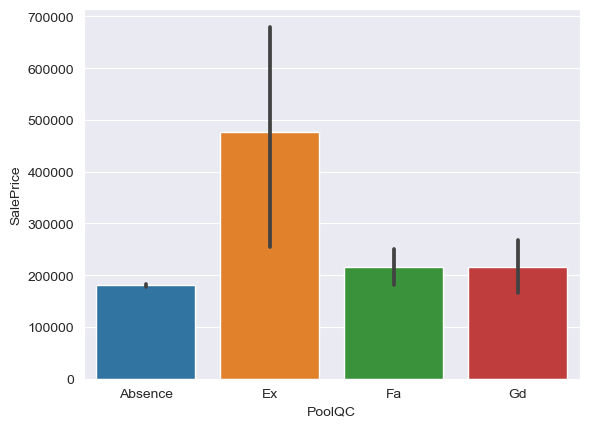

In [28]:
sns.barplot(x=train['PoolQC'], y=train['SalePrice'])

In [29]:
#We have decided to remove these columns from dataset due to we believe that they do not give us accurate information.
train = train.drop(useless, axis=1)

print(train.shape)


(2919, 77)


In [30]:
cat_2 = train.select_dtypes(include='object')
for col in cat_2:
  print(train[col].value_counts(normalize=True).round(2))

MSZoning
RL        0.78
RM        0.16
FV        0.05
RH        0.01
C (all)   0.01
Name: proportion, dtype: float64
Alley
Absence   0.93
Grvl      0.04
Pave      0.03
Name: proportion, dtype: float64
LotShape
Reg   0.64
IR1   0.33
IR2   0.03
IR3   0.01
Name: proportion, dtype: float64
LandContour
Lvl   0.90
HLS   0.04
Bnk   0.04
Low   0.02
Name: proportion, dtype: float64
LotConfig
Inside    0.73
Corner    0.18
CulDSac   0.06
FR2       0.03
FR3       0.00
Name: proportion, dtype: float64
Neighborhood
NAmes     0.15
CollgCr   0.09
OldTown   0.08
Edwards   0.07
Somerst   0.06
NridgHt   0.06
Gilbert   0.06
Sawyer    0.05
NWAmes    0.04
SawyerW   0.04
Mitchel   0.04
BrkSide   0.04
Crawfor   0.04
IDOTRR    0.03
Timber    0.02
NoRidge   0.02
StoneBr   0.02
SWISU     0.02
ClearCr   0.02
MeadowV   0.01
BrDale    0.01
Blmngtn   0.01
Veenker   0.01
NPkVill   0.01
Blueste   0.00
Name: proportion, dtype: float64
Condition1
Norm     0.86
Feedr    0.06
Artery   0.03
RRAn     0.02
PosN     0.01
RRAe

In [31]:
# create a list of categorical columns
cat_cols = [col for col in train.columns if train[col].dtype == 'object']

# create a crosstab and plot heatmap for each pair of columns with mean SalePrice greater than 300000
for i, col in enumerate(cat_cols):
    for j in range(i+1, len(cat_cols)):
        other_col = cat_cols[j]
        ct = pd.crosstab(train[col], train[other_col], values=train['SalePrice'], aggfunc=np.mean).round(0)
        if ct.mean().mean() > 250000:
            fig, ax = plt.subplots()
            sns.heatmap(ct, annot=True, fmt='g', cmap='rocket_r', cbar=False, ax=ax)
            ax.set_title(f"{col} vs {other_col}")
plt.show()

In [33]:
#train[(train['Alley_']=='No')&(train['ExterQual']=='Ex')]
#train[(train['Fence_']=='No')&(train['ExterQual']=='Ex')]
#train[(train['ExterQual']=='Ex')&(train['MasVnrType']=='Stone')]
#train[(train['ExterQual']=='Ex')&(train['MasVnrType']=='BrkFace')]
#train[(train['ExterQual']=='Ex')&(train['RoofStylpe']=='Hip')]
train[(train['ExterQual']=='Ex')&(train['Condition1']=='PosA')]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Fence_,Fireplace_,Garage_,Alley_
1663,1664,20,RL,105.00,13693,Absence,Reg,Lvl,Inside,NridgHt,PosA,1Fam,1Story,10,5,2007,2007,Hip,VinylSd,VinylSd,Stone,472.00,Ex,TA,PConc,Ex,TA,Gd,GLQ,2288.00,Unf,0.00,342.00,2630.00,Ex,Y,SBrkr,2674,0,0,2674,2.00,0.00,2,1,2,1,Ex,8,Typ,2,Gd,Attchd,2007.00,Fin,3.00,762.00,TA,TA,Y,360,50,0,0,0,0,Absence,0,3,2009,WD,Normal,610000,No,Yes,Yes,No
2267,2268,20,RL,81.00,13870,Absence,IR1,HLS,Inside,StoneBr,PosA,1Fam,1Story,10,5,2006,2007,Hip,CemntBd,CmentBd,BrkFace,250.00,Ex,TA,PConc,Ex,TA,Gd,GLQ,1152.00,Unf,0.00,590.00,1742.00,Ex,Y,SBrkr,2042,0,0,2042,1.00,0.00,2,0,3,1,Ex,8,Typ,1,Gd,Attchd,2007.00,Fin,3.00,724.00,TA,TA,Y,240,52,0,0,174,0,Absence,0,10,2007,New,Partial,455000,No,Yes,Yes,No
2598,2599,20,RL,85.00,12633,Absence,IR1,HLS,Inside,Timber,PosA,1Fam,1Story,10,5,2006,2007,Hip,MetalSd,MetalSd,BrkFace,242.00,Ex,TA,PConc,Ex,TA,Gd,Unf,0.00,Unf,0.00,1824.00,1824.00,Ex,Y,SBrkr,1824,0,0,1824,0.00,0.00,2,0,3,1,Ex,8,Typ,1,Gd,Attchd,2006.00,Fin,3.00,932.00,TA,TA,Y,160,36,0,0,108,0,Absence,0,9,2007,New,Partial,392000,No,Yes,Yes,No


In [34]:
col = train[['Fence_','Fireplace_','Garage_','Alley_']]
for col in col:
  print(train[col].value_counts(normalize=True).round(2))

Fence_
No    0.80
Yes   0.20
Name: proportion, dtype: float64
Fireplace_
Yes   0.51
No    0.49
Name: proportion, dtype: float64
Garage_
Yes   0.95
No    0.05
Name: proportion, dtype: float64
Alley_
No    0.93
Yes   0.07
Name: proportion, dtype: float64


In [35]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Fence_,Fireplace_,Garage_,Alley_
0,1,60,RL,65.00,8450,Absence,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,856.00,Ex,Y,SBrkr,856,854,0,1710,1.00,0.00,2,1,3,1,Gd,8,Typ,0,Absence,Attchd,2003.00,RFn,2.00,548.00,TA,TA,Y,0,61,0,0,0,0,Absence,0,2,2008,WD,Normal,208500,No,No,Yes,No
1,2,20,RL,80.00,9600,Absence,Reg,Lvl,FR2,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,NaN,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,1262.00,Ex,Y,SBrkr,1262,0,0,1262,0.00,1.00,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.00,RFn,2.00,460.00,TA,TA,Y,298,0,0,0,0,0,Absence,0,5,2007,WD,Normal,181500,No,Yes,Yes,No
2,3,60,RL,68.00,11250,Absence,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,920.00,Ex,Y,SBrkr,920,866,0,1786,1.00,0.00,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.00,RFn,2.00,608.00,TA,TA,Y,0,42,0,0,0,0,Absence,0,9,2008,WD,Normal,223500,No,Yes,Yes,No
3,4,70,RL,60.00,9550,Absence,IR1,Lvl,Corner,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,NaN,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216.00,Unf,0.00,540.00,756.00,Gd,Y,SBrkr,961,756,0,1717,1.00,0.00,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.00,Unf,3.00,642.00,TA,TA,Y,0,35,272,0,0,0,Absence,0,2,2006,WD,Abnorml,140000,No,Yes,Yes,No
4,5,60,RL,84.00,14260,Absence,IR1,Lvl,FR2,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,1145.00,Ex,Y,SBrkr,1145,1053,0,2198,1.00,0.00,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.00,RFn,3.00,836.00,TA,TA,Y,192,84,0,0,0,0,Absence,0,12,2008,WD,Normal,250000,No,Yes,Yes,No


#### 2.1.A.3 Rare Encoding

In [36]:
# Get list of categorical columns
categorical_columns = train.select_dtypes(include='object').columns

# Set the threshold for rare categories
threshold = 0.05

# Loop over all categorical columns and apply rare encoding
for column in categorical_columns:
    counts = train[column].value_counts(normalize=True)
    rare_categories = counts[counts < threshold].index.tolist()

    def replace_with_rare(category):
        if category in rare_categories:
            return 'rare_category'
        else:
            return category

    train[column] = train[column].apply(replace_with_rare)

In [37]:
for col in train[categorical_columns]:
  print(train[col].value_counts(normalize=True).round(2))

MSZoning
RL              0.78
RM              0.16
rare_category   0.07
Name: proportion, dtype: float64
Alley
Absence         0.93
rare_category   0.07
Name: proportion, dtype: float64
LotShape
Reg             0.64
IR1             0.33
rare_category   0.03
Name: proportion, dtype: float64
LandContour
Lvl             0.90
rare_category   0.10
Name: proportion, dtype: float64
LotConfig
Inside          0.73
Corner          0.18
CulDSac         0.06
rare_category   0.03
Name: proportion, dtype: float64
Neighborhood
rare_category   0.38
NAmes           0.15
CollgCr         0.09
OldTown         0.08
Edwards         0.07
Somerst         0.06
NridgHt         0.06
Gilbert         0.06
Sawyer          0.05
Name: proportion, dtype: float64
Condition1
Norm            0.86
rare_category   0.08
Feedr           0.06
Name: proportion, dtype: float64
BldgType
1Fam            0.83
rare_category   0.09
TwnhsE          0.08
Name: proportion, dtype: float64
HouseStyle
1Story          0.50
2Story          

In [38]:
print(train.shape)


(2919, 77)


### 2.1.B. Numerical Features

In [39]:
#checked the numerical columns
num = train.select_dtypes(exclude=['object'])
num


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.00,8450,7,5,2003,2003,196.00,706.00,0.00,150.00,856.00,856,854,0,1710,1.00,0.00,2,1,3,1,8,0,2003.00,2.00,548.00,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.00,9600,6,8,1976,1976,0.00,978.00,0.00,284.00,1262.00,1262,0,0,1262,0.00,1.00,2,0,3,1,6,1,1976.00,2.00,460.00,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.00,11250,7,5,2001,2002,162.00,486.00,0.00,434.00,920.00,920,866,0,1786,1.00,0.00,2,1,3,1,6,1,2001.00,2.00,608.00,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.00,9550,7,5,1915,1970,0.00,216.00,0.00,540.00,756.00,961,756,0,1717,1.00,0.00,1,0,3,1,7,1,1998.00,3.00,642.00,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.00,14260,8,5,2000,2000,350.00,655.00,0.00,490.00,1145.00,1145,1053,0,2198,1.00,0.00,2,1,4,1,9,1,2000.00,3.00,836.00,192,84,0,0,0,0,0,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2915,160,21.00,1936,4,7,1970,1970,0.00,0.00,0.00,546.00,546.00,546,546,0,1092,0.00,0.00,1,1,3,1,5,0,NaN,0.00,0.00,0,0,0,0,0,0,0,6,2006,90500
2915,2916,160,21.00,1894,4,5,1970,1970,0.00,252.00,0.00,294.00,546.00,546,546,0,1092,0.00,0.00,1,1,3,1,6,0,1970.00,1.00,286.00,0,24,0,0,0,0,0,4,2006,71000
2916,2917,20,160.00,20000,5,7,1960,1996,0.00,1224.00,0.00,0.00,1224.00,1224,0,0,1224,1.00,0.00,1,0,4,1,7,1,1960.00,2.00,576.00,474,0,0,0,0,0,0,9,2006,131000
2917,2918,85,62.00,10441,5,5,1992,1992,0.00,337.00,0.00,575.00,912.00,970,0,0,970,0.00,1.00,1,0,3,1,6,0,NaN,0.00,0.00,80,32,0,0,0,0,700,7,2006,132000


In [40]:
num[['1stFlrSF','2ndFlrSF']]

,1stFlrSF,2ndFlrSF
0,856,854
1,1262,0
2,920,866
3,961,756
4,1145,1053
...,...,...
2914,546,546
2915,546,546
2916,1224,0
2917,970,0


In [41]:
#checked the summary statistics of the numerical variables - eliminated the ID column because its not a variable that we will use in model.
#We have to check the columns that have 2 or 3 different values because they can be categorical not numerical variables.
#MSSubClass integer but it identifies the type of dwelling involved in the sale.
#OverallQual integer but it rates overall material of the house (ordinal) - kategorikmiş gibi davranıcaz başta. Hist veya barplot
#OverallCond integer but it rates overall condition of the house (ordinal)
#YearBuilt integer but it is a date. - günümüzden çıkarıp yaş olarak da dikkate alabiliriz yıl olarak da kalabilir.
#YearRemodAdd integer but it is a date.
#MoSold integer but it is month sold
#YrSold integer but its year sold
#GarageYrBuilt is float but its year garage was built, so type of the column should be changed.
num.iloc[:,1:].describe([0.25,0.50,0.75,0.99]).T

,count,mean,std,min,25%,50%,75%,99%,max
MSSubClass,2919.00,57.14,42.52,20.00,20.00,50.00,70.00,190.00,190.00
LotFrontage,2433.00,69.31,23.34,21.00,59.00,68.00,80.00,135.68,313.00
LotArea,2919.00,10168.11,7887.00,1300.00,7478.00,9453.00,11570.00,33038.64,215245.00
OverallQual,2919.00,6.09,1.41,1.00,5.00,6.00,7.00,10.00,10.00
OverallCond,2919.00,5.56,1.11,1.00,5.00,5.00,6.00,9.00,9.00
YearBuilt,2919.00,1971.31,30.29,1872.00,1953.50,1973.00,2001.00,2008.00,2010.00
YearRemodAdd,2919.00,1984.26,20.89,1950.00,1965.00,1993.00,2004.00,2009.00,2010.00
MasVnrArea,2896.00,102.20,179.33,0.00,0.00,0.00,164.00,771.05,1600.00
BsmtFinSF1,2918.00,441.42,455.61,0.00,0.00,368.50,733.00,1635.32,5644.00
BsmtFinSF2,2918.00,49.58,169.21,0.00,0.00,0.00,0.00,874.66,1526.00


In [42]:
#droped the Id column in num dataset to explore the data correctly.
num_2 = num.drop(['Id','GarageYrBlt', 'MoSold','MSSubClass', 'YearBuilt','YearRemodAdd','YrSold','OverallCond','OverallQual','GarageCars','BsmtFullBath', 'BsmtHalfBath', 'FullBath',
                  'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces'], axis=1)
num_2

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
0,65.00,8450,196.00,706.00,0.00,150.00,856.00,856,854,0,1710,548.00,0,61,0,0,0,0,0,208500
1,80.00,9600,0.00,978.00,0.00,284.00,1262.00,1262,0,0,1262,460.00,298,0,0,0,0,0,0,181500
2,68.00,11250,162.00,486.00,0.00,434.00,920.00,920,866,0,1786,608.00,0,42,0,0,0,0,0,223500
3,60.00,9550,0.00,216.00,0.00,540.00,756.00,961,756,0,1717,642.00,0,35,272,0,0,0,0,140000
4,84.00,14260,350.00,655.00,0.00,490.00,1145.00,1145,1053,0,2198,836.00,192,84,0,0,0,0,0,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,21.00,1936,0.00,0.00,0.00,546.00,546.00,546,546,0,1092,0.00,0,0,0,0,0,0,0,90500
2915,21.00,1894,0.00,252.00,0.00,294.00,546.00,546,546,0,1092,286.00,0,24,0,0,0,0,0,71000
2916,160.00,20000,0.00,1224.00,0.00,0.00,1224.00,1224,0,0,1224,576.00,474,0,0,0,0,0,0,131000
2917,62.00,10441,0.00,337.00,0.00,575.00,912.00,970,0,0,970,0.00,80,32,0,0,0,0,700,132000


In [43]:
num_2.describe().T

,count,mean,std,min,25%,50%,75%,max
LotFrontage,2433.00,69.31,23.34,21.00,59.00,68.00,80.00,313.00
LotArea,2919.00,10168.11,7887.00,1300.00,7478.00,9453.00,11570.00,215245.00
MasVnrArea,2896.00,102.20,179.33,0.00,0.00,0.00,164.00,1600.00
BsmtFinSF1,2918.00,441.42,455.61,0.00,0.00,368.50,733.00,5644.00
BsmtFinSF2,2918.00,49.58,169.21,0.00,0.00,0.00,0.00,1526.00
BsmtUnfSF,2918.00,560.77,439.54,0.00,220.00,467.00,805.50,2336.00
TotalBsmtSF,2918.00,1051.78,440.77,0.00,793.00,989.50,1302.00,6110.00
1stFlrSF,2919.00,1159.58,392.36,334.00,876.00,1082.00,1387.50,5095.00
2ndFlrSF,2919.00,336.48,428.70,0.00,0.00,0.00,704.00,2065.00
LowQualFinSF,2919.00,4.69,46.40,0.00,0.00,0.00,0.00,1064.00


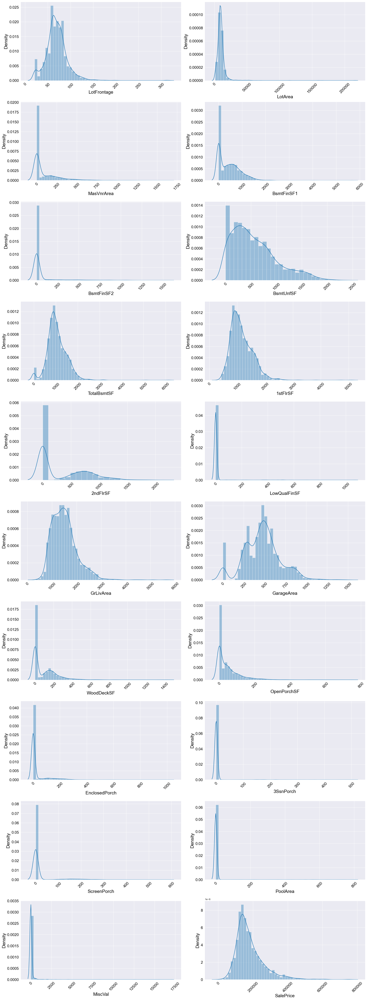

In [44]:
#Second alternative for visualization
fig = plt.figure(figsize=(20,140))
for index,col in enumerate(num_2.columns):
    plt.subplot(26,2,index+1)
    sns.distplot(x=num_2.iloc[:,index])
    plt.ylabel('Density', size = 18,color="black")
    plt.xlabel(col, fontsize = 18,color="black")

    plt.xticks(size = 15,color="black", rotation = 45 )
    plt.yticks(size = 15,color="black" )

fig.tight_layout(pad=1.0)

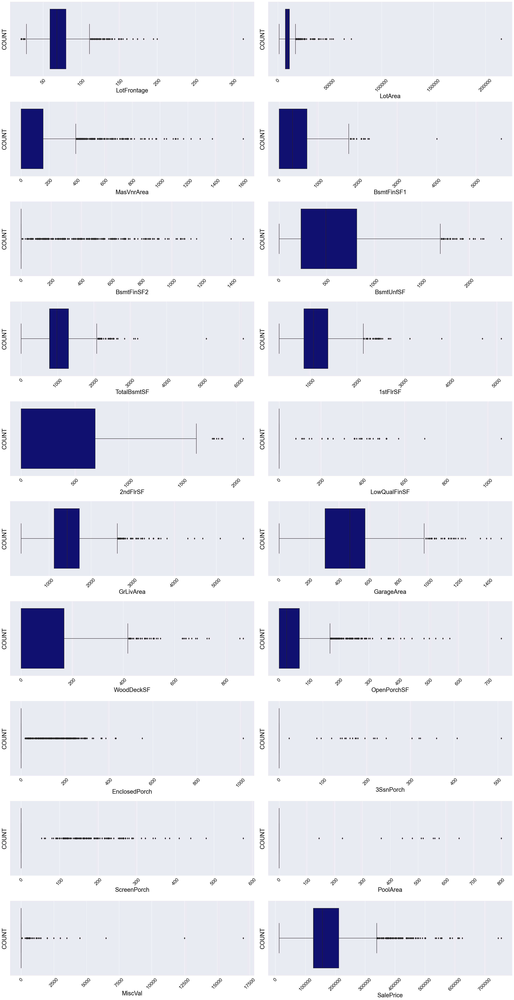

In [45]:
fig = plt.figure(figsize=(30,150))
for index,col in enumerate(num_2):
    plt.subplot(26,2,index+1)
    sns.boxplot(x=col, data=num_2.dropna(), color='navy')
    plt.ylabel('COUNT', size = 25,color="black" )
    plt.xlabel(col, fontsize = 25,color="black" )
    plt.xticks(size = 20,color="black", rotation = 45 )
    plt.yticks(size = 20,color="black" )

fig.tight_layout(pad=1.0)

#### 2.1.B.a Elimination of the columns with more then 90% zero

In [46]:
#Check the features have zero value
num_zeros_per_col = (train == 0).sum(axis=0).sort_values(ascending=False).reset_index().rename(columns={'index': 'Feature', 0: 'Count'})
num_zeros_per_col['Proportion'] = num_zeros_per_col['Count'] / len(train)
zero_columns_90_percent = num_zeros_per_col[num_zeros_per_col['Proportion']>=0.90]
zero_columns_90_percent

,Feature,Count,Proportion
0,PoolArea,2906,1.00
1,3SsnPorch,2882,0.99
2,LowQualFinSF,2879,0.99
3,MiscVal,2816,0.96
4,BsmtHalfBath,2742,0.94
5,ScreenPorch,2663,0.91


In [47]:
#examine more columns with zero values
zero_columns = zero_columns_90_percent['Feature'].values
train[zero_columns].nunique()

PoolArea         14
3SsnPorch        31
LowQualFinSF     36
MiscVal          38
BsmtHalfBath      3
ScreenPorch     121
dtype: int64

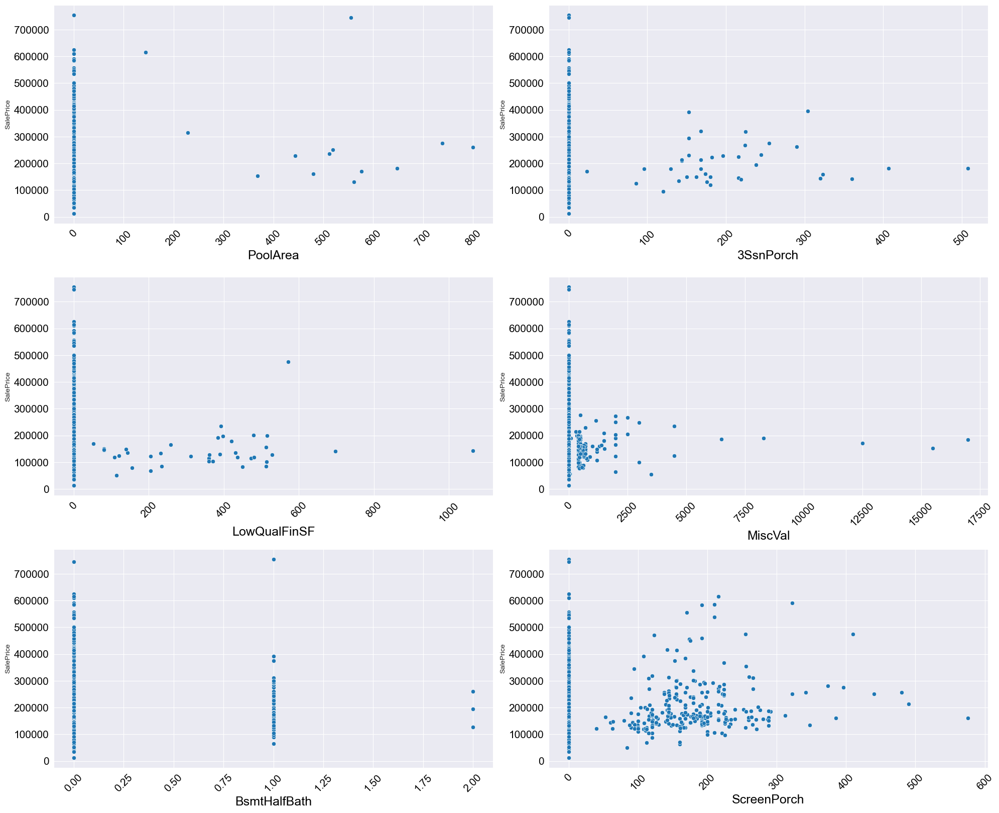

In [48]:

fig = plt.figure(figsize=(20,140))
for index,col in enumerate(train[zero_columns].columns):
    plt.subplot(26,2,index+1)
    sns.scatterplot(x=train[zero_columns].iloc[:,index], y=train['SalePrice'])
    plt.xlabel(col, fontsize = 18,color="black")

    plt.xticks(size = 15,color="black", rotation = 45 )
    plt.yticks(size = 15,color="black" )

fig.tight_layout(pad=1.0)

In [49]:
train[zero_columns].describe([0.25,0.50,0.75,0.99]).T

,count,mean,std,min,25%,50%,75%,99%,max
PoolArea,2919.00,2.25,35.66,0.00,0.00,0.00,0.00,0.00,800.00
3SsnPorch,2919.00,2.60,25.19,0.00,0.00,0.00,0.00,144.00,508.00
LowQualFinSF,2919.00,4.69,46.40,0.00,0.00,0.00,0.00,153.84,1064.00
MiscVal,2919.00,50.83,567.40,0.00,0.00,0.00,0.00,982.00,17000.00
BsmtHalfBath,2917.00,0.06,0.25,0.00,0.00,0.00,0.00,1.00,2.00
ScreenPorch,2919.00,16.06,56.18,0.00,0.00,0.00,0.00,259.82,576.00


In [50]:
zero_columns

array(['PoolArea', '3SsnPorch', 'LowQualFinSF', 'MiscVal', 'BsmtHalfBath',
       'ScreenPorch'], dtype=object)

In [51]:
train.head(20) #['SalePrice', 'PoolArea', '3SsnPorch', 'LowQualFinSF', 'MiscVal']

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Fence_,Fireplace_,Garage_,Alley_
0,1,60,RL,65.00,8450,Absence,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,856.00,Ex,Y,SBrkr,856,854,0,1710,1.00,0.00,2,1,3,1,Gd,8,Typ,0,Absence,Attchd,2003.00,RFn,2.00,548.00,TA,TA,Y,0,61,0,0,0,0,Absence,0,2,2008,WD,Normal,208500,No,No,Yes,No
1,2,20,RL,80.00,9600,Absence,Reg,Lvl,rare_category,rare_category,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,NaN,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,1262.00,Ex,Y,SBrkr,1262,0,0,1262,0.00,1.00,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.00,RFn,2.00,460.00,TA,TA,Y,298,0,0,0,0,0,Absence,0,5,2007,WD,Normal,181500,No,Yes,Yes,No
2,3,60,RL,68.00,11250,Absence,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,920.00,Ex,Y,SBrkr,920,866,0,1786,1.00,0.00,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.00,RFn,2.00,608.00,TA,TA,Y,0,42,0,0,0,0,Absence,0,9,2008,WD,Normal,223500,No,Yes,Yes,No
3,4,70,RL,60.00,9550,Absence,IR1,Lvl,Corner,rare_category,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,rare_category,NaN,0.00,TA,TA,BrkTil,TA,rare_category,No,ALQ,216.00,Unf,0.00,540.00,756.00,Gd,Y,SBrkr,961,756,0,1717,1.00,0.00,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.00,Unf,3.00,642.00,TA,TA,Y,0,35,272,0,0,0,Absence,0,2,2006,WD,Abnorml,140000,No,Yes,Yes,No
4,5,60,RL,84.00,14260,Absence,IR1,Lvl,rare_category,rare_category,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,1145.00,Ex,Y,SBrkr,1145,1053,0,2198,1.00,0.00,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.00,RFn,3.00,836.00,TA,TA,Y,192,84,0,0,0,0,Absence,0,12,2008,WD,Normal,250000,No,Yes,Yes,No
5,6,50,RL,85.00,14115,Absence,IR1,Lvl,Inside,rare_category,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,NaN,0.00,TA,TA,rare_category,Gd,TA,No,GLQ,732.00,Unf,0.00,64.00,796.00,Ex,Y,SBrkr,796,566,0,1362,1.00,0.00,1,1,1,1,TA,5,Typ,0,Absence,Attchd,1993.00,Unf,2.00,480.00,TA,TA,Y,40,30,0,320,0,0,MnPrv,700,10,2009,WD,Normal,143000,Yes,No,Yes,No
6,7,20,RL,75.00,10084,Absence,Reg,Lvl,Inside,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.00,Gd,TA,PConc,Ex,TA,Av,GLQ,1369.00,Unf,0.00,317.00,1686.00,Ex,Y,SBrkr,1694,0,0,1694,1.00,0.00,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.00,RFn,2.00,636.00,TA,TA,Y,255,57,0,0,0,0,Absence,0,8,2007,WD,Normal,307000,No,Yes,Yes,No
7,8,60,RL,NaN,10382,Absence,IR1,Lvl,Corner,rare_category,rare_category,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.00,TA,TA,CBlock,Gd,TA,Mn,ALQ,859.00,rare_category,32.00,216.00,1107.00,Ex,Y,SBrkr,1107,983,0,2090,1.00,0.00,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.00,RFn,2.00,484.00,TA,TA,Y,235,204,228,0,0,0,Absence,350,11,2009,WD,Normal,200000,No,Yes,Yes,No
8,9,50,RM,51.00,6120,Absence,Reg,Lvl,Inside,OldTown,rare_category,1Fam,1.5Fin,7,5,1931,1950,Gable,rare_category,rare_category,NaN,0.00,TA,TA,BrkTil,TA,TA,No,Unf,0.00,Unf,0.00,952.00,952.00,Gd,Y,rare_category,1022,752,0,1774,0.00,0.00,2,0,2,2,TA,8,rare_category,2,TA,Detchd,1931.00,Unf,2.00,468.00,rare_category,TA,Y,90,0,205,0,0,0,Absence,0,4,2008,WD,Abnorml,129900,No,Yes,Yes,No
9,10,190,RL,50.00,7420,Absence,R

In [52]:
zero_columns

array(['PoolArea', '3SsnPorch', 'LowQualFinSF', 'MiscVal', 'BsmtHalfBath',
       'ScreenPorch'], dtype=object)

In [53]:
#dropped the zero columns from orijinal dataset.
train = train.drop(zero_columns, axis=1)

print(train.shape)


(2919, 71)


In [54]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Fence_,Fireplace_,Garage_,Alley_
0,1,60,RL,65.00,8450,Absence,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,856.00,Ex,Y,SBrkr,856,854,1710,1.00,2,1,3,1,Gd,8,Typ,0,Absence,Attchd,2003.00,RFn,2.00,548.00,TA,TA,Y,0,61,0,Absence,2,2008,WD,Normal,208500,No,No,Yes,No
1,2,20,RL,80.00,9600,Absence,Reg,Lvl,rare_category,rare_category,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,NaN,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,1262.00,Ex,Y,SBrkr,1262,0,1262,0.00,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.00,RFn,2.00,460.00,TA,TA,Y,298,0,0,Absence,5,2007,WD,Normal,181500,No,Yes,Yes,No
2,3,60,RL,68.00,11250,Absence,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,920.00,Ex,Y,SBrkr,920,866,1786,1.00,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.00,RFn,2.00,608.00,TA,TA,Y,0,42,0,Absence,9,2008,WD,Normal,223500,No,Yes,Yes,No
3,4,70,RL,60.00,9550,Absence,IR1,Lvl,Corner,rare_category,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,rare_category,NaN,0.00,TA,TA,BrkTil,TA,rare_category,No,ALQ,216.00,Unf,0.00,540.00,756.00,Gd,Y,SBrkr,961,756,1717,1.00,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.00,Unf,3.00,642.00,TA,TA,Y,0,35,272,Absence,2,2006,WD,Abnorml,140000,No,Yes,Yes,No
4,5,60,RL,84.00,14260,Absence,IR1,Lvl,rare_category,rare_category,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,1145.00,Ex,Y,SBrkr,1145,1053,2198,1.00,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.00,RFn,3.00,836.00,TA,TA,Y,192,84,0,Absence,12,2008,WD,Normal,250000,No,Yes,Yes,No


### 2.1.C. Other Features (Numeric But Categoric)

In [55]:
num_but_cat = train[['MoSold','MSSubClass','OverallCond','OverallQual','GarageCars','BsmtFullBath', 'FullBath',
                  'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces']]
num_but_cat

,MoSold,MSSubClass,OverallCond,OverallQual,GarageCars,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces
0,2,60,5,7,2.00,1.00,2,1,3,1,8,0
1,5,20,8,6,2.00,0.00,2,0,3,1,6,1
2,9,60,5,7,2.00,1.00,2,1,3,1,6,1
3,2,70,5,7,3.00,1.00,1,0,3,1,7,1
4,12,60,5,8,3.00,1.00,2,1,4,1,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2914,6,160,7,4,0.00,0.00,1,1,3,1,5,0
2915,4,160,5,4,1.00,0.00,1,1,3,1,6,0
2916,9,20,7,5,2.00,1.00,1,0,4,1,7,1
2917,7,85,5,5,0.00,0.00,1,0,3,1,6,0


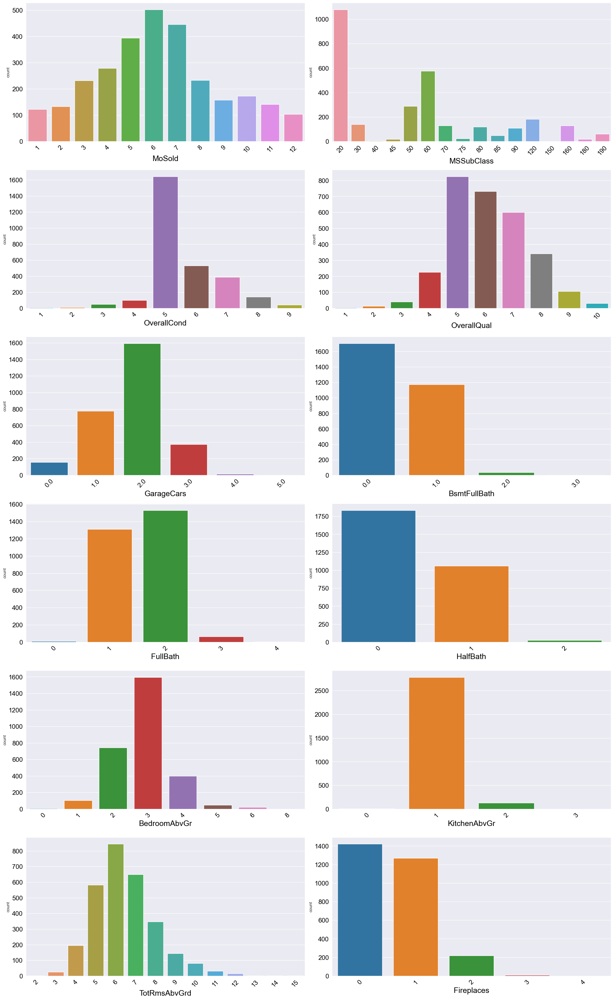

In [56]:
fig = plt.figure(figsize=(20,140))
for index,col in enumerate(num_but_cat.columns):
    plt.subplot(26,2,index+1)
    sns.countplot(x=num_but_cat.iloc[:,index], data=num_but_cat.dropna())
    plt.xlabel(col, fontsize = 18,color="black")

    plt.xticks(size = 15,color="black", rotation = 45 )
    plt.yticks(size = 15,color="black" )

fig.tight_layout(pad=1.0)

In [57]:
#Creating new features
# Define a lambda function to map each month to its corresponding season
season_map = lambda x: "Winter" if x in [12, 1, 2] else \
                       "Spring" if x in [3, 4, 5] else \
                       "Summer" if x in [6, 7, 8] else \
                       "Fall" if x in [9, 10, 11] else None

# Apply the lambda function to create a new "season" column based on the "MoSold" column
train["sold_season"] = train["MoSold"].apply(season_map)

In [58]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Fence_,Fireplace_,Garage_,Alley_,sold_season
0,1,60,RL,65.00,8450,Absence,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,856.00,Ex,Y,SBrkr,856,854,1710,1.00,2,1,3,1,Gd,8,Typ,0,Absence,Attchd,2003.00,RFn,2.00,548.00,TA,TA,Y,0,61,0,Absence,2,2008,WD,Normal,208500,No,No,Yes,No,Winter
1,2,20,RL,80.00,9600,Absence,Reg,Lvl,rare_category,rare_category,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,NaN,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,1262.00,Ex,Y,SBrkr,1262,0,1262,0.00,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.00,RFn,2.00,460.00,TA,TA,Y,298,0,0,Absence,5,2007,WD,Normal,181500,No,Yes,Yes,No,Spring
2,3,60,RL,68.00,11250,Absence,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,920.00,Ex,Y,SBrkr,920,866,1786,1.00,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.00,RFn,2.00,608.00,TA,TA,Y,0,42,0,Absence,9,2008,WD,Normal,223500,No,Yes,Yes,No,Fall
3,4,70,RL,60.00,9550,Absence,IR1,Lvl,Corner,rare_category,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,rare_category,NaN,0.00,TA,TA,BrkTil,TA,rare_category,No,ALQ,216.00,Unf,0.00,540.00,756.00,Gd,Y,SBrkr,961,756,1717,1.00,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.00,Unf,3.00,642.00,TA,TA,Y,0,35,272,Absence,2,2006,WD,Abnorml,140000,No,Yes,Yes,No,Winter
4,5,60,RL,84.00,14260,Absence,IR1,Lvl,rare_category,rare_category,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,1145.00,Ex,Y,SBrkr,1145,1053,2198,1.00,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.00,RFn,3.00,836.00,TA,TA,Y,192,84,0,Absence,12,2008,WD,Normal,250000,No,Yes,Yes,No,Winter


### 2.1.D. Time Features

In [59]:
#validating date data
year_data = train[['GarageYrBlt', 'YearBuilt', 'YearRemodAdd', 'YrSold']]
year_data.agg(['min','max'])

,GarageYrBlt,YearBuilt,YearRemodAdd,YrSold
min,1895.00,1872,1950,2006
max,2207.00,2010,2010,2010


In [60]:
#There are 9 observations that year garage was built earlier than original construction date. Is it possible?
check = train[train['GarageYrBlt'] < train['YearBuilt']]
check['GarageYrBlt'] = check['GarageYrBlt'].astype('int')
check[['GarageYrBlt', 'YearBuilt']]

,GarageYrBlt,YearBuilt
29,1920,1927
93,1900,1910
324,1961,1967
600,2003,2005
736,1949,1950
1103,1954,1959
1376,1925,1930
1414,1922,1923
1418,1962,1963
1521,1956,1959


In [69]:
##inconsistency
check_2 = train[train['YearRemodAdd'] < train['YearBuilt']]
check_2[['YearRemodAdd', 'YearBuilt']]

,YearRemodAdd,YearBuilt
416,2001,2002


In [61]:
#removed the inconsistency row
train = train.drop(416)

In [62]:
#check again
check_2 = train[train['YearRemodAdd'] < train['YearBuilt']]
check_2[['YearRemodAdd', 'YearBuilt']]

,YearRemodAdd,YearBuilt
1876,2001,2002


In [63]:
#inconsistency
check_3 = train[train['YrSold'] < train['YearBuilt']]
check_3[['YrSold', 'YearBuilt']]

,YrSold,YearBuilt
2549,2007,2008


In [64]:
#removed the inconsistence row
train = train.drop(1089)

In [65]:
#ok
check_3 = train[train['YrSold'] < train['YearBuilt']]
check_3[['YrSold', 'YearBuilt']]

,YrSold,YearBuilt
2549,2007,2008


In [66]:
#inconsistency
check_4 = train[train['GarageYrBlt'] > 2023]
check_4[['GarageYrBlt','YearRemodAdd', 'YearBuilt']]

,GarageYrBlt,YearRemodAdd,YearBuilt
2592,2207.00,2007,2006


In [67]:
#removed the inconsistence row
train = train.drop(1132)

In [68]:
#ok
check_4 = train[train['GarageYrBlt'] > 2023]
check_4[['GarageYrBlt','YearRemodAdd', 'YearBuilt']]

,GarageYrBlt,YearRemodAdd,YearBuilt
2592,2207.00,2007,2006


In [69]:
#it seems that years are same as construction date if no remodeling or additions. Thats why we have decided to remove YearBuilt column.
check_4 = train[train['YearRemodAdd'] == train['YearBuilt']]
check_4[['YearRemodAdd', 'YearBuilt']]

,YearRemodAdd,YearBuilt
0,2003,2003
1,1976,1976
4,2000,2000
7,1973,1973
10,1965,1965
...,...,...
2912,1970,1970
2913,1970,1970
2914,1970,1970
2915,1970,1970


In [71]:
#We have changed the year columns to age by extracting from today(year).
#import datetime

today = datetime.date.today()

year = today.year

print(year)

2023


In [72]:
train['AgeBuilt'] = year - train['YearRemodAdd']

print(train['AgeBuilt'].head())


0    20
1    47
2    21
3    53
4    23
Name: AgeBuilt, dtype: int64


In [73]:
train['AgeSale'] = year - train['YrSold']

print(train['AgeSale'].head())


0    15
1    16
2    15
3    17
4    15
Name: AgeSale, dtype: int64


In [74]:
#We have changed the missing values with 2023 due to missing values mean that there is no garage before we calculate the age of the garage. (We want to set 0 age of garage.)
train['GarageYrBlt'] = train['GarageYrBlt'].fillna('2023')

print(train['GarageYrBlt'].isnull().sum())


0


In [75]:
train['GarageYrBlt'] = train['GarageYrBlt'].astype(int)


In [76]:
train['AgeGarage'] = year - train['GarageYrBlt']


print(train['AgeGarage'].head())

0    20
1    47
2    22
3    25
4    23
Name: AgeGarage, dtype: int64


In [85]:
#removed the all year columns. (except YrSold due to there is possible to combine with month column)
train = train.drop(['YearBuilt','YearRemodAdd', 'GarageYrBlt','YrSold'], axis=1)

print(train.shape)


(2913, 71)


## 2.2 Correlation Analysis

In [78]:
train.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Fence_,Fireplace_,Garage_,Alley_,sold_season,AgeBuilt,AgeSale,AgeGarage
0,1,60,RL,65.00,8450,Absence,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,856.00,Ex,Y,SBrkr,856,854,1710,1.00,2,1,3,1,Gd,8,Typ,0,Absence,Attchd,2003,RFn,2.00,548.00,TA,TA,Y,0,61,0,Absence,2,2008,WD,Normal,208500,No,No,Yes,No,Winter,20,15,20
1,2,20,RL,80.00,9600,Absence,Reg,Lvl,rare_category,rare_category,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,NaN,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,1262.00,Ex,Y,SBrkr,1262,0,1262,0.00,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2.00,460.00,TA,TA,Y,298,0,0,Absence,5,2007,WD,Normal,181500,No,Yes,Yes,No,Spring,47,16,47
2,3,60,RL,68.00,11250,Absence,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,920.00,Ex,Y,SBrkr,920,866,1786,1.00,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2.00,608.00,TA,TA,Y,0,42,0,Absence,9,2008,WD,Normal,223500,No,Yes,Yes,No,Fall,21,15,22
3,4,70,RL,60.00,9550,Absence,IR1,Lvl,Corner,rare_category,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,rare_category,NaN,0.00,TA,TA,BrkTil,TA,rare_category,No,ALQ,216.00,Unf,0.00,540.00,756.00,Gd,Y,SBrkr,961,756,1717,1.00,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3.00,642.00,TA,TA,Y,0,35,272,Absence,2,2006,WD,Abnorml,140000,No,Yes,Yes,No,Winter,53,17,25
4,5,60,RL,84.00,14260,Absence,IR1,Lvl,rare_category,rare_category,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,1145.00,Ex,Y,SBrkr,1145,1053,2198,1.00,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3.00,836.00,TA,TA,Y,192,84,0,Absence,12,2008,WD,Normal,250000,No,Yes,Yes,No,Winter,23,15,23
5,6,50,RL,85.00,14115,Absence,IR1,Lvl,Inside,rare_category,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,NaN,0.00,TA,TA,rare_category,Gd,TA,No,GLQ,732.00,Unf,0.00,64.00,796.00,Ex,Y,SBrkr,796,566,1362,1.00,1,1,1,1,TA,5,Typ,0,Absence,Attchd,1993,Unf,2.00,480.00,TA,TA,Y,40,30,0,MnPrv,10,2009,WD,Normal,143000,Yes,No,Yes,No,Fall,28,14,30
6,7,20,RL,75.00,10084,Absence,Reg,Lvl,Inside,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.00,Gd,TA,PConc,Ex,TA,Av,GLQ,1369.00,Unf,0.00,317.00,1686.00,Ex,Y,SBrkr,1694,0,1694,1.00,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004,RFn,2.00,636.00,TA,TA,Y,255,57,0,Absence,8,2007,WD,Normal,307000,No,Yes,Yes,No,Summer,18,16,19
7,8,60,RL,NaN,10382,Absence,IR1,Lvl,Corner,rare_category,rare_category,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.00,TA,TA,CBlock,Gd,TA,Mn,ALQ,859.00,rare_category,32.00,216.00,1107.00,Ex,Y,SBrkr,1107,983,2090,1.00,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973,RFn,2.00,484.00,TA,TA,Y,235,204,228,Absence,11,2009,WD,Normal,200000,No,Yes,Yes,No,Fall,50,14,50
8,9,50,RM,51.00,6120,Absence,Reg,Lvl,Inside,OldTown,rare_category,1Fam,1.5Fin,7,5,1931,1950,Gable,rare_category,rare_category,NaN,0.00,TA,TA,BrkTil,TA,TA,No,Unf,0.00,Unf,0.00,952.00,952.00,Gd,Y,rare_category,1022,752,1774,0.00,2,0,2,2,TA,8,rare_category,2,TA,Detchd,1931,Unf,2.00,468.00,rare_category,TA,Y,90,0,205,Absence,4,2008,WD,Abnorml,129900,No,Yes,Yes,No,Spring,73,15,92
9,10,190,RL,50.00,7420,Absence,Reg,Lvl,Corner,rare_category,rare_category,rare_category,

In [87]:
tr_corr = train.corr(numeric_only = "Bool")
tr_corr

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SalePrice,AgeBuilt,AgeSale,AgeGarage
Id,1.00,0.01,-0.03,-0.04,-0.03,-0.00,-0.02,-0.05,-0.03,-0.02,0.02,-0.01,-0.03,-0.01,-0.02,-0.03,-0.00,-0.01,-0.01,0.00,-0.01,-0.03,-0.04,-0.02,-0.01,-0.01,-0.01,0.01,0.02,0.01,-0.26,-0.02,0.05,0.26,0.02
MSSubClass,0.01,1.00,-0.42,-0.20,0.03,-0.07,0.03,0.04,0.01,-0.06,-0.07,-0.13,-0.22,-0.25,0.31,0.07,0.01,0.14,0.18,-0.01,0.26,0.04,-0.06,0.12,-0.05,-0.10,-0.02,-0.02,-0.02,-0.00,-0.01,-0.09,-0.04,0.01,-0.12
LotFrontage,-0.03,-0.42,1.00,0.49,0.22,-0.08,0.12,0.09,0.22,0.22,0.05,0.11,0.36,0.46,0.03,0.38,0.11,0.18,0.04,0.23,0.00,0.35,0.26,0.03,0.31,0.36,0.12,0.17,0.01,0.01,-0.01,0.36,-0.09,0.01,-0.03
LotArea,-0.04,-0.20,0.49,1.00,0.10,-0.04,0.02,0.02,0.13,0.19,0.08,0.02,0.25,0.33,0.03,0.28,0.13,0.13,0.03,0.13,-0.02,0.21,0.26,-0.04,0.18,0.21,0.16,0.10,0.02,0.00,-0.02,0.27,-0.02,0.02,0.04
OverallQual,-0.03,0.03,0.22,0.10,1.00,-0.09,0.60,0.57,0.43,0.28,-0.04,0.28,0.55,0.48,0.25,0.58,0.16,0.53,0.27,0.07,-0.16,0.39,0.39,0.41,0.60,0.57,0.26,0.30,-0.14,0.03,-0.02,0.80,-0.57,0.02,-0.41
OverallCond,-0.00,-0.07,-0.08,-0.04,-0.09,1.00,-0.37,0.05,-0.14,-0.05,0.04,-0.14,-0.17,-0.16,0.01,-0.12,-0.04,-0.22,-0.09,-0.01,-0.09,-0.09,-0.03,-0.30,-0.18,-0.15,0.02,-0.07,0.07,-0.01,0.03,-0.10,-0.05,-0.03,0.30
YearBuilt,-0.02,0.03,0.12,0.02,0.60,-0.37,1.00,0.61,0.31,0.28,-0.03,0.13,0.41,0.31,0.02,0.24,0.21,0.47,0.27,-0.05,-0.14,0.12,0.17,0.65,0.54,0.48,0.23,0.20,-0.37,0.01,-0.01,0.56,-0.61,0.01,-0.65
YearRemodAdd,-0.05,0.04,0.09,0.02,0.57,0.05,0.61,1.00,0.20,0.15,-0.06,0.17,0.30,0.24,0.16,0.32,0.13,0.46,0.21,-0.02,-0.14,0.20,0.13,0.54,0.43,0.38,0.22,0.24,-0.22,0.02,0.03,0.53,-1.00,-0.03,-0.54
MasVnrArea,-0.03,0.01,0.22,0.13,0.43,-0.14,0.31,0.20,1.00,0.30,-0.02,0.09,0.40,0.40,0.12,0.40,0.14,0.26,0.19,0.08,-0.05,0.28,0.28,0.19,0.36,0.37,0.17,0.14,-0.11,-0.00,-0.02,0.51,-0.20,0.02,-0.19
BsmtFinSF1,-0.02,-0.06,0.22,0.19,0.28,-0.05,0.28,0.15,0.30,1.00,-0.06,-0.48,0.54,0.46,-0.16,0.21,0.64,0.08,-0.01,-0.11,-0.09,0.05,0.29,0.13,0.26,0.31,0.22,0.12,-0.10,-0.00,0.02,0.43,-0.15,-0.02,-0.13


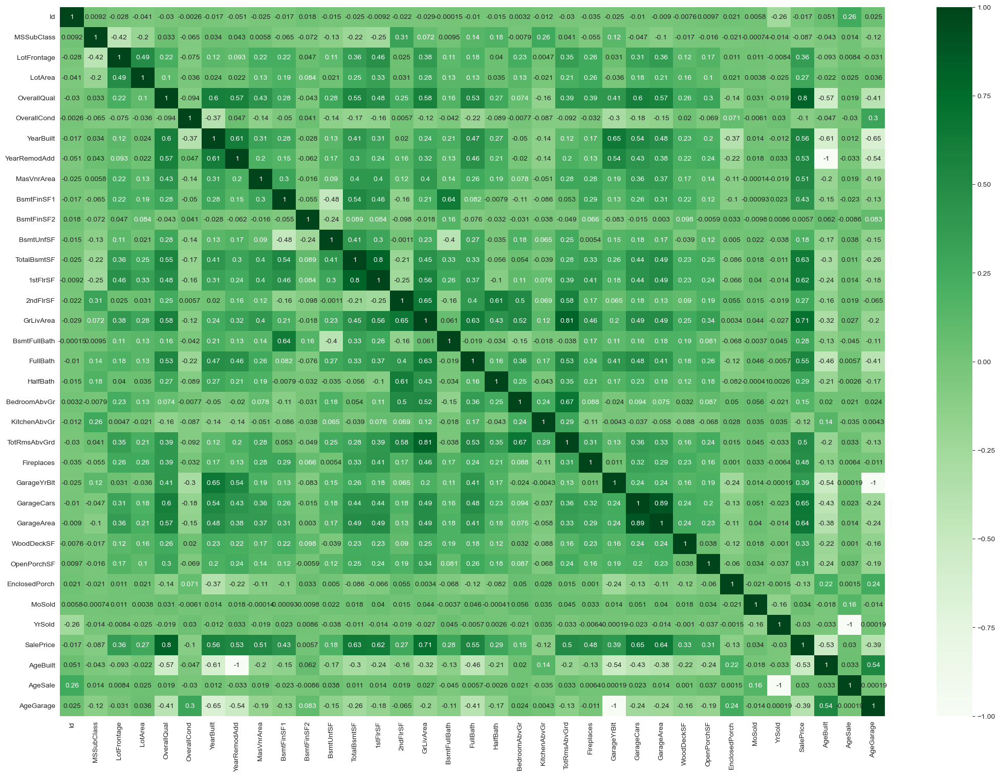

In [88]:
#checked correlations
plt.figure(figsize=(26,18))
ax=sns.heatmap(tr_corr, cmap='Greens', annot=True)
plt.show()

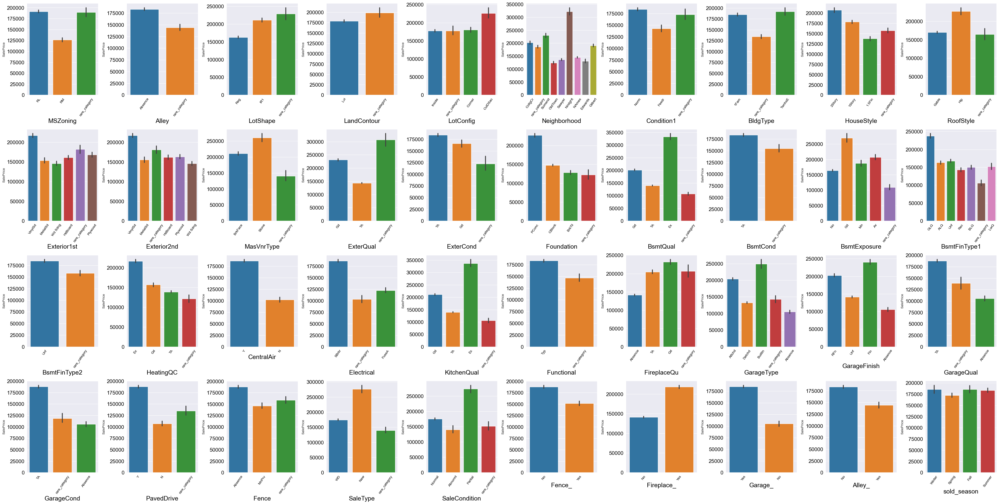

In [80]:
#Analysis of relationship between categorical variables and target variable
cat_3 = train.select_dtypes(include='object')
num_cols = cat_3.shape[1]  # get number of columns in cat_3

fig = plt.figure(figsize=(40, 5*num_cols))
for index,col in enumerate(cat_3.columns):
    plt.subplot(num_cols, 10, index+1)
    sns.barplot(x=cat_3[col], y=train['SalePrice'])
    plt.xlabel(col, fontsize=18, color="black")
    plt.xticks(size=10, color="black", rotation=55)
    plt.yticks(size=15, color="black")

fig.tight_layout(pad=1.0)

## 2.3 Feature Engineering

#### 2.3.A Missing Values

In [89]:
#checked missing values
null = pd.DataFrame(train.isnull().sum())
null = null.reset_index()
null = null.rename(columns={'index': 'Variables', 0:'Count'})
null['Proportion'] = null['Count']/len(train)
#checked only columns with null values
null_col = null[null['Count']>0].sort_values('Proportion', ascending=False)
null_col = null_col['Variables'].values

In [90]:
null[null['Count']>0].sort_values('Proportion', ascending=False)

,Variables,Count,Proportion
20,MasVnrType,1764,0.60
3,LotFrontage,486,0.17
21,MasVnrArea,23,0.01
2,MSZoning,4,0.00
47,Functional,2,0.00
40,BsmtFullBath,2,0.00
36,Electrical,1,0.00
54,GarageArea,1,0.00
53,GarageCars,1,0.00
45,KitchenQual,1,0.00


In [91]:
train[null_col].info()

<class 'pandas.core.frame.DataFrame'>
Index: 2916 entries, 0 to 2918
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MasVnrType    1152 non-null   object 
 1   LotFrontage   2430 non-null   float64
 2   MasVnrArea    2893 non-null   float64
 3   MSZoning      2912 non-null   object 
 4   Functional    2914 non-null   object 
 5   BsmtFullBath  2914 non-null   float64
 6   Electrical    2915 non-null   object 
 7   GarageArea    2915 non-null   float64
 8   GarageCars    2915 non-null   float64
 9   KitchenQual   2915 non-null   object 
 10  BsmtUnfSF     2915 non-null   float64
 11  TotalBsmtSF   2915 non-null   float64
 12  BsmtFinSF2    2915 non-null   float64
 13  BsmtFinSF1    2915 non-null   float64
 14  Exterior2nd   2915 non-null   object 
 15  Exterior1st   2915 non-null   object 
 16  SaleType      2915 non-null   object 
dtypes: float64(9), object(8)
memory usage: 410.1+ KB


<Figure size 1000x600 with 0 Axes>

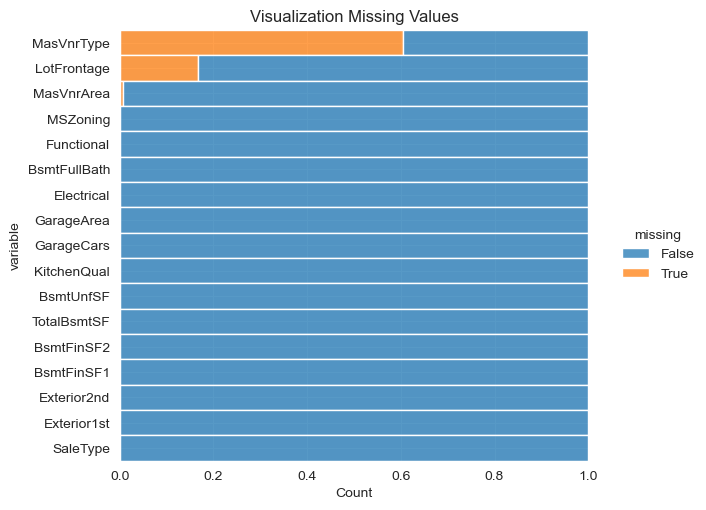

In [92]:
#first alternative categorical variables with null values
plt.figure(figsize=(10,6))
sns.displot(
    data=train[null_col].isnull().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25)
plt.title('Visualization Missing Values')
plt.show()

<Axes: >

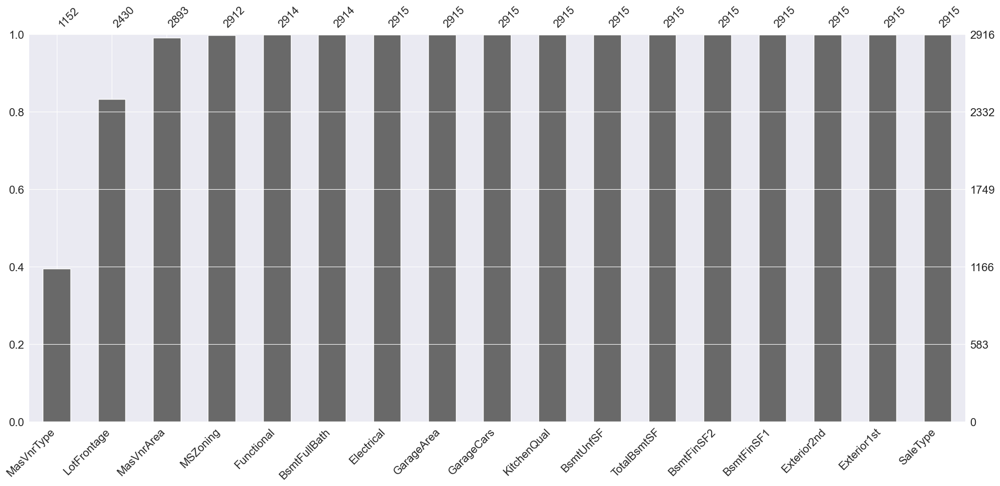

In [101]:
import missingno as msno
#Second alternative categorical variables with null values
msno.bar(train[null_col])

ValueError: keyword grid_b is not recognized; valid keywords are ['size', 'width', 'color', 'tickdir', 'pad', 'labelsize', 'labelcolor', 'zorder', 'gridOn', 'tick1On', 'tick2On', 'label1On', 'label2On', 'length', 'direction', 'left', 'bottom', 'right', 'top', 'labelleft', 'labelbottom', 'labelright', 'labeltop', 'labelrotation', 'grid_agg_filter', 'grid_alpha', 'grid_animated', 'grid_antialiased', 'grid_clip_box', 'grid_clip_on', 'grid_clip_path', 'grid_color', 'grid_dash_capstyle', 'grid_dash_joinstyle', 'grid_dashes', 'grid_data', 'grid_drawstyle', 'grid_figure', 'grid_fillstyle', 'grid_gapcolor', 'grid_gid', 'grid_in_layout', 'grid_label', 'grid_linestyle', 'grid_linewidth', 'grid_marker', 'grid_markeredgecolor', 'grid_markeredgewidth', 'grid_markerfacecolor', 'grid_markerfacecoloralt', 'grid_markersize', 'grid_markevery', 'grid_mouseover', 'grid_path_effects', 'grid_picker', 'grid_pickradius', 'grid_rasterized', 'grid_sketch_params', 'grid_snap', 'grid_solid_capstyle', 'grid_solid_joinstyle', 'grid_transform', 'grid_url', 'grid_visible', 'grid_xdata', 'grid_ydata', 'grid_zorder', 'grid_aa', 'grid_c', 'grid_ds', 'grid_ls', 'grid_lw', 'grid_mec', 'grid_mew', 'grid_mfc', 'grid_mfcalt', 'grid_ms']

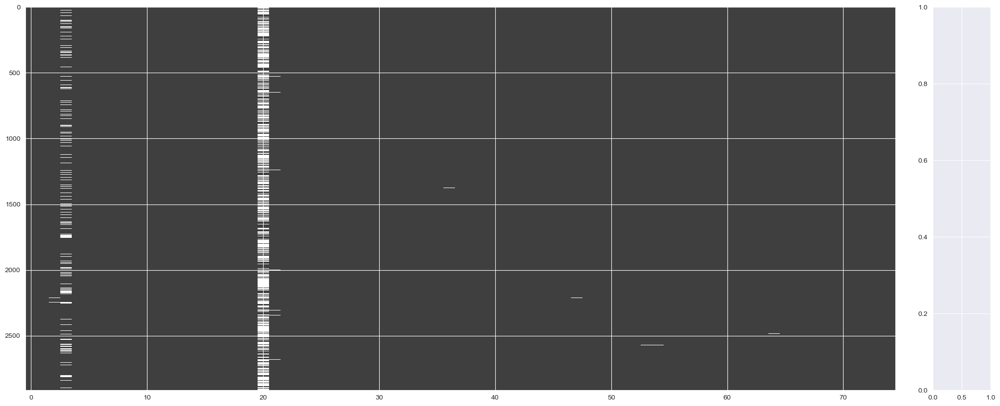

In [102]:
#checked whether missing values are at random.
msno.matrix(train)

<Axes: >

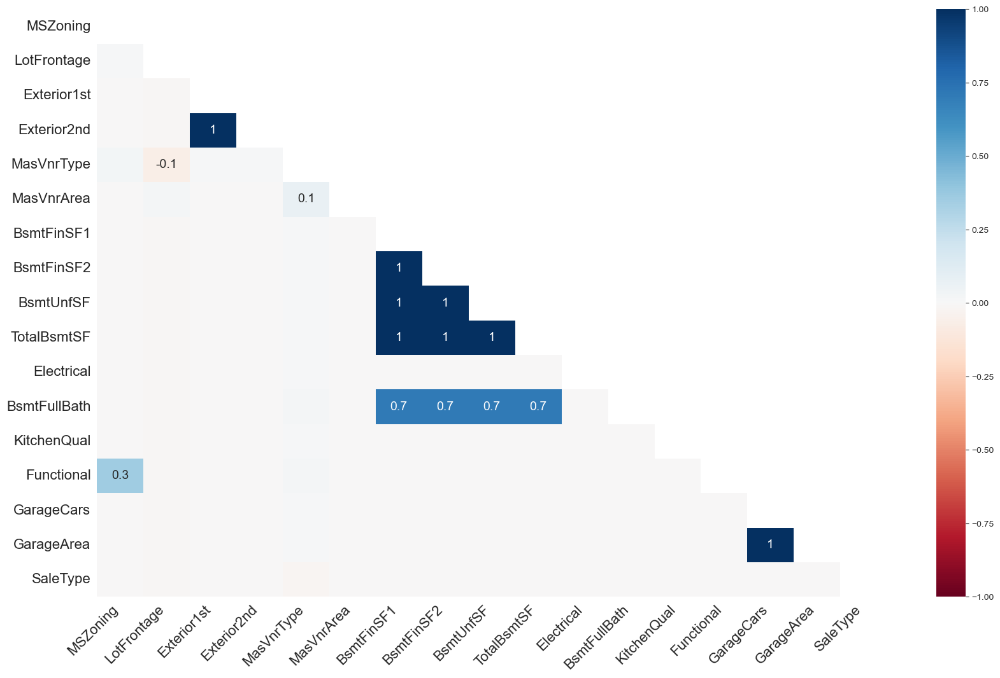

In [103]:
#Third alternative - shown graph of correlation of missing values between columns and explains the dependencies of missingness between columns
#https://medium.com/codex/how-to-identify-and-visualize-missing-values-with-python-3b304b06fe21
#the redder the color, the lower the correlation between missing values of the columns. The bluer it is, the higher the correlation of missingness.
#Close to -1: there is an anti-correlation between 2 columns: if column A has values, then column B has null values.
#Close to 0: no correlation due to the presence of null values between the columns
#Close to 1: strong correlation due to the presence of null values between the columns
msno.heatmap(train)

In [104]:
#sns.boxplot(train[null_col])
#plt.xticks(rotation=45)

In [105]:
train[null_col]

,MasVnrType,LotFrontage,MasVnrArea,MSZoning,Functional,BsmtFullBath,Electrical,GarageArea,GarageCars,KitchenQual,BsmtUnfSF,TotalBsmtSF,BsmtFinSF2,BsmtFinSF1,Exterior2nd,Exterior1st,SaleType
0,BrkFace,65.00,196.00,RL,Typ,1.00,SBrkr,548.00,2.00,Gd,150.00,856.00,0.00,706.00,VinylSd,VinylSd,WD
1,NaN,80.00,0.00,RL,Typ,0.00,SBrkr,460.00,2.00,TA,284.00,1262.00,0.00,978.00,MetalSd,MetalSd,WD
2,BrkFace,68.00,162.00,RL,Typ,1.00,SBrkr,608.00,2.00,Gd,434.00,920.00,0.00,486.00,VinylSd,VinylSd,WD
3,NaN,60.00,0.00,RL,Typ,1.00,SBrkr,642.00,3.00,Gd,540.00,756.00,0.00,216.00,rare_category,Wd Sdng,WD
4,BrkFace,84.00,350.00,RL,Typ,1.00,SBrkr,836.00,3.00,Gd,490.00,1145.00,0.00,655.00,VinylSd,VinylSd,WD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,NaN,21.00,0.00,RM,Typ,0.00,SBrkr,0.00,0.00,TA,546.00,546.00,0.00,0.00,rare_category,rare_category,WD
2915,NaN,21.00,0.00,RM,Typ,0.00,SBrkr,286.00,1.00,TA,294.00,546.00,0.00,252.00,rare_category,rare_category,WD
2916,NaN,160.00,0.00,RL,Typ,1.00,SBrkr,576.00,2.00,TA,0.00,1224.00,0.00,1224.00,VinylSd,VinylSd,WD
2917,NaN,62.00,0.00,RL,Typ,0.00,SBrkr,0.00,0.00,TA,575.00,912.00,0.00,337.00,rare_category,HdBoard,WD


In [106]:
train[null_col].describe().T

,count,mean,std,min,25%,50%,75%,max
LotFrontage,2430.00,69.31,23.35,21.00,59.00,68.00,80.00,313.00
MasVnrArea,2893.00,102.24,179.40,0.00,0.00,0.00,164.00,1600.00
BsmtFullBath,2914.00,0.43,0.52,0.00,0.00,0.00,1.00,3.00
GarageArea,2915.00,472.95,215.44,0.00,320.00,480.00,576.00,1488.00
GarageCars,2915.00,1.77,0.76,0.00,1.00,2.00,2.00,5.00
BsmtUnfSF,2915.00,560.77,439.64,0.00,220.00,467.00,805.00,2336.00
TotalBsmtSF,2915.00,1051.86,440.92,0.00,793.00,989.00,1302.00,6110.00
BsmtFinSF2,2915.00,49.63,169.29,0.00,0.00,0.00,0.00,1526.00
BsmtFinSF1,2915.00,441.45,455.62,0.00,0.00,369.00,733.00,5644.00


In [107]:
train[null_col].info()

<class 'pandas.core.frame.DataFrame'>
Index: 2916 entries, 0 to 2918
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MasVnrType    1152 non-null   object 
 1   LotFrontage   2430 non-null   float64
 2   MasVnrArea    2893 non-null   float64
 3   MSZoning      2912 non-null   object 
 4   Functional    2914 non-null   object 
 5   BsmtFullBath  2914 non-null   float64
 6   Electrical    2915 non-null   object 
 7   GarageArea    2915 non-null   float64
 8   GarageCars    2915 non-null   float64
 9   KitchenQual   2915 non-null   object 
 10  BsmtUnfSF     2915 non-null   float64
 11  TotalBsmtSF   2915 non-null   float64
 12  BsmtFinSF2    2915 non-null   float64
 13  BsmtFinSF1    2915 non-null   float64
 14  Exterior2nd   2915 non-null   object 
 15  Exterior1st   2915 non-null   object 
 16  SaleType      2915 non-null   object 
dtypes: float64(9), object(8)
memory usage: 410.1+ KB


In [108]:
#from sklearn.impute import SimpleImputer

# Get the list of numeric and categorical columns
num_cols = train.select_dtypes(exclude=['object']).columns.tolist()
cat_cols = train.select_dtypes(include=['object']).columns.tolist()

# Impute the median for numeric columns and mode for categorical columns
imp_num = SimpleImputer(strategy='median')
imp_cat = SimpleImputer(strategy='most_frequent')

train[num_cols] = imp_num.fit_transform(train[num_cols])
train[cat_cols] = imp_cat.fit_transform(train[cat_cols])


In [109]:
train[null_col].describe().T

,count,mean,std,min,25%,50%,75%,max
LotFrontage,2916.00,69.09,21.32,21.00,60.00,68.00,78.00,313.00
MasVnrArea,2916.00,101.43,178.92,0.00,0.00,0.00,163.25,1600.00
BsmtFullBath,2916.00,0.43,0.52,0.00,0.00,0.00,1.00,3.00
GarageArea,2916.00,472.95,215.41,0.00,320.00,480.00,576.00,1488.00
GarageCars,2916.00,1.77,0.76,0.00,1.00,2.00,2.00,5.00
BsmtUnfSF,2916.00,560.74,439.57,0.00,220.00,467.00,804.50,2336.00
TotalBsmtSF,2916.00,1051.83,440.85,0.00,793.00,989.00,1302.00,6110.00
BsmtFinSF2,2916.00,49.62,169.26,0.00,0.00,0.00,0.00,1526.00
BsmtFinSF1,2916.00,441.42,455.54,0.00,0.00,369.00,733.00,5644.00


In [110]:
print(train.shape)


(2916, 75)


In [111]:
#checked missing values
null = pd.DataFrame(train.isnull().sum())
null = null.reset_index()
null = null.rename(columns={'index': 'Variables', 0:'Count'})
null['Proportion'] = null['Count']/len(train)
#checked only columns with null values
null[null['Count']>0].sort_values('Proportion', ascending=False)


,Variables,Count,Proportion


#### 2.3.B Outliers

In [112]:
num_cols = train.select_dtypes(exclude='object')
num_cols

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SalePrice,AgeBuilt,AgeSale,AgeGarage
0,1.00,60.00,65.00,8450.00,7.00,5.00,2003.00,2003.00,196.00,706.00,0.00,150.00,856.00,856.00,854.00,1710.00,1.00,2.00,1.00,3.00,1.00,8.00,0.00,2003.00,2.00,548.00,0.00,61.00,0.00,2.00,2008.00,208500.00,20.00,15.00,20.00
1,2.00,20.00,80.00,9600.00,6.00,8.00,1976.00,1976.00,0.00,978.00,0.00,284.00,1262.00,1262.00,0.00,1262.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,1976.00,2.00,460.00,298.00,0.00,0.00,5.00,2007.00,181500.00,47.00,16.00,47.00
2,3.00,60.00,68.00,11250.00,7.00,5.00,2001.00,2002.00,162.00,486.00,0.00,434.00,920.00,920.00,866.00,1786.00,1.00,2.00,1.00,3.00,1.00,6.00,1.00,2001.00,2.00,608.00,0.00,42.00,0.00,9.00,2008.00,223500.00,21.00,15.00,22.00
3,4.00,70.00,60.00,9550.00,7.00,5.00,1915.00,1970.00,0.00,216.00,0.00,540.00,756.00,961.00,756.00,1717.00,1.00,1.00,0.00,3.00,1.00,7.00,1.00,1998.00,3.00,642.00,0.00,35.00,272.00,2.00,2006.00,140000.00,53.00,17.00,25.00
4,5.00,60.00,84.00,14260.00,8.00,5.00,2000.00,2000.00,350.00,655.00,0.00,490.00,1145.00,1145.00,1053.00,2198.00,1.00,2.00,1.00,4.00,1.00,9.00,1.00,2000.00,3.00,836.00,192.00,84.00,0.00,12.00,2008.00,250000.00,23.00,15.00,23.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2915.00,160.00,21.00,1936.00,4.00,7.00,1970.00,1970.00,0.00,0.00,0.00,546.00,546.00,546.00,546.00,1092.00,0.00,1.00,1.00,3.00,1.00,5.00,0.00,2023.00,0.00,0.00,0.00,0.00,0.00,6.00,2006.00,90500.00,53.00,17.00,0.00
2915,2916.00,160.00,21.00,1894.00,4.00,5.00,1970.00,1970.00,0.00,252.00,0.00,294.00,546.00,546.00,546.00,1092.00,0.00,1.00,1.00,3.00,1.00,6.00,0.00,1970.00,1.00,286.00,0.00,24.00,0.00,4.00,2006.00,71000.00,53.00,17.00,53.00
2916,2917.00,20.00,160.00,20000.00,5.00,7.00,1960.00,1996.00,0.00,1224.00,0.00,0.00,1224.00,1224.00,0.00,1224.00,1.00,1.00,0.00,4.00,1.00,7.00,1.00,1960.00,2.00,576.00,474.00,0.00,0.00,9.00,2006.00,131000.00,27.00,17.00,63.00
2917,2918.00,85.00,62.00,10441.00,5.00,5.00,1992.00,1992.00,0.00,337.00,0.00,575.00,912.00,970.00,0.00,970.00,0.00,1.00,0.00,3.00,1.00,6.00,0.00,2023.00,0.00,0.00,80.00,32.00,0.00,7.00,2006.00,132000.00,31.00,17.00,0.00


In [113]:
num_cols.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2916.00,1460.60,842.95,1.00,730.75,1461.50,2190.25,2919.00
MSSubClass,2916.00,57.11,42.52,20.00,20.00,50.00,70.00,190.00
LotFrontage,2916.00,69.09,21.32,21.00,60.00,68.00,78.00,313.00
LotArea,2916.00,10171.35,7889.91,1300.00,7479.00,9455.00,11577.25,215245.00
OverallQual,2916.00,6.09,1.41,1.00,5.00,6.00,7.00,10.00
OverallCond,2916.00,5.56,1.11,1.00,5.00,5.00,6.00,9.00
YearBuilt,2916.00,1971.33,30.25,1872.00,1953.75,1973.00,2001.00,2010.00
YearRemodAdd,2916.00,1984.27,20.89,1950.00,1965.00,1993.00,2004.00,2010.00
MasVnrArea,2916.00,101.43,178.92,0.00,0.00,0.00,163.25,1600.00
BsmtFinSF1,2916.00,441.42,455.54,0.00,0.00,369.00,733.00,5644.00


In [114]:
num_cols_original = num_cols.drop(['Id','MSSubClass','OverallQual','OverallCond','BsmtFullBath','FullBath',
                        'HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','MoSold'], axis=1)


In [115]:
num_cols_original.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2916 entries, 0 to 2918
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   LotFrontage    2916 non-null   float64
 1   LotArea        2916 non-null   float64
 2   YearBuilt      2916 non-null   float64
 3   YearRemodAdd   2916 non-null   float64
 4   MasVnrArea     2916 non-null   float64
 5   BsmtFinSF1     2916 non-null   float64
 6   BsmtFinSF2     2916 non-null   float64
 7   BsmtUnfSF      2916 non-null   float64
 8   TotalBsmtSF    2916 non-null   float64
 9   1stFlrSF       2916 non-null   float64
 10  2ndFlrSF       2916 non-null   float64
 11  GrLivArea      2916 non-null   float64
 12  GarageYrBlt    2916 non-null   float64
 13  GarageArea     2916 non-null   float64
 14  WoodDeckSF     2916 non-null   float64
 15  OpenPorchSF    2916 non-null   float64
 16  EnclosedPorch  2916 non-null   float64
 17  YrSold         2916 non-null   float64
 18  SalePrice    

In [116]:
#sns.boxplot(num_cols_original)
#plt.xticks(rotation=50)

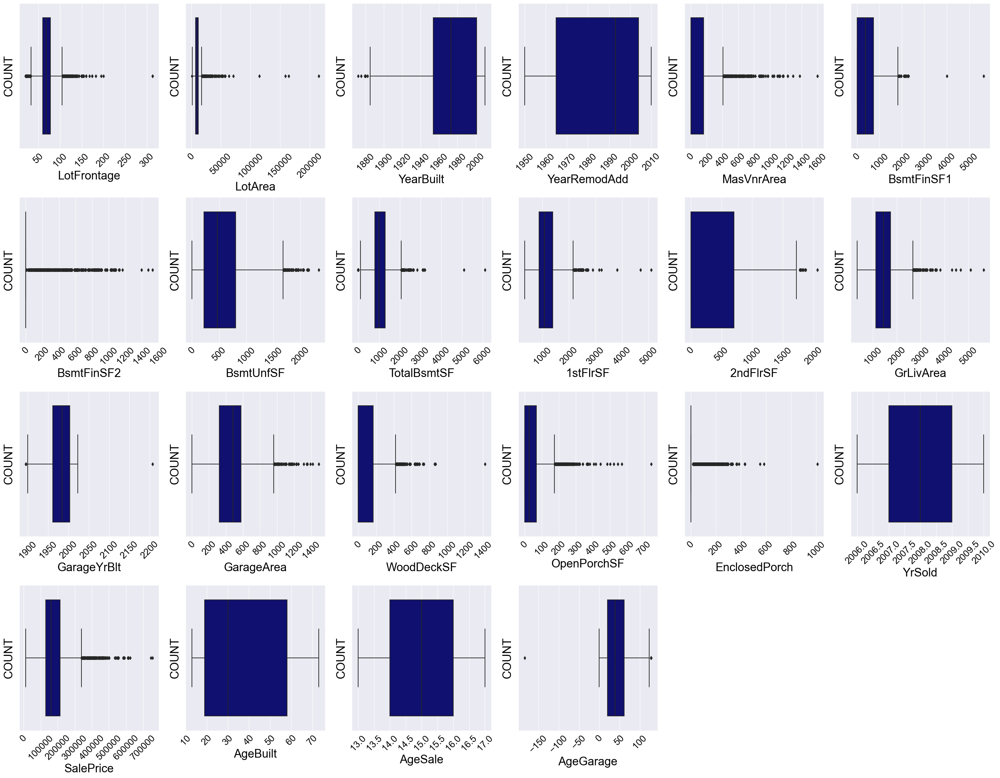

In [117]:
fig = plt.figure(figsize=(30,150))
for index,col in enumerate(num_cols_original):
    plt.subplot(26,6,index+1)
    sns.boxplot(x=col, data=num_cols_original.dropna(), color='navy')
    plt.ylabel('COUNT', size = 25,color="black" )
    plt.xlabel(col, fontsize = 25,color="black" )
    plt.xticks(size = 20,color="black", rotation = 45 )
    plt.yticks(size = 20,color="black" )

fig.tight_layout(pad=1.0)

In [118]:
num_cols_original

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,YrSold,SalePrice,AgeBuilt,AgeSale,AgeGarage
0,65.00,8450.00,2003.00,2003.00,196.00,706.00,0.00,150.00,856.00,856.00,854.00,1710.00,2003.00,548.00,0.00,61.00,0.00,2008.00,208500.00,20.00,15.00,20.00
1,80.00,9600.00,1976.00,1976.00,0.00,978.00,0.00,284.00,1262.00,1262.00,0.00,1262.00,1976.00,460.00,298.00,0.00,0.00,2007.00,181500.00,47.00,16.00,47.00
2,68.00,11250.00,2001.00,2002.00,162.00,486.00,0.00,434.00,920.00,920.00,866.00,1786.00,2001.00,608.00,0.00,42.00,0.00,2008.00,223500.00,21.00,15.00,22.00
3,60.00,9550.00,1915.00,1970.00,0.00,216.00,0.00,540.00,756.00,961.00,756.00,1717.00,1998.00,642.00,0.00,35.00,272.00,2006.00,140000.00,53.00,17.00,25.00
4,84.00,14260.00,2000.00,2000.00,350.00,655.00,0.00,490.00,1145.00,1145.00,1053.00,2198.00,2000.00,836.00,192.00,84.00,0.00,2008.00,250000.00,23.00,15.00,23.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,21.00,1936.00,1970.00,1970.00,0.00,0.00,0.00,546.00,546.00,546.00,546.00,1092.00,2023.00,0.00,0.00,0.00,0.00,2006.00,90500.00,53.00,17.00,0.00
2915,21.00,1894.00,1970.00,1970.00,0.00,252.00,0.00,294.00,546.00,546.00,546.00,1092.00,1970.00,286.00,0.00,24.00,0.00,2006.00,71000.00,53.00,17.00,53.00
2916,160.00,20000.00,1960.00,1996.00,0.00,1224.00,0.00,0.00,1224.00,1224.00,0.00,1224.00,1960.00,576.00,474.00,0.00,0.00,2006.00,131000.00,27.00,17.00,63.00
2917,62.00,10441.00,1992.00,1992.00,0.00,337.00,0.00,575.00,912.00,970.00,0.00,970.00,2023.00,0.00,80.00,32.00,0.00,2006.00,132000.00,31.00,17.00,0.00


In [119]:
def outlier_thresholds(dataframe, col_name, q1=0.25, q3=0.75):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit


for col in num_cols_original.columns:
    print(col, outlier_thresholds(train, col))

LotFrontage (33.0, 105.0)
LotArea (1331.625, 17724.625)
YearBuilt (1882.875, 2071.875)
YearRemodAdd (1906.5, 2062.5)
MasVnrArea (-244.875, 408.125)
BsmtFinSF1 (-1099.5, 1832.5)
BsmtFinSF2 (0.0, 0.0)
BsmtUnfSF (-656.75, 1681.25)
TotalBsmtSF (29.5, 2065.5)
1stFlrSF (107.625, 2156.625)
2ndFlrSF (-1056.0, 1760.0)
GrLivArea (199.5, 2669.5)
GarageYrBlt (1899.875, 2064.875)
GarageArea (-64.0, 960.0)
WoodDeckSF (-252.0, 420.0)
OpenPorchSF (-105.0, 175.0)
EnclosedPorch (0.0, 0.0)
YrSold (2004.0, 2012.0)
SalePrice (3156.25, 339706.25)
AgeBuilt (-39.5, 116.5)
AgeSale (11.0, 19.0)
AgeGarage (-41.875, 123.125)


In [120]:
# With the x function, we can confirm the existence of outliers in our variables.

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False



for col in num_cols_original:
    print(col, check_outlier(train, col))

LotFrontage True
LotArea True
YearBuilt True
YearRemodAdd False
MasVnrArea True
BsmtFinSF1 True
BsmtFinSF2 True
BsmtUnfSF True
TotalBsmtSF True
1stFlrSF True
2ndFlrSF True
GrLivArea True
GarageYrBlt True
GarageArea True
WoodDeckSF True
OpenPorchSF True
EnclosedPorch True
YrSold False
SalePrice True
AgeBuilt False
AgeSale False
AgeGarage True


In [121]:
# We suppress our outliers with the 'replace_with_thresholds' function.
def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

for col in num_cols_original:
    replace_with_thresholds(train, col)

# When we check for outliers with the y function, we observe the result.
for col in num_cols_original:
    print(col, check_outlier(train, col))

LotFrontage False
LotArea False
YearBuilt False
YearRemodAdd False
MasVnrArea False
BsmtFinSF1 False
BsmtFinSF2 False
BsmtUnfSF False
TotalBsmtSF False
1stFlrSF False
2ndFlrSF False
GrLivArea False
GarageYrBlt False
GarageArea False
WoodDeckSF False
OpenPorchSF False
EnclosedPorch False
YrSold False
SalePrice False
AgeBuilt False
AgeSale False
AgeGarage False


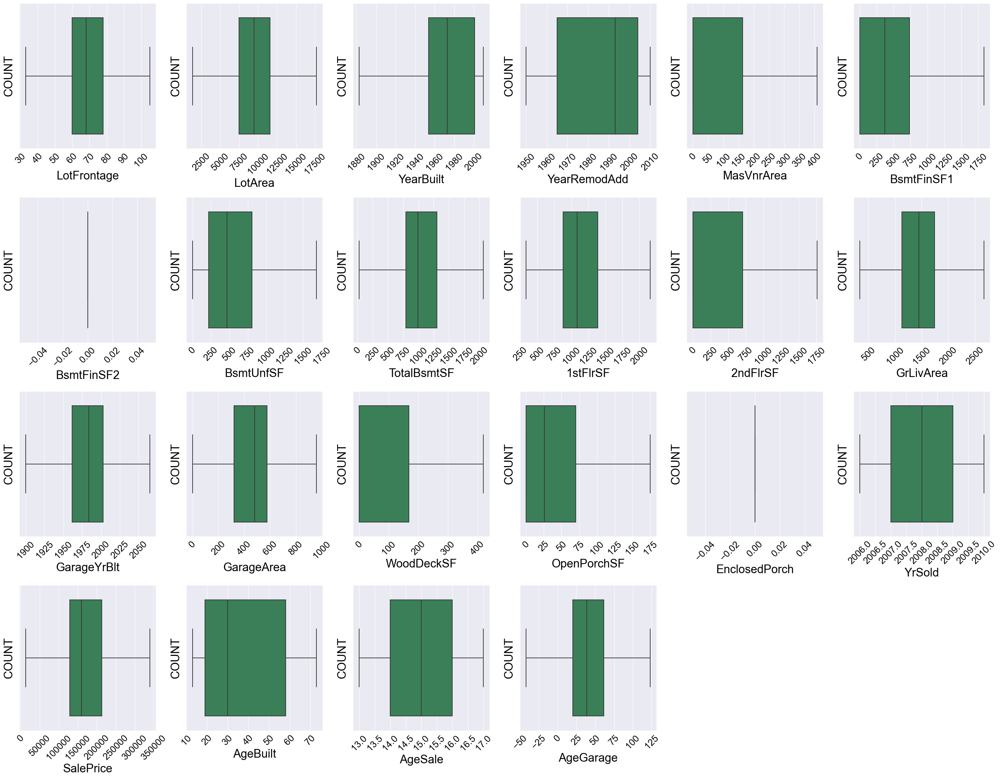

In [122]:
fig = plt.figure(figsize=(30,150))
for index,col in enumerate(num_cols_original):
    plt.subplot(26,6,index+1)
    sns.boxplot(x=col, data=train.dropna(), color='seagreen')
    plt.ylabel('COUNT', size = 25,color="black" )
    plt.xlabel(col, fontsize = 25,color="black" )
    plt.xticks(size = 20,color="black", rotation = 45 )
    plt.yticks(size = 20,color="black" )

fig.tight_layout(pad=1.0)

In [123]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2916.00,1460.60,842.95,1.00,730.75,1461.50,2190.25,2919.00
MSSubClass,2916.00,57.11,42.52,20.00,20.00,50.00,70.00,190.00
LotFrontage,2916.00,68.48,17.01,33.00,60.00,68.00,78.00,105.00
LotArea,2916.00,9579.86,3613.48,1331.62,7479.00,9455.00,11577.25,17724.62
OverallQual,2916.00,6.09,1.41,1.00,5.00,6.00,7.00,10.00
OverallCond,2916.00,5.56,1.11,1.00,5.00,5.00,6.00,9.00
YearBuilt,2916.00,1971.34,30.22,1882.88,1953.75,1973.00,2001.00,2010.00
YearRemodAdd,2916.00,1984.27,20.89,1950.00,1965.00,1993.00,2004.00,2010.00
MasVnrArea,2916.00,87.80,133.22,0.00,0.00,0.00,163.25,408.12
BsmtFinSF1,2916.00,438.27,437.89,0.00,0.00,369.00,733.00,1832.50


In [124]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Fence_,Fireplace_,Garage_,Alley_,sold_season,AgeBuilt,AgeSale,AgeGarage
0,1.00,60.00,RL,65.00,8450.00,Absence,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7.00,5.00,2003.00,2003.00,Gable,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,856.00,Ex,Y,SBrkr,856.00,854.00,1710.00,1.00,2.00,1.00,3.00,1.00,Gd,8.00,Typ,0.00,Absence,Attchd,2003.00,RFn,2.00,548.00,TA,TA,Y,0.00,61.00,0.00,Absence,2.00,2008.00,WD,Normal,208500.00,No,No,Yes,No,Winter,20.00,15.00,20.00
1,2.00,20.00,RL,80.00,9600.00,Absence,Reg,Lvl,rare_category,rare_category,Feedr,1Fam,1Story,6.00,8.00,1976.00,1976.00,Gable,MetalSd,MetalSd,BrkFace,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,1262.00,Ex,Y,SBrkr,1262.00,0.00,1262.00,0.00,2.00,0.00,3.00,1.00,TA,6.00,Typ,1.00,TA,Attchd,1976.00,RFn,2.00,460.00,TA,TA,Y,298.00,0.00,0.00,Absence,5.00,2007.00,WD,Normal,181500.00,No,Yes,Yes,No,Spring,47.00,16.00,47.00
2,3.00,60.00,RL,68.00,11250.00,Absence,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7.00,5.00,2001.00,2002.00,Gable,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,920.00,Ex,Y,SBrkr,920.00,866.00,1786.00,1.00,2.00,1.00,3.00,1.00,Gd,6.00,Typ,1.00,TA,Attchd,2001.00,RFn,2.00,608.00,TA,TA,Y,0.00,42.00,0.00,Absence,9.00,2008.00,WD,Normal,223500.00,No,Yes,Yes,No,Fall,21.00,15.00,22.00
3,4.00,70.00,RL,60.00,9550.00,Absence,IR1,Lvl,Corner,rare_category,Norm,1Fam,2Story,7.00,5.00,1915.00,1970.00,Gable,Wd Sdng,rare_category,BrkFace,0.00,TA,TA,BrkTil,TA,rare_category,No,ALQ,216.00,Unf,0.00,540.00,756.00,Gd,Y,SBrkr,961.00,756.00,1717.00,1.00,1.00,0.00,3.00,1.00,Gd,7.00,Typ,1.00,Gd,Detchd,1998.00,Unf,3.00,642.00,TA,TA,Y,0.00,35.00,0.00,Absence,2.00,2006.00,WD,Abnorml,140000.00,No,Yes,Yes,No,Winter,53.00,17.00,25.00
4,5.00,60.00,RL,84.00,14260.00,Absence,IR1,Lvl,rare_category,rare_category,Norm,1Fam,2Story,8.00,5.00,2000.00,2000.00,Gable,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,1145.00,Ex,Y,SBrkr,1145.00,1053.00,2198.00,1.00,2.00,1.00,4.00,1.00,Gd,9.00,Typ,1.00,TA,Attchd,2000.00,RFn,3.00,836.00,TA,TA,Y,192.00,84.00,0.00,Absence,12.00,2008.00,WD,Normal,250000.00,No,Yes,Yes,No,Winter,23.00,15.00,23.00


### 2.3.C Creating New Features

In [125]:
train['BsmtType1_ratio'] = train['BsmtFinSF1'] / train['TotalBsmtSF']
train['BsmtType2_ratio'] = train['BsmtFinSF2'] / train['TotalBsmtSF']
train['BsmtUnfinished_ratio'] = train['BsmtUnfSF'] / train['TotalBsmtSF']
train['enclosedporch_ratio'] = train['EnclosedPorch'] / train['LotArea']
train['Garage_ratio'] = train['GarageArea'] / train['LotArea']
train['OpenPorch_ratio'] = train['OpenPorchSF'] / train['LotArea']
train['TotalBsmt_ratio'] = train['TotalBsmtSF'] / train['LotArea']
train['WoodDeck_ratio'] = train['WoodDeckSF'] / train['LotArea']

In [126]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2916 entries, 0 to 2918
Data columns (total 83 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Id                    2916 non-null   float64
 1   MSSubClass            2916 non-null   float64
 2   MSZoning              2916 non-null   object 
 3   LotFrontage           2916 non-null   float64
 4   LotArea               2916 non-null   float64
 5   Alley                 2916 non-null   object 
 6   LotShape              2916 non-null   object 
 7   LandContour           2916 non-null   object 
 8   LotConfig             2916 non-null   object 
 9   Neighborhood          2916 non-null   object 
 10  Condition1            2916 non-null   object 
 11  BldgType              2916 non-null   object 
 12  HouseStyle            2916 non-null   object 
 13  OverallQual           2916 non-null   float64
 14  OverallCond           2916 non-null   float64
 15  YearBuilt             2916

### 2.3.D Encoding (Label and One Hot)

In [127]:
train[['Alley', 'LandContour', 'BsmtCond', 'BsmtFinType2']]

,Alley,LandContour,BsmtCond,BsmtFinType2
0,Absence,Lvl,TA,Unf
1,Absence,Lvl,TA,Unf
2,Absence,Lvl,TA,Unf
3,Absence,Lvl,rare_category,Unf
4,Absence,Lvl,TA,Unf
...,...,...,...,...
2914,Absence,Lvl,TA,Unf
2915,Absence,Lvl,TA,Unf
2916,Absence,Lvl,TA,Unf
2917,Absence,Lvl,TA,Unf


In [128]:
for col in train[['Alley', 'LandContour', 'BsmtCond', 'BsmtFinType2']]:
  print(train[col].value_counts())

Alley
Absence          2719
rare_category     197
Name: count, dtype: int64
LandContour
Lvl              2619
rare_category     297
Name: count, dtype: int64
BsmtCond
TA               2603
rare_category     313
Name: count, dtype: int64
BsmtFinType2
Unf              2490
rare_category     426
Name: count, dtype: int64


In [129]:
# TRAIN
from sklearn.preprocessing import LabelEncoder

binary_cols = [col for col in train.columns if train[col].dtypes == "O" and train[col].nunique() == 2]
binary_cols

# Binary kolonlar label encoder yapacağız.
labelencoder = LabelEncoder()

for col in binary_cols:
    labelencoder = LabelEncoder()
    train[col] = labelencoder.fit_transform(train[col])

In [130]:
binary_cols

['Alley',
 'LandContour',
 'BsmtCond',
 'BsmtFinType2',
 'CentralAir',
 'Functional',
 'Fence_',
 'Fireplace_',
 'Garage_',
 'Alley_']

In [131]:
for col in train[['Alley', 'LandContour', 'BsmtCond', 'BsmtFinType2']]:
  print(train[col].value_counts())

Alley
0    2719
1     197
Name: count, dtype: int64
LandContour
0    2619
1     297
Name: count, dtype: int64
BsmtCond
0    2603
1     313
Name: count, dtype: int64
BsmtFinType2
0    2490
1     426
Name: count, dtype: int64


In [132]:
train.shape

(2916, 83)

In [133]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2916.00,1460.60,842.95,1.00,730.75,1461.50,2190.25,2919.00
MSSubClass,2916.00,57.11,42.52,20.00,20.00,50.00,70.00,190.00
LotFrontage,2916.00,68.48,17.01,33.00,60.00,68.00,78.00,105.00
LotArea,2916.00,9579.86,3613.48,1331.62,7479.00,9455.00,11577.25,17724.62
Alley,2916.00,0.07,0.25,0.00,0.00,0.00,0.00,1.00
LandContour,2916.00,0.10,0.30,0.00,0.00,0.00,0.00,1.00
OverallQual,2916.00,6.09,1.41,1.00,5.00,6.00,7.00,10.00
OverallCond,2916.00,5.56,1.11,1.00,5.00,5.00,6.00,9.00
YearBuilt,2916.00,1971.34,30.22,1882.88,1953.75,1973.00,2001.00,2010.00
YearRemodAdd,2916.00,1984.27,20.89,1950.00,1965.00,1993.00,2004.00,2010.00


In [134]:
train['SaleCondition'].value_counts()

SaleCondition
Normal           2399
Partial           245
Abnorml           190
rare_category      82
Name: count, dtype: int64

In [135]:
from sklearn.base import TransformerMixin
# TRAIN - Kategorik kolonlar için one hot encoder uygulayacağız.
num_cols = [col for col in train.columns if train[col].dtype != 'object']
cat_cols = [col for col in cat_cols if col not in binary_cols and col not in num_cols]
cat_cols

encode_train = pd.get_dummies(train, columns=cat_cols, drop_first=True)

In [136]:
encode_train.shape

(2916, 143)

In [137]:
encode_train[['SaleCondition_Normal','SaleCondition_Partial','SaleCondition_rare_category']].head(6)

,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_rare_category
0,True,False,False
1,True,False,False
2,True,False,False
3,False,False,False
4,True,False,False
5,True,False,False


### 2.3.E Feature Scaling (MinMax)

In [138]:
encode_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2916 entries, 0 to 2918
Columns: 143 entries, Id to sold_season_Winter
dtypes: bool(90), float64(43), int64(10)
memory usage: 1.5 MB


In [139]:
encode_train

,Id,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtCond,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SalePrice,Fence_,Fireplace_,Garage_,Alley_,AgeBuilt,AgeSale,AgeGarage,BsmtType1_ratio,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio,MSZoning_RM,MSZoning_rare_category,LotShape_Reg,LotShape_rare_category,LotConfig_CulDSac,LotConfig_Inside,LotConfig_rare_category,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_NAmes,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_rare_category,Condition1_Norm,Condition1_rare_category,BldgType_TwnhsE,BldgType_rare_category,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_rare_category,RoofStyle_Hip,RoofStyle_rare_category,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_rare_category,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_rare_category,MasVnrType_Stone,MasVnrType_rare_category,ExterQual_TA,ExterQual_rare_category,ExterCond_TA,ExterCond_rare_category,Foundation_CBlock,Foundation_PConc,Foundation_rare_category,BsmtQual_Gd,BsmtQual_TA,BsmtQual_rare_category,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_rare_category,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_rare_category,HeatingQC_Gd,HeatingQC_TA,HeatingQC_rare_category,Electrical_SBrkr,Electrical_rare_category,KitchenQual_Gd,KitchenQual_TA,KitchenQual_rare_category,FireplaceQu_Gd,FireplaceQu_TA,FireplaceQu_rare_category,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_rare_category,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageQual_TA,GarageQual_rare_category,GarageCond_TA,GarageCond_rare_category,PavedDrive_Y,PavedDrive_rare_category,Fence_MnPrv,Fence_rare_category,SaleType_WD,SaleType_rare_category,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_rare_category,sold_season_Spring,sold_season_Summer,sold_season_Winter
0,1.00,60.00,65.00,8450.00,0,0,7.00,5.00,2003.00,2003.00,196.00,0,706.00,0,0.00,150.00,856.00,1,856.00,854.00,1710.00,1.00,2.00,1.00,3.00,1.00,8.00,0,0.00,2003.00,2.00,548.00,0.00,61.00,0.00,2.00,2008.00,208500.00,0,0,1,0,20.00,15.00,20.00,0.82,0.00,0.18,0.00,0.06,0.01,0.10,0.00,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True,False,False,True,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,True,False,False,False,False,True,False,True,False,True,False,True,False,False,False,True,False,True,False,False,False,False,True
1,2.00,20.00,80.00,9600.00,0,0,6.00,8.00,1976.00,1976.00,0.00,0,978.00,0,0.00,284.00,1262.00,1,1262.00,0.00,1262.00,0.00,2.00,0.00,3.00,1.00,6.00,0,1.00,1976.00,2.00,460.00,298.00,0.00,0.00,5.00,2007.00,181500.00,0,1,1,0,47.00,16.00,47.00,0.77,0.00,0.23,0.00,0.05,0.00,0.13,0.03,False,False,True,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True,False,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,True,False,True,False,False,False,False,True,False,True,False,True,False,True,False,False,False,True,False,True,False,False,True,False,False
2,3.00,60.00,68.00,11250.00,0,0,7.00,5.00,2001.00,2002.00,16

In [140]:
encode_train.iloc[:,1:].describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,2916.00,57.11,42.52,20.00,20.00,50.00,70.00,190.00
LotFrontage,2916.00,68.48,17.01,33.00,60.00,68.00,78.00,105.00
LotArea,2916.00,9579.86,3613.48,1331.62,7479.00,9455.00,11577.25,17724.62
Alley,2916.00,0.07,0.25,0.00,0.00,0.00,0.00,1.00
LandContour,2916.00,0.10,0.30,0.00,0.00,0.00,0.00,1.00
OverallQual,2916.00,6.09,1.41,1.00,5.00,6.00,7.00,10.00
OverallCond,2916.00,5.56,1.11,1.00,5.00,5.00,6.00,9.00
YearBuilt,2916.00,1971.34,30.22,1882.88,1953.75,1973.00,2001.00,2010.00
YearRemodAdd,2916.00,1984.27,20.89,1950.00,1965.00,1993.00,2004.00,2010.00
MasVnrArea,2916.00,87.80,133.22,0.00,0.00,0.00,163.25,408.12


In [141]:
encode_train['SalePrice'].describe().T

count     2916.00
mean    177012.21
std      67997.26
min      12789.00
25%     129362.50
50%     160000.00
75%     213500.00
max     339706.25
Name: SalePrice, dtype: float64

In [142]:
encode_train.index.duplicated().any()

False

In [143]:
encode_train = encode_train.reset_index(drop=True)

In [144]:
encode_train.head()

,Id,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtCond,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SalePrice,Fence_,Fireplace_,Garage_,Alley_,AgeBuilt,AgeSale,AgeGarage,BsmtType1_ratio,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio,MSZoning_RM,MSZoning_rare_category,LotShape_Reg,LotShape_rare_category,LotConfig_CulDSac,LotConfig_Inside,LotConfig_rare_category,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_NAmes,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_rare_category,Condition1_Norm,Condition1_rare_category,BldgType_TwnhsE,BldgType_rare_category,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_rare_category,RoofStyle_Hip,RoofStyle_rare_category,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_rare_category,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_rare_category,MasVnrType_Stone,MasVnrType_rare_category,ExterQual_TA,ExterQual_rare_category,ExterCond_TA,ExterCond_rare_category,Foundation_CBlock,Foundation_PConc,Foundation_rare_category,BsmtQual_Gd,BsmtQual_TA,BsmtQual_rare_category,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_rare_category,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_rare_category,HeatingQC_Gd,HeatingQC_TA,HeatingQC_rare_category,Electrical_SBrkr,Electrical_rare_category,KitchenQual_Gd,KitchenQual_TA,KitchenQual_rare_category,FireplaceQu_Gd,FireplaceQu_TA,FireplaceQu_rare_category,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_rare_category,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageQual_TA,GarageQual_rare_category,GarageCond_TA,GarageCond_rare_category,PavedDrive_Y,PavedDrive_rare_category,Fence_MnPrv,Fence_rare_category,SaleType_WD,SaleType_rare_category,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_rare_category,sold_season_Spring,sold_season_Summer,sold_season_Winter
0,1.00,60.00,65.00,8450.00,0,0,7.00,5.00,2003.00,2003.00,196.00,0,706.00,0,0.00,150.00,856.00,1,856.00,854.00,1710.00,1.00,2.00,1.00,3.00,1.00,8.00,0,0.00,2003.00,2.00,548.00,0.00,61.00,0.00,2.00,2008.00,208500.00,0,0,1,0,20.00,15.00,20.00,0.82,0.00,0.18,0.00,0.06,0.01,0.10,0.00,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True,False,False,True,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,True,False,False,False,False,True,False,True,False,True,False,True,False,False,False,True,False,True,False,False,False,False,True
1,2.00,20.00,80.00,9600.00,0,0,6.00,8.00,1976.00,1976.00,0.00,0,978.00,0,0.00,284.00,1262.00,1,1262.00,0.00,1262.00,0.00,2.00,0.00,3.00,1.00,6.00,0,1.00,1976.00,2.00,460.00,298.00,0.00,0.00,5.00,2007.00,181500.00,0,1,1,0,47.00,16.00,47.00,0.77,0.00,0.23,0.00,0.05,0.00,0.13,0.03,False,False,True,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True,False,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,True,False,True,False,False,False,False,True,False,True,False,True,False,True,False,False,False,True,False,True,False,False,True,False,False
2,3.00,60.00,68.00,11250.00,0,0,7.00,5.00,2001.00,2002.00,16

In [145]:
#from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Select the numerical columns to be scaled (excluding the id column)
numerical_columns = encode_train.select_dtypes(include=np.number).columns.drop(['Id', 'SalePrice'])
numerical_columns_data = encode_train[numerical_columns]

# Fit the scaler to the numerical columns
scaler.fit(numerical_columns_data)

# Scale the numerical columns using the scaler
scaled_numerical_columns_data = pd.DataFrame(scaler.transform(numerical_columns_data), columns=numerical_columns)

# Concatenate the scaled numerical columns with the id column to create the final scaled dataframe
scaled_train = pd.concat([encode_train[['Id', 'SalePrice']], scaled_numerical_columns_data], axis=1)

In [146]:
scaled_train.head()

,Id,SalePrice,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtCond,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,Fence_,Fireplace_,Garage_,Alley_,AgeBuilt,AgeSale,AgeGarage,BsmtType1_ratio,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio
0,1.00,208500.00,0.24,0.44,0.43,0.00,0.00,0.67,0.50,0.94,0.88,0.48,0.00,0.39,0.00,0.00,0.09,0.41,1.00,0.29,0.49,0.59,0.33,0.50,0.50,0.38,0.33,0.46,0.00,0.00,0.62,0.40,0.57,0.00,0.35,0.00,0.09,0.50,0.00,0.00,1.00,0.00,0.12,0.50,0.38,0.82,0.00,0.18,0.00,0.19,0.11,0.21,0.00
1,2.00,181500.00,0.00,0.65,0.50,0.00,0.00,0.56,0.88,0.73,0.43,0.00,0.00,0.53,0.00,0.00,0.17,0.61,1.00,0.51,0.00,0.40,0.00,0.50,0.00,0.38,0.33,0.31,0.00,0.25,0.46,0.40,0.48,0.71,0.00,0.00,0.36,0.25,0.00,1.00,1.00,0.00,0.57,0.75,0.54,0.77,0.00,0.23,0.00,0.14,0.00,0.27,0.14
2,3.00,223500.00,0.24,0.49,0.61,0.00,0.00,0.67,0.50,0.93,0.87,0.40,0.00,0.27,0.00,0.00,0.26,0.44,1.00,0.32,0.49,0.62,0.33,0.50,0.50,0.38,0.33,0.31,0.00,0.25,0.61,0.40,0.63,0.00,0.24,0.00,0.73,0.50,0.00,1.00,1.00,0.00,0.13,0.50,0.39,0.53,0.00,0.47,0.00,0.16,0.06,0.17,0.00
3,4.00,140000.00,0.29,0.37,0.50,0.00,0.00,0.67,0.50,0.25,0.33,0.00,1.00,0.12,0.00,0.00,0.32,0.36,1.00,0.34,0.43,0.59,0.33,0.25,0.00,0.38,0.33,0.38,0.00,0.25,0.59,0.60,0.67,0.00,0.20,0.00,0.09,0.00,0.00,1.00,1.00,0.00,0.67,1.00,0.41,0.29,0.00,0.71,0.00,0.19,0.05,0.16,0.00
4,5.00,250000.00,0.24,0.71,0.79,0.00,0.00,0.78,0.50,0.92,0.83,0.86,0.00,0.36,0.00,0.00,0.29,0.55,1.00,0.44,0.60,0.80,0.33,0.50,0.50,0.50,0.33,0.54,0.00,0.25,0.61,0.60,0.87,0.46,0.48,0.00,1.00,0.50,0.00,1.00,1.00,0.00,0.17,0.50,0.39,0.57,0.00,0.43,0.00,0.17,0.09,0.17,0.06


In [147]:
scaled_train['SalePrice'].describe().T

count     2916.00
mean    177012.21
std      67997.26
min      12789.00
25%     129362.50
50%     160000.00
75%     213500.00
max     339706.25
Name: SalePrice, dtype: float64

In [148]:
scaled_train.index.duplicated().any()

False

In [149]:
scaled_train.iloc[:,2:].describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,2916.00,0.22,0.25,0.00,0.00,0.18,0.29,1.00
LotFrontage,2916.00,0.49,0.24,0.00,0.37,0.49,0.62,1.00
LotArea,2916.00,0.50,0.22,0.00,0.38,0.50,0.62,1.00
Alley,2916.00,0.07,0.25,0.00,0.00,0.00,0.00,1.00
LandContour,2916.00,0.10,0.30,0.00,0.00,0.00,0.00,1.00
OverallQual,2916.00,0.57,0.16,0.00,0.44,0.56,0.67,1.00
OverallCond,2916.00,0.57,0.14,0.00,0.50,0.50,0.62,1.00
YearBuilt,2916.00,0.70,0.24,0.00,0.56,0.71,0.93,1.00
YearRemodAdd,2916.00,0.57,0.35,0.00,0.25,0.72,0.90,1.00
MasVnrArea,2916.00,0.22,0.33,0.00,0.00,0.00,0.40,1.00


### 2.3.F Feature Transformation

In [150]:
# Define a function to detect skewed columns and apply log transformation
def log_transform(df, threshold=0.5):
    # Get the skewness of each numerical column (excluding 'Id')
    numerical_cols = df.select_dtypes(include=np.number).drop('Id', axis=1).columns
    skewness = df[numerical_cols].apply(lambda x: x.skew())

    # Identify the columns with skewness greater than the threshold
    skewed_cols = skewness[abs(skewness) > threshold].index

    # Apply log transformation to the skewed columns
    df[skewed_cols] = np.log1p(df[skewed_cols])

    return df

# Call the log_transform function on your DataFrame
scaled_and_transformed = log_transform(scaled_train)

# Add the 'Id' column back to the DataFrame
#scaled_and_transformed = pd.concat([encode_train['Id'], scaled_and_transformed], axis=1)

In [151]:
scaled_and_transformed.head()

,Id,SalePrice,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtCond,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,Fence_,Fireplace_,Garage_,Alley_,AgeBuilt,AgeSale,AgeGarage,BsmtType1_ratio,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio
0,1.00,12.25,0.21,0.44,0.43,0.00,0.00,0.67,0.41,0.67,0.88,0.39,0.00,0.33,0.00,0.00,0.09,0.41,0.69,0.25,0.40,0.46,0.29,0.50,0.41,0.38,0.29,0.38,0.00,0.00,0.49,0.40,0.57,0.00,0.30,0.00,0.09,0.50,0.00,0.00,0.69,0.00,0.12,0.50,0.32,0.82,0.00,0.18,0.00,0.17,0.10,0.19,0.00
1,2.00,12.11,0.00,0.65,0.50,0.00,0.00,0.56,0.63,0.55,0.43,0.00,0.00,0.43,0.00,0.00,0.16,0.61,0.69,0.41,0.00,0.33,0.00,0.50,0.00,0.38,0.29,0.27,0.00,0.22,0.38,0.40,0.48,0.54,0.00,0.00,0.36,0.25,0.00,1.00,0.69,0.00,0.57,0.75,0.43,0.77,0.00,0.23,0.00,0.13,0.00,0.24,0.13
2,3.00,12.32,0.21,0.49,0.61,0.00,0.00,0.67,0.41,0.66,0.87,0.33,0.00,0.24,0.00,0.00,0.23,0.44,0.69,0.28,0.40,0.48,0.29,0.50,0.41,0.38,0.29,0.27,0.00,0.22,0.48,0.40,0.63,0.00,0.22,0.00,0.73,0.50,0.00,1.00,0.69,0.00,0.13,0.50,0.33,0.53,0.00,0.47,0.00,0.14,0.05,0.16,0.00
3,4.00,11.85,0.26,0.37,0.50,0.00,0.00,0.67,0.41,0.23,0.33,0.00,0.69,0.11,0.00,0.00,0.28,0.36,0.69,0.30,0.36,0.47,0.29,0.25,0.00,0.38,0.29,0.33,0.00,0.22,0.47,0.60,0.67,0.00,0.18,0.00,0.09,0.00,0.00,1.00,0.69,0.00,0.67,1.00,0.34,0.29,0.00,0.71,0.00,0.18,0.05,0.15,0.00
4,5.00,12.43,0.21,0.71,0.79,0.00,0.00,0.78,0.41,0.65,0.83,0.62,0.00,0.31,0.00,0.00,0.26,0.55,0.69,0.37,0.47,0.59,0.29,0.50,0.41,0.50,0.29,0.43,0.00,0.22,0.47,0.60,0.87,0.38,0.39,0.00,1.00,0.50,0.00,1.00,0.69,0.00,0.17,0.50,0.33,0.57,0.00,0.43,0.00,0.16,0.08,0.15,0.06


In [152]:
scaled_and_transformed.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2916.00,1460.60,842.95,1.00,730.75,1461.50,2190.25,2919.00
SalePrice,2916.00,12.01,0.39,9.46,11.77,11.98,12.27,12.74
MSSubClass,2916.00,0.18,0.19,0.00,0.00,0.16,0.26,0.69
LotFrontage,2916.00,0.49,0.24,0.00,0.37,0.49,0.62,1.00
LotArea,2916.00,0.50,0.22,0.00,0.38,0.50,0.62,1.00
Alley,2916.00,0.05,0.17,0.00,0.00,0.00,0.00,0.69
LandContour,2916.00,0.07,0.21,0.00,0.00,0.00,0.00,0.69
OverallQual,2916.00,0.57,0.16,0.00,0.44,0.56,0.67,1.00
OverallCond,2916.00,0.45,0.09,0.00,0.41,0.41,0.49,0.69
YearBuilt,2916.00,0.52,0.15,0.00,0.44,0.54,0.66,0.69


In [153]:
scaled_and_transformed['SalePrice'].describe().T

count   2916.00
mean      12.01
std        0.39
min        9.46
25%       11.77
50%       11.98
75%       12.27
max       12.74
Name: SalePrice, dtype: float64

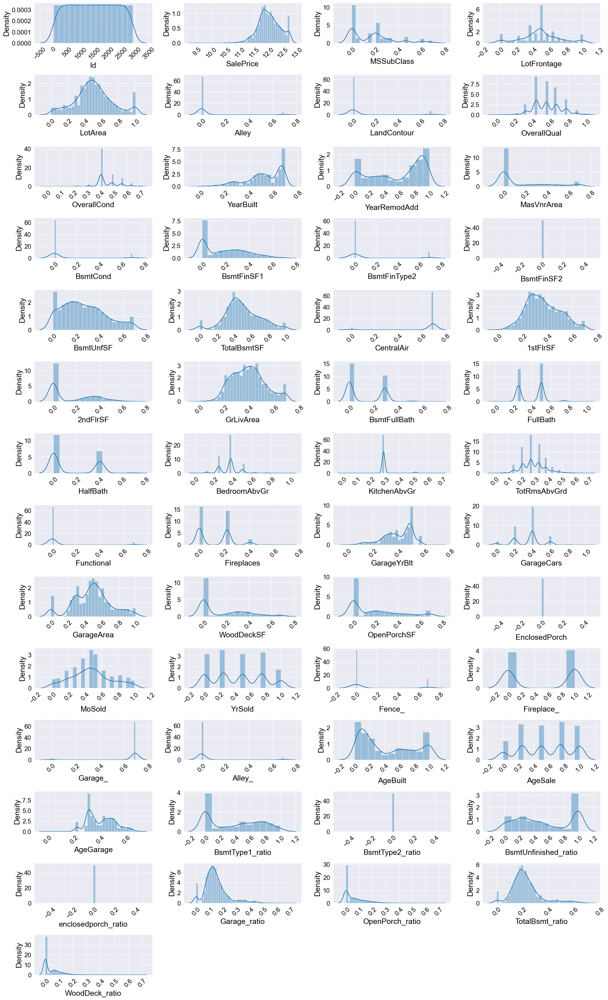

In [154]:
fig = plt.figure(figsize=(20,140))
for index,col in enumerate(scaled_and_transformed.columns):
    plt.subplot(60,4,index+1)
    sns.distplot(x=scaled_and_transformed.iloc[:,index])
    plt.ylabel('Density', size = 18,color="black")
    plt.xlabel(col, fontsize = 18,color="black")

    plt.xticks(size = 15,color="black", rotation = 45 )
    plt.yticks(size = 15,color="black" )

fig.tight_layout(pad=1.0)

In [155]:
scaled_and_transformed.corr()['SalePrice'].sort_values(ascending=False)


SalePrice               1.00
OverallQual             0.82
GrLivArea               0.72
GarageCars              0.68
GarageArea              0.66
TotalBsmtSF             0.64
1stFlrSF                0.61
YearBuilt               0.60
YearRemodAdd            0.59
FullBath                0.58
Fireplace_              0.51
Fireplaces              0.50
TotRmsAbvGrd            0.49
MasVnrArea              0.44
OpenPorchSF             0.41
LotArea                 0.40
GarageYrBlt             0.40
CentralAir              0.38
BsmtFinSF1              0.38
LotFrontage             0.36
WoodDeckSF              0.35
HalfBath                0.31
Garage_                 0.31
BsmtFullBath            0.27
2ndFlrSF                0.25
BsmtType1_ratio         0.21
OpenPorch_ratio         0.21
BedroomAbvGr            0.19
Garage_ratio            0.19
BsmtUnfSF               0.19
WoodDeck_ratio          0.16
TotalBsmt_ratio         0.10
MoSold                  0.04
LandContour             0.04
AgeSale       

# 3.Feature Selection

In [156]:
id_col = scaled_and_transformed['Id']  # Id kolonunu ayrı bir değişkende sakla
scaled_and_transformed = scaled_and_transformed.set_index('Id')  # Id kolonunu indeks olarak ayır

In [157]:
#from sklearn.model_selection import train_test_split

X = scaled_and_transformed.drop('SalePrice', axis=1)
y = scaled_and_transformed['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [158]:
X_train.head()

,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtCond,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,Fence_,Fireplace_,Garage_,Alley_,AgeBuilt,AgeSale,AgeGarage,BsmtType1_ratio,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2260.00,0.00,1.00,1.00,0.00,0.00,0.56,0.49,0.49,0.23,0.29,0.00,0.26,0.00,0.00,0.37,0.62,0.69,0.36,0.00,0.29,0.29,0.25,0.00,0.38,0.29,0.27,0.00,0.22,0.33,0.40,0.50,0.00,0.48,0.00,0.18,0.25,0.69,1.00,0.69,0.00,0.77,0.75,0.48,0.42,0.00,0.58,0.00,0.08,0.09,0.14,0.00
2575.00,0.16,0.24,0.35,0.00,0.00,0.56,0.56,0.37,0.00,0.00,0.00,0.19,0.00,0.00,0.19,0.34,0.69,0.19,0.25,0.32,0.00,0.25,0.00,0.38,0.29,0.27,0.00,0.00,0.33,0.40,0.75,0.00,0.00,0.00,0.36,0.25,0.69,0.00,0.69,0.00,1.00,0.75,0.47,0.52,0.00,0.48,0.00,0.26,0.00,0.19,0.00
2357.00,0.00,0.44,0.37,0.00,0.00,0.67,0.41,0.68,0.93,0.35,0.00,0.00,0.00,0.00,0.63,0.70,0.69,0.49,0.00,0.40,0.00,0.50,0.00,0.38,0.29,0.33,0.00,0.00,0.50,0.40,0.59,0.00,0.17,0.00,0.45,0.25,0.00,0.00,0.69,0.00,0.07,0.75,0.31,0.00,0.00,1.00,0.00,0.20,0.06,0.34,0.00
1807.00,0.34,0.33,0.55,0.69,0.00,0.56,0.41,0.19,0.00,0.00,0.00,0.30,0.00,0.00,0.18,0.46,0.00,0.30,0.44,0.52,0.29,0.50,0.00,0.50,0.51,0.57,0.00,0.00,0.12,0.40,0.34,0.00,0.15,0.00,0.45,0.75,0.00,0.00,0.69,0.69,1.00,0.25,0.63,0.65,0.00,0.35,0.00,0.09,0.04,0.18,0.00
1255.00,0.21,0.37,0.34,0.00,0.00,0.67,0.41,0.67,0.90,0.20,0.00,0.00,0.00,0.00,0.37,0.35,0.69,0.21,0.41,0.45,0.00,0.50,0.41,0.38,0.29,0.33,0.00,0.22,0.49,0.40,0.41,0.35,0.55,0.00,0.55,0.50,0.00,1.00,0.69,0.00,0.10,0.50,0.32,0.00,0.00,1.00,0.00,0.15,0.24,0.20,0.11


In [159]:
X_test.head()

,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtCond,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,Fence_,Fireplace_,Garage_,Alley_,AgeBuilt,AgeSale,AgeGarage,BsmtType1_ratio,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012.00,0.00,0.67,0.48,0.00,0.00,0.67,0.41,0.68,0.95,0.00,0.00,0.00,0.00,0.00,0.53,0.56,0.69,0.37,0.00,0.30,0.00,0.50,0.00,0.38,0.29,0.27,0.00,0.00,0.50,0.40,0.50,0.00,0.17,0.00,0.18,0.50,0.00,0.00,0.69,0.00,0.05,0.50,0.30,0.00,0.00,1.00,0.00,0.14,0.05,0.23,0.00
1043.00,0.46,0.01,0.25,0.00,0.00,0.56,0.41,0.67,0.92,0.29,0.00,0.40,0.00,0.00,0.22,0.63,0.69,0.43,0.00,0.35,0.29,0.50,0.00,0.12,0.29,0.21,0.00,0.22,0.49,0.40,0.65,0.34,0.31,0.00,0.64,0.75,0.00,1.00,0.69,0.00,0.08,0.25,0.31,0.69,0.00,0.31,0.00,0.29,0.16,0.41,0.14
2361.00,0.00,0.71,0.37,0.00,0.00,0.44,0.56,0.51,0.30,0.00,0.00,0.37,0.00,0.00,0.13,0.50,0.69,0.33,0.00,0.26,0.29,0.25,0.41,0.38,0.29,0.21,0.00,0.00,0.44,0.40,0.71,0.37,0.00,0.00,0.45,0.25,0.00,0.00,0.69,0.00,0.70,0.75,0.37,0.78,0.00,0.22,0.00,0.23,0.00,0.25,0.11
2167.00,0.00,0.49,0.45,0.00,0.00,0.67,0.41,0.64,0.80,0.31,0.00,0.54,0.00,0.00,0.06,0.68,0.69,0.47,0.00,0.38,0.29,0.50,0.00,0.38,0.29,0.21,0.00,0.22,0.46,0.40,0.58,0.40,0.49,0.00,0.36,0.50,0.00,1.00,0.69,0.00,0.20,0.50,0.34,0.92,0.00,0.08,0.00,0.17,0.17,0.29,0.10
1645.00,0.00,0.49,0.49,0.00,0.00,0.44,0.56,0.55,0.42,0.33,0.00,0.55,0.69,0.00,0.07,0.78,0.69,0.53,0.00,0.44,0.29,0.50,0.00,0.38,0.29,0.33,0.00,0.41,0.38,0.40,0.50,0.00,0.00,0.00,0.45,0.75,0.00,1.00,0.69,0.00,0.58,0.25,0.43,0.82,0.00,0.07,0.00,0.14,0.00,0.31,0.00


In [160]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(2332, 51)
(2332,)
(584, 51)
(584,)


## 3.1 RFE

In [161]:
#from sklearn.feature_selection import RFE
#from sklearn.model_selection import cross_val_score
#from sklearn.linear_model import LinearRegression
#import numpy as np

# Define the range of numbers of features to consider
num_features_range = range(5, 25)

# Instantiate the model you want to use for feature selection
model = LinearRegression()

# Initialize variables to store the results
mean_scores = []
std_scores = []

# Iterate over different numbers of features
for num_features in num_features_range:
    # Instantiate the RFE object with the desired model and number of features to select
    rfe = RFE(estimator=model, n_features_to_select=num_features)

    # Perform cross-validation and calculate the mean score
    scores = cross_val_score(rfe, X_train, y_train, cv=5)  # X: input features, y: target variable
    mean_score = np.mean(scores)
    std_score = np.std(scores)

    # Store the mean and standard deviation of scores
    mean_scores.append(mean_score)
    std_scores.append(std_score)

# Find the optimal number of features
optimal_num_features = num_features_range[np.argmax(mean_scores)]
optimal_mean_score = np.max(mean_scores)
optimal_std_score = std_scores[np.argmax(mean_scores)]

# Print the results
print("Optimal Number of Features:", optimal_num_features)
print("Mean Score:", optimal_mean_score)
print("Standard Deviation of Score:", optimal_std_score)

Optimal Number of Features: 24
Mean Score: 0.8826289720326338
Standard Deviation of Score: 0.03577679570794466


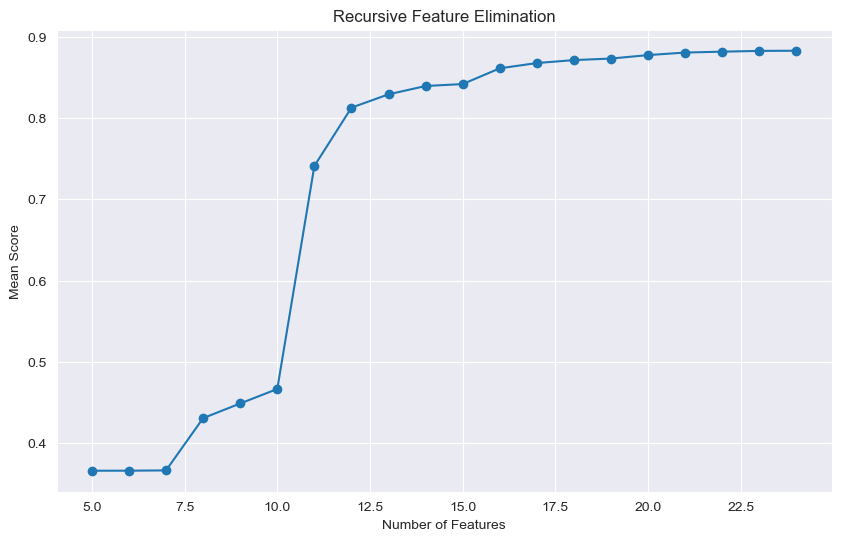

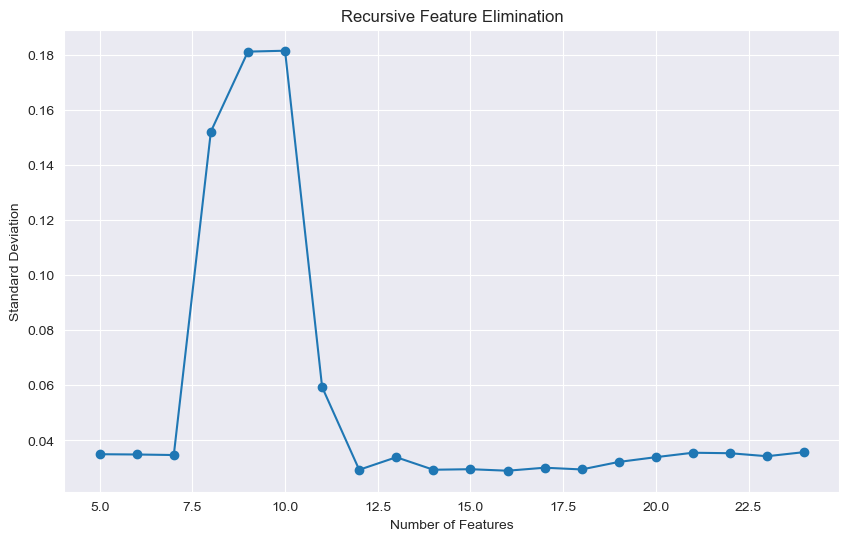

In [163]:
#import matplotlib.pyplot as plt

# Plot mean scores
plt.figure(figsize=(10, 6))
plt.plot(num_features_range, mean_scores, marker='o')
plt.xlabel("Number of Features")
plt.ylabel("Mean Score")
plt.title("Recursive Feature Elimination")
plt.grid(True)
plt.show()

# Plot standard deviations
plt.figure(figsize=(10, 6))
plt.plot(num_features_range, std_scores, marker='o')
plt.xlabel("Number of Features")
plt.ylabel("Standard Deviation")
plt.title("Recursive Feature Elimination")
plt.grid(True)
plt.show()

## 3.2 Feature Importance

In [164]:
#from sklearn.ensemble import RandomForestRegressor
#import numpy as np

# Assuming you have X_train and y_train as your training data

# Train the RandomForestRegressor model
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

# Get feature importance scores
importance_scores = model.feature_importances_

# Sort feature importances in descending order
sorted_indices = np.argsort(importance_scores)[::-1]
sorted_features = X_train.columns[sorted_indices]
sorted_importances = importance_scores[sorted_indices]

# Select the top k features based on their importance scores
k = 26
top_features = sorted_features[:k]
top_importances = sorted_importances[:k]

# Create a DataFrame to store the top features and their importances
features_importances = pd.DataFrame({'Feature': top_features, 'Importance': top_importances})

# Print the top features and their importances
print(features_importances)

                 Feature  Importance
0            OverallQual        0.63
1              GrLivArea        0.10
2            TotalBsmtSF        0.03
3               1stFlrSF        0.03
4             GarageCars        0.02
5              YearBuilt        0.02
6             GarageArea        0.02
7                LotArea        0.01
8            OverallCond        0.01
9             BsmtFinSF1        0.01
10              FullBath        0.01
11              AgeBuilt        0.01
12          YearRemodAdd        0.01
13            CentralAir        0.01
14       TotalBsmt_ratio        0.01
15          Garage_ratio        0.01
16           LotFrontage        0.01
17                MoSold        0.01
18             BsmtUnfSF        0.00
19             AgeGarage        0.00
20  BsmtUnfinished_ratio        0.00
21              2ndFlrSF        0.00
22       BsmtType1_ratio        0.00
23           OpenPorchSF        0.00
24            MSSubClass        0.00
25          KitchenAbvGr        0.00


In [165]:
top_features

Index(['OverallQual', 'GrLivArea', 'TotalBsmtSF', '1stFlrSF', 'GarageCars',
       'YearBuilt', 'GarageArea', 'LotArea', 'OverallCond', 'BsmtFinSF1',
       'FullBath', 'AgeBuilt', 'YearRemodAdd', 'CentralAir', 'TotalBsmt_ratio',
       'Garage_ratio', 'LotFrontage', 'MoSold', 'BsmtUnfSF', 'AgeGarage',
       'BsmtUnfinished_ratio', '2ndFlrSF', 'BsmtType1_ratio', 'OpenPorchSF',
       'MSSubClass', 'KitchenAbvGr'],
      dtype='object')

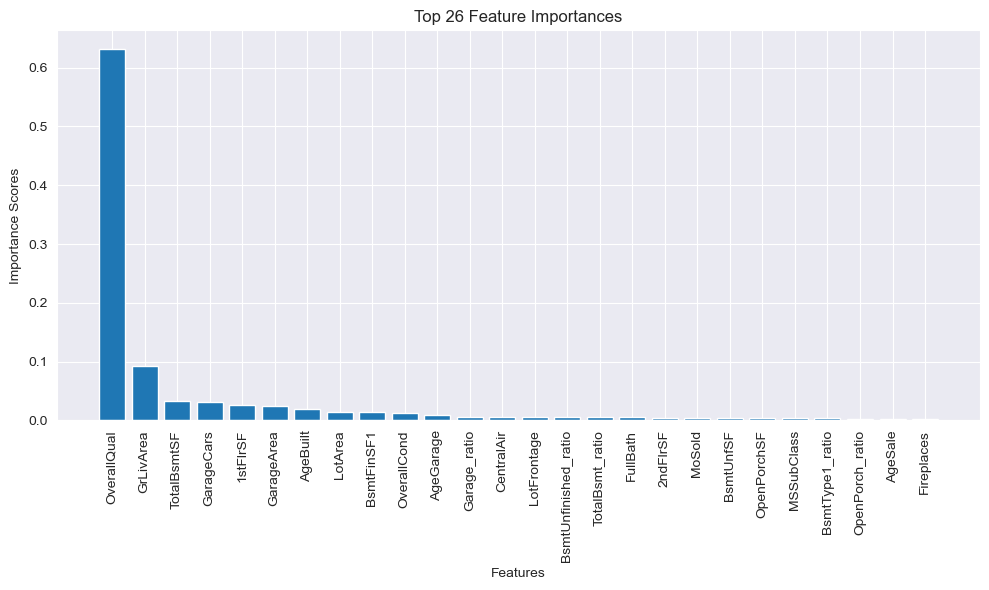

In [164]:
import matplotlib.pyplot as plt

# Assuming you have already obtained the top_features and top_importances

# Create a bar plot for the top k features and their importances
plt.figure(figsize=(10, 6))
plt.bar(range(k), top_importances, tick_label=top_features)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance Scores')
plt.title('Top {} Feature Importances'.format(k))
plt.tight_layout()
plt.show()

In [166]:
len(top_features)

26

## 3.3 Multicollinearity

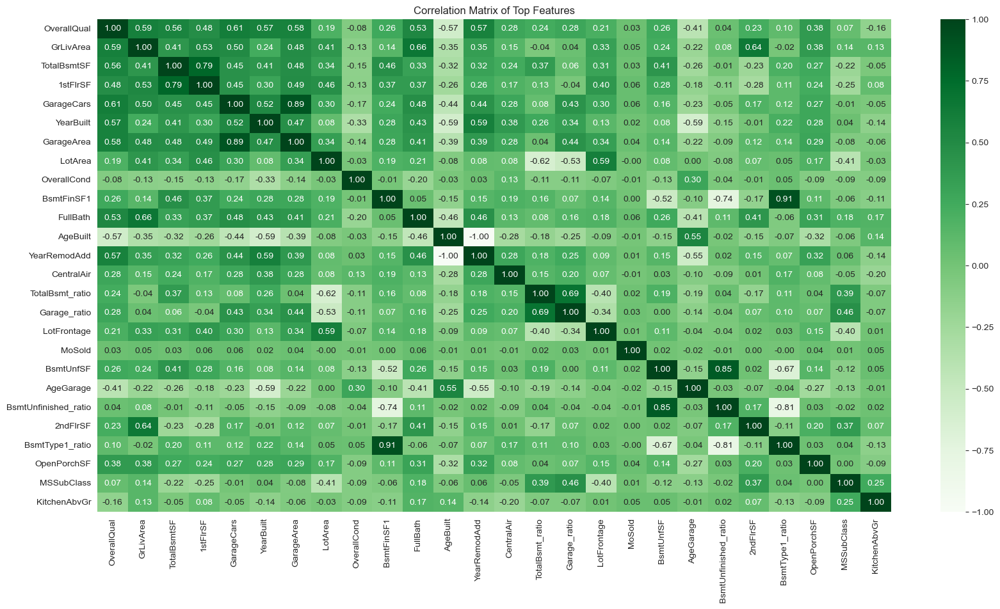

In [167]:
#import pandas as pd
#import seaborn as sns

# Assuming you have already obtained the top_features and X_train data

# Select the top features from the training data
X_top_features = X_train[top_features]

# Calculate the correlation matrix
correlation_matrix = X_top_features.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(20,10))
sns.heatmap(correlation_matrix, annot=True, cmap='Greens', fmt=".2f")
plt.title('Correlation Matrix of Top Features')
plt.show()

In [168]:
highly_correlated_features = []
threshold = 0.7
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            highly_correlated_features.append(correlation_matrix.columns[i])
            highly_correlated_features.append(correlation_matrix.columns[j])

# Filter the features_importances DataFrame based on highly correlated features
highly_correlated_importances = features_importances[features_importances['Feature'].isin(highly_correlated_features)]

# Print the importances of highly correlated features
print(highly_correlated_importances)



                 Feature  Importance
2            TotalBsmtSF        0.03
3               1stFlrSF        0.03
4             GarageCars        0.02
6             GarageArea        0.02
9             BsmtFinSF1        0.01
11              AgeBuilt        0.01
12          YearRemodAdd        0.01
18             BsmtUnfSF        0.00
20  BsmtUnfinished_ratio        0.00
22       BsmtType1_ratio        0.00


In [169]:
# Specify column names to be eliminated
columns_to_eliminate = ['1stFlrSF', 'GarageArea', 'BsmtType1_ratio', 'BsmtUnfSF']

# Remove columns from top_features array
top_features = [feature for feature in top_features if feature not in columns_to_eliminate]

In [170]:
top_features

['OverallQual',
 'GrLivArea',
 'TotalBsmtSF',
 'GarageCars',
 'YearBuilt',
 'LotArea',
 'OverallCond',
 'BsmtFinSF1',
 'FullBath',
 'AgeBuilt',
 'YearRemodAdd',
 'CentralAir',
 'TotalBsmt_ratio',
 'Garage_ratio',
 'LotFrontage',
 'MoSold',
 'AgeGarage',
 'BsmtUnfinished_ratio',
 '2ndFlrSF',
 'OpenPorchSF',
 'MSSubClass',
 'KitchenAbvGr']

In [171]:
X_train_filtered = X_train[top_features]
X_test_filtered = X_test[top_features]

In [171]:
X_train_filtered.corr()

,OverallQual,GrLivArea,TotalBsmtSF,GarageCars,AgeBuilt,LotArea,BsmtFinSF1,OverallCond,AgeGarage,Garage_ratio,...,BsmtUnfinished_ratio,TotalBsmt_ratio,FullBath,2ndFlrSF,MoSold,OpenPorchSF,MSSubClass,OpenPorch_ratio,AgeSale,Fireplaces
OverallQual,1.000000,0.590376,0.550724,0.600981,-0.569847,0.189304,0.234686,-0.060879,-0.403103,0.273499,...,0.059694,0.235328,0.525835,0.230476,0.034936,0.369629,0.059570,0.233957,0.029616,0.405604
GrLivArea,0.590376,1.000000,0.414347,0.494139,-0.333644,0.404736,0.132519,-0.131376,-0.214823,0.038853,...,0.086128,-0.038951,0.646530,0.634633,0.049517,0.379286,0.125486,0.175879,0.040756,0.463806
TotalBsmtSF,0.550724,0.414347,1.000000,0.449808,-0.315388,0.346590,0.453008,-0.148230,-0.258434,0.051996,...,0.000641,0.366511,0.332811,-0.247037,0.019791,0.267262,-0.229266,0.110747,0.014775,0.321170
GarageCars,0.600981,0.494139,0.449808,1.000000,-0.433439,0.304393,0.224016,-0.158145,-0.230718,0.429504,...,-0.029901,0.066818,0.470965,0.155812,0.073368,0.270610,-0.034582,0.121048,0.034010,0.318609
AgeBuilt,-0.569847,-0.333644,-0.315388,-0.433439,1.000000,-0.079605,-0.136577,-0.045722,0.541384,-0.242509,...,-0.032478,-0.176323,-0.455306,-0.139209,-0.026907,-0.314756,-0.045155,-0.247949,0.022926,-0.150284
LotArea,0.189304,0.404736,0.346590,0.304393,-0.079605,1.000000,0.196877,-0.047428,0.000924,-0.528536,...,-0.088491,-0.618765,0.198186,0.048093,-0.016362,0.176796,-0.413163,-0.179598,0.040506,0.318889
BsmtFinSF1,0.234686,0.132519,0.453008,0.224016,-0.136577,0.196877,1.000000,-0.010999,-0.085679,0.047874,...,-0.735086,0.144942,0.050191,-0.173676,0.004357,0.103094,-0.060559,0.023493,-0.036761,0.253500
OverallCond,-0.060879,-0.131376,-0.148230,-0.158145,-0.045722,-0.047428,-0.010999,1.000000,0.291263,-0.085940,...,-0.044112,-0.089599,-0.208411,-0.000167,-0.010123,-0.088874,-0.070042,-0.075433,-0.019487,-0.030686
AgeGarage,-0.403103,-0.214823,-0.258434,-0.230718,0.541384,0.000924,-0.085679,0.291263,1.000000,-0.130661,...,-0.053789,-0.194648,-0.412232,-0.069009,-0.023357,-0.258039,-0.126918,-0.224879,-0.002586,-0.005432
Garage_ratio,0.273499,0.038853,0.051996,0.429504,-0.242509,-0.528536,0.047874,-0.085940,-0.130661,1.000000,...,-0.012592,0.682052,0.157330,0.079081,0.052047,0.063249,0.445243,0.282870,-0.019409,0.004985


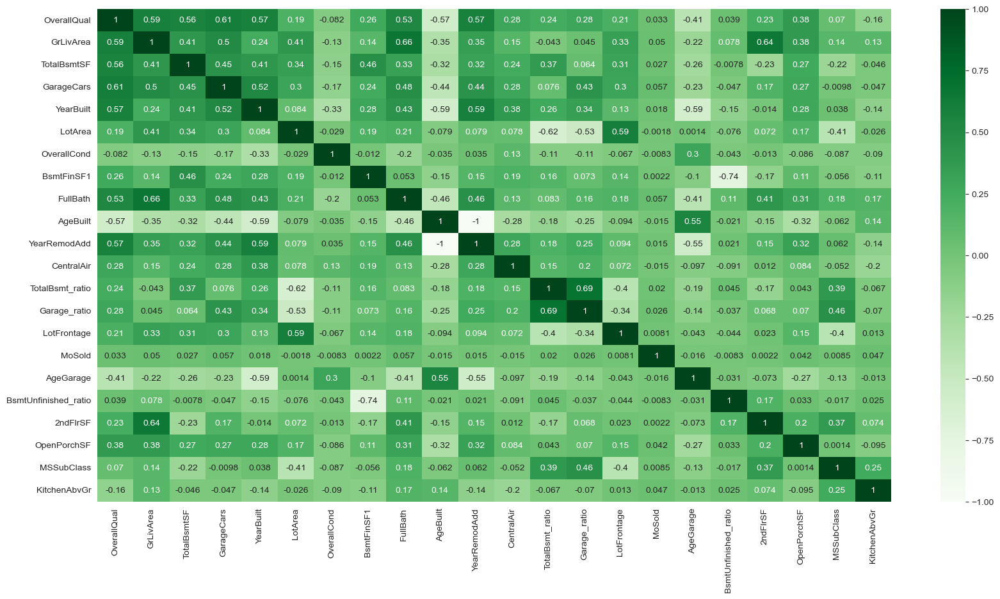

In [172]:
plt.figure(figsize=(20,10))
ax=sns.heatmap(X_train_filtered.corr(), cmap='Greens', annot=True)
plt.show()

# 4.Model Selection

## 4.1 Multiple Linear Regression

In [173]:
X_train_selected_lr = X_train_filtered
X_test_selected_lr = X_test_filtered

In [174]:
X_train_selected_lr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2332 entries, 2260.0 to 862.0
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   OverallQual           2332 non-null   float64
 1   GrLivArea             2332 non-null   float64
 2   TotalBsmtSF           2332 non-null   float64
 3   GarageCars            2332 non-null   float64
 4   YearBuilt             2332 non-null   float64
 5   LotArea               2332 non-null   float64
 6   OverallCond           2332 non-null   float64
 7   BsmtFinSF1            2332 non-null   float64
 8   FullBath              2332 non-null   float64
 9   AgeBuilt              2332 non-null   float64
 10  YearRemodAdd          2332 non-null   float64
 11  CentralAir            2332 non-null   float64
 12  TotalBsmt_ratio       2332 non-null   float64
 13  Garage_ratio          2332 non-null   float64
 14  LotFrontage           2332 non-null   float64
 15  MoSold              

In [175]:
X_test_selected_lr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 584 entries, 2012.0 to 1396.0
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   OverallQual           584 non-null    float64
 1   GrLivArea             584 non-null    float64
 2   TotalBsmtSF           584 non-null    float64
 3   GarageCars            584 non-null    float64
 4   YearBuilt             584 non-null    float64
 5   LotArea               584 non-null    float64
 6   OverallCond           584 non-null    float64
 7   BsmtFinSF1            584 non-null    float64
 8   FullBath              584 non-null    float64
 9   AgeBuilt              584 non-null    float64
 10  YearRemodAdd          584 non-null    float64
 11  CentralAir            584 non-null    float64
 12  TotalBsmt_ratio       584 non-null    float64
 13  Garage_ratio          584 non-null    float64
 14  LotFrontage           584 non-null    float64
 15  MoSold              

In [176]:
#from sklearn.linear_model import LinearRegression

#from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error


# Train the model
linear = LinearRegression()
linear.fit(X_train_selected_lr, y_train)

# Make predictions on the test set
y_pred_lr = linear.predict(X_test_selected_lr)
y_pred_train_lr = linear.predict(X_train_selected_lr)

# Calculate evaluation metrics
mse_lr = mean_squared_error(y_test, y_pred_lr)
mse_lr_train = mean_squared_error(y_train, y_pred_train_lr)
rmse_lr = np.sqrt(mse_lr)
rmse_lr_train = np.sqrt(mse_lr_train)
mae_lr = mean_absolute_error(y_test, y_pred_lr)
mae_lr_train = mean_absolute_error(y_train, y_pred_train_lr)
r2_lr = r2_score(y_test, y_pred_lr)
r2_lr_train = r2_score(y_train, y_pred_train_lr)
mape_score_lr = mean_absolute_percentage_error(y_test, y_pred_lr)
mape_score_lr_train = mean_absolute_percentage_error(y_train, y_pred_train_lr)

# Print evaluation metrics
print("Mean squared error (MSE):", mse_lr)
print("Mean squared error (MSE) Train:", mse_lr_train)
print("Root mean squared error (RMSE):", rmse_lr)
print("Root mean squared error (RMSE) Train:", rmse_lr_train)
print("Mean absolute error (MAE):", mae_lr)
print("Mean absolute error (MAE) Train:", mae_lr_train)
print("R-squared (R2):", r2_lr)
print("R-squared (R2) Train:", r2_lr_train)
print("Mean absolute percentage error (MAPE):", mape_score_lr)
print("Mean absolute percentage error (MAPE) Train:", mape_score_lr_train)

Mean squared error (MSE): 0.016989436334314174
Mean squared error (MSE) Train: 0.017352531679966168
Root mean squared error (RMSE): 0.13034353200030363
Root mean squared error (RMSE) Train: 0.13172900849837962
Mean absolute error (MAE): 0.09126116041210705
Mean absolute error (MAE) Train: 0.08901619976178894
R-squared (R2): 0.8810888072866586
R-squared (R2) Train: 0.885882074440414
Mean absolute percentage error (MAPE): 0.007642534108550665
Mean absolute percentage error (MAPE) Train: 0.007479228825836186


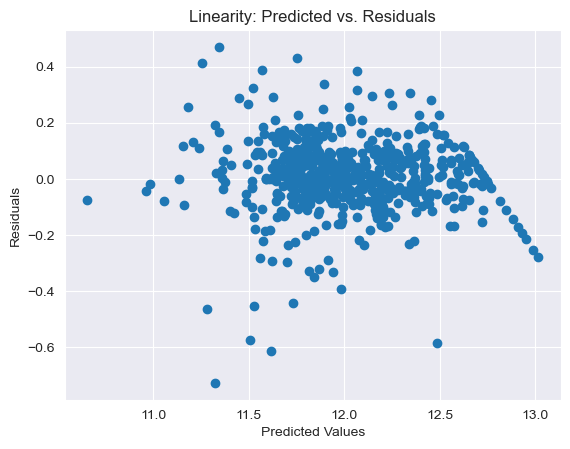

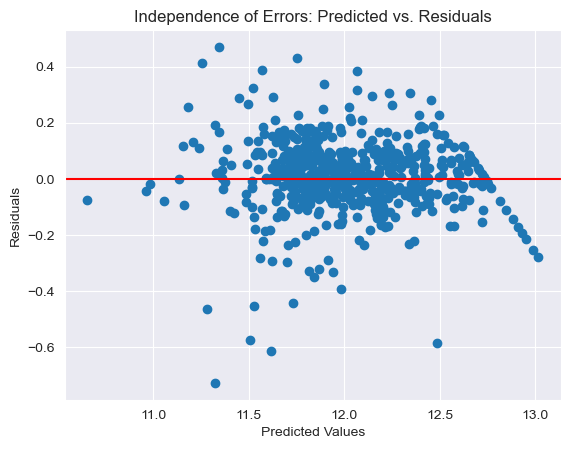

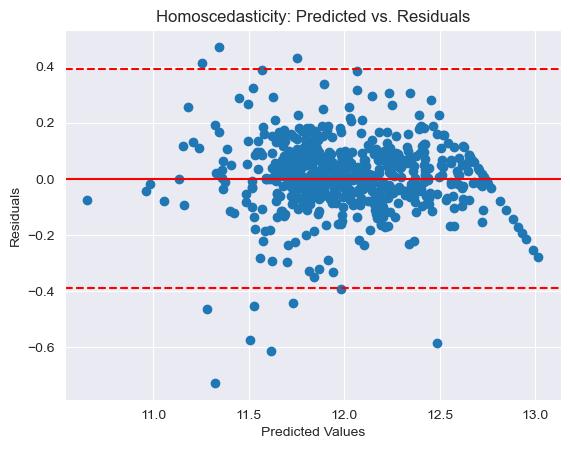

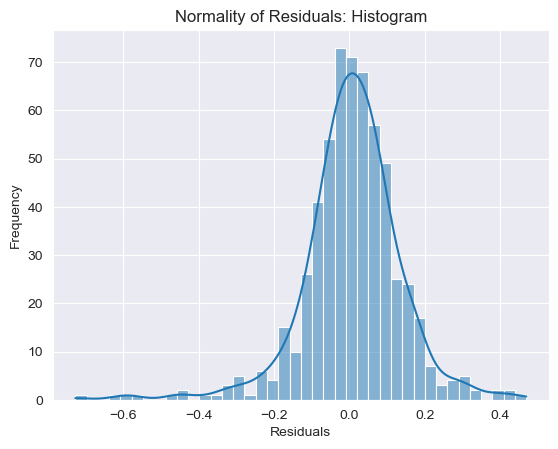

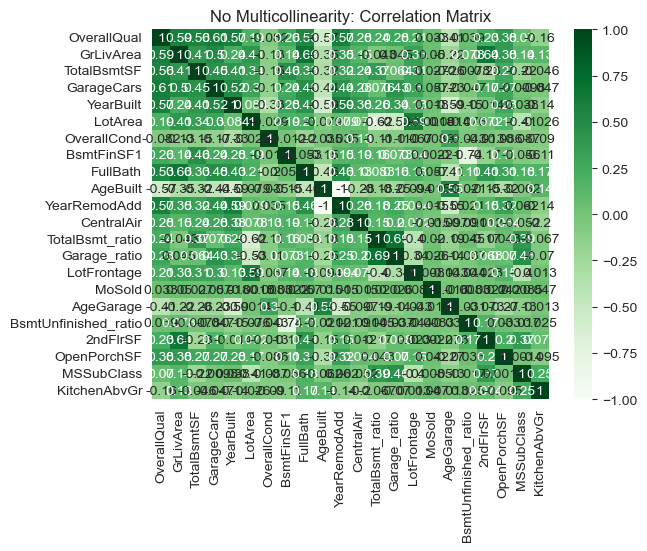

In [178]:
#import numpy as np
#import pandas as pd
#import statsmodels.api as sm
#import matplotlib.pyplot as plt
#import seaborn as sns
#from sklearn.linear_model import LinearRegression

# Residuals
residuals_lr = y_test - y_pred_lr

# Checking assumptions

# Linearity
plt.scatter(y_pred_lr, residuals_lr)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Linearity: Predicted vs. Residuals')
plt.show()

# Independence of errors
plt.scatter(y_pred_lr, residuals_lr)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Independence of Errors: Predicted vs. Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

# Homoscedasticity
plt.scatter(y_pred_lr, residuals_lr)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Homoscedasticity: Predicted vs. Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.axhline(y=3*np.std(residuals_lr), color='r', linestyle='--')
plt.axhline(y=-3*np.std(residuals_lr), color='r', linestyle='--')
plt.show()

# Normality of residuals
sns.histplot(residuals_lr, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Normality of Residuals: Histogram')
plt.show()

# No multicollinearity (assuming X_train_selected_lr is a DataFrame)
correlation_matrix = X_train_selected_lr.corr()
sns.heatmap(correlation_matrix, cmap='Greens', annot=True)
plt.title('No Multicollinearity: Correlation Matrix')
plt.show()


## 4.2. Ridge Regression

In [179]:
#from sklearn.linear_model import Ridge, Lasso, ElasticNet
# Ridge Regression
ridge = Ridge()  # alpha is the regularization strength
ridge.fit(X_train_selected_lr, y_train)
y_pred_ridge = ridge.predict(X_test_selected_lr)
ridge_mse = mean_squared_error(y_test, y_pred_ridge)
print("Ridge Regression MSE:", ridge_mse)

# Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train_selected_lr, y_train)
y_pred_lasso = lasso.predict(X_test_selected_lr)
lasso_mse = mean_squared_error(y_test, y_pred_lasso)
print("Lasso Regression MSE:", lasso_mse)

# Elastic Net Regression
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5)  # alpha is the regularization strength, l1_ratio controls the mix between L1 and L2 regularization
elastic_net.fit(X_train_selected_lr, y_train)
y_pred_elastic_net = elastic_net.predict(X_test_selected_lr)
elastic_net_mse = mean_squared_error(y_test, y_pred_elastic_net)
print("Elastic Net Regression MSE:", elastic_net_mse)

Ridge Regression MSE: 0.016637734666640137
Lasso Regression MSE: 0.14310719681946862
Elastic Net Regression MSE: 0.11675547539668485


In [180]:
#from sklearn.linear_model import Ridge

# Train the model
ridge = Ridge(alpha=0.5)  # set the regularization strength alpha
ridge.fit(X_train_selected_lr, y_train)

# Make predictions on the test set
y_pred_ridge = ridge.predict(X_test_selected_lr)
y_pred_train_ridge = ridge.predict(X_train_selected_lr)

# Calculate evaluation metrics
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
mse_ridge_train = mean_squared_error(y_train, y_pred_train_ridge)
rmse_ridge = np.sqrt(mse_ridge)
rmse_ridge_train = np.sqrt(mse_ridge_train)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
mae_ridge_train = mean_absolute_error(y_train, y_pred_train_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)
r2_ridge_train = r2_score(y_train, y_pred_train_ridge)
mape_score_ridge = mean_absolute_percentage_error(y_test, y_pred_ridge)
mape_socre_ridge_train = mean_absolute_percentage_error(y_train, y_pred_train_ridge)

# Print evaluation metrics
print("Mean squared error (MSE):", mse_ridge)
print("Mean squared error (MSE) Train:", mse_ridge_train)
print("Root mean squared error (RMSE):", rmse_ridge)
print("Root mean squared error (RMSE) Train:", rmse_ridge_train)
print("Mean absolute error (MAE):", mae_ridge)
print("Mean absolute error (MAE) Train:", mae_ridge_train)
print("R-squared (R2):", r2_ridge)
print("R-squared (R2) Train:", r2_ridge_train)
print("Mean absolute percentage error (MAPE):", mape_score_ridge)
print("Mean absolute percentage error (MAPE) Train:", mape_socre_ridge_train)

Mean squared error (MSE): 0.016769294054042937
Mean squared error (MSE) Train: 0.017386658147987843
Root mean squared error (RMSE): 0.1294963090363696
Root mean squared error (RMSE) Train: 0.13185847772512713
Mean absolute error (MAE): 0.09071895219379088
Mean absolute error (MAE) Train: 0.0888704124613943
R-squared (R2): 0.8826296106775761
R-squared (R2) Train: 0.8856576436882255
Mean absolute percentage error (MAPE): 0.007598333364563111
Mean absolute percentage error (MAPE) Train: 0.007467483667228975


## 4.3. Random Forest

In [181]:
X_selected_train_rf = X_train_filtered
X_selected_test_rf = X_test_filtered

In [182]:
X_selected_train_rf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2332 entries, 2260.0 to 862.0
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   OverallQual           2332 non-null   float64
 1   GrLivArea             2332 non-null   float64
 2   TotalBsmtSF           2332 non-null   float64
 3   GarageCars            2332 non-null   float64
 4   YearBuilt             2332 non-null   float64
 5   LotArea               2332 non-null   float64
 6   OverallCond           2332 non-null   float64
 7   BsmtFinSF1            2332 non-null   float64
 8   FullBath              2332 non-null   float64
 9   AgeBuilt              2332 non-null   float64
 10  YearRemodAdd          2332 non-null   float64
 11  CentralAir            2332 non-null   float64
 12  TotalBsmt_ratio       2332 non-null   float64
 13  Garage_ratio          2332 non-null   float64
 14  LotFrontage           2332 non-null   float64
 15  MoSold              

In [183]:
X_selected_test_rf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 584 entries, 2012.0 to 1396.0
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   OverallQual           584 non-null    float64
 1   GrLivArea             584 non-null    float64
 2   TotalBsmtSF           584 non-null    float64
 3   GarageCars            584 non-null    float64
 4   YearBuilt             584 non-null    float64
 5   LotArea               584 non-null    float64
 6   OverallCond           584 non-null    float64
 7   BsmtFinSF1            584 non-null    float64
 8   FullBath              584 non-null    float64
 9   AgeBuilt              584 non-null    float64
 10  YearRemodAdd          584 non-null    float64
 11  CentralAir            584 non-null    float64
 12  TotalBsmt_ratio       584 non-null    float64
 13  Garage_ratio          584 non-null    float64
 14  LotFrontage           584 non-null    float64
 15  MoSold              

In [184]:
#from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
#from sklearn.ensemble import RandomForestRegressor

# Train the model
randomforestmodel = RandomForestRegressor(n_estimators=50, max_depth=10, min_samples_split=10, random_state = 42)
randomforestmodel.fit(X_selected_train_rf, y_train)

# Make predictions on the test set
y_pred_rf = randomforestmodel.predict(X_selected_test_rf)
y_pred_rf_train = randomforestmodel.predict(X_selected_train_rf)

#Model evaluation
mse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
mse_rf_train = mean_squared_error(y_train, y_pred_rf_train, squared=False)
rmse_rf = np.sqrt(mse_rf)
rmse_rf_train = np.sqrt(mse_rf_train)
r2_rf = r2_score(y_test, y_pred_rf)
r2_rf_train = r2_score(y_train, y_pred_rf_train)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
mae_rf_train = mean_absolute_error(y_train, y_pred_rf_train)
mape_score_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
mape_score_rf_train = mean_absolute_percentage_error(y_train, y_pred_rf_train)

# Print evaluation metrics
print("Mean squared error (MSE):", mse_rf)
print("Mean squared error (MSE) Train:", mse_rf_train)
print("Root mean squared error (RMSE):", rmse_rf)
print("Root mean squared error (RMSE) Train:", rmse_rf_train)
print("Mean absolute error (MAE):", mae_rf)
print("Mean absolute error (MAE) Train:", mae_rf_train)
print("R-squared (R2):", r2_rf)
print("R-squared (R2) Train:", r2_rf_train)
print("Mean absolute percentage error (MAPE):", mape_score_rf)
print("Mean absolute percentage error (MAPE) train:", mape_score_rf_train)

Mean squared error (MSE): 0.14619557213306195
Mean squared error (MSE) Train: 0.08118420217693366
Root mean squared error (RMSE): 0.38235529567806686
Root mean squared error (RMSE) Train: 0.28492841588183804
Mean absolute error (MAE): 0.09976255884308957
Mean absolute error (MAE) Train: 0.05711374595421952
R-squared (R2): 0.8504066791273908
R-squared (R2) Train: 0.956655492101621
Mean absolute percentage error (MAPE): 0.0083666315250076
Mean absolute percentage error (MAPE) train: 0.004807727467693807


In [185]:
#from sklearn.model_selection import cross_val_score
#from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest model
random_forest = RandomForestRegressor(n_estimators=100, max_depth=10)

# Perform cross-validation
num_folds = 5  # Number of cross-validation folds
scoring = 'neg_mean_squared_error'  # Evaluation metric (negative mean squared error)
cv_scores = cross_val_score(random_forest, X_selected_train_rf, y_train, cv=num_folds, scoring=scoring)

# Convert the negative mean squared error to positive and take the square root
rmse_scores = np.sqrt(-cv_scores)

# Print the root mean squared error for each fold
for i, score in enumerate(rmse_scores):
    print(f"Fold {i+1}: RMSE = {score}")

# Calculate the mean and standard deviation of the RMSE scores
mean_rmse = np.mean(rmse_scores)
std_rmse = np.std(rmse_scores)

# Print the mean and standard deviation of the RMSE scores
print(f"Mean RMSE: {mean_rmse}")
print(f"Standard Deviation of RMSE: {std_rmse}")

Fold 1: RMSE = 0.16339855252839383
Fold 2: RMSE = 0.16713583954614386
Fold 3: RMSE = 0.11912302768489458
Fold 4: RMSE = 0.13357928425633703
Fold 5: RMSE = 0.11616525577766941
Mean RMSE: 0.13988039195868776
Standard Deviation of RMSE: 0.02158213665850005


## 4.4. XGBoost

In [186]:
X_train_selected_features_xgb = X_train_filtered
X_test_selected_features_xgb = X_test_filtered

In [187]:
X_train_selected_features_xgb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2332 entries, 2260.0 to 862.0
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   OverallQual           2332 non-null   float64
 1   GrLivArea             2332 non-null   float64
 2   TotalBsmtSF           2332 non-null   float64
 3   GarageCars            2332 non-null   float64
 4   YearBuilt             2332 non-null   float64
 5   LotArea               2332 non-null   float64
 6   OverallCond           2332 non-null   float64
 7   BsmtFinSF1            2332 non-null   float64
 8   FullBath              2332 non-null   float64
 9   AgeBuilt              2332 non-null   float64
 10  YearRemodAdd          2332 non-null   float64
 11  CentralAir            2332 non-null   float64
 12  TotalBsmt_ratio       2332 non-null   float64
 13  Garage_ratio          2332 non-null   float64
 14  LotFrontage           2332 non-null   float64
 15  MoSold              

In [188]:
X_test_selected_features_xgb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 584 entries, 2012.0 to 1396.0
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   OverallQual           584 non-null    float64
 1   GrLivArea             584 non-null    float64
 2   TotalBsmtSF           584 non-null    float64
 3   GarageCars            584 non-null    float64
 4   YearBuilt             584 non-null    float64
 5   LotArea               584 non-null    float64
 6   OverallCond           584 non-null    float64
 7   BsmtFinSF1            584 non-null    float64
 8   FullBath              584 non-null    float64
 9   AgeBuilt              584 non-null    float64
 10  YearRemodAdd          584 non-null    float64
 11  CentralAir            584 non-null    float64
 12  TotalBsmt_ratio       584 non-null    float64
 13  Garage_ratio          584 non-null    float64
 14  LotFrontage           584 non-null    float64
 15  MoSold              

In [189]:
#from xgboost import XGBRegressor
#from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error



# Train the model
xgboostmodel = XGBRegressor()
xgboostmodel.fit(X_train_selected_features_xgb, y_train)

# Make predictions on the test set
y_pred_xgb = xgboostmodel.predict(X_test_selected_features_xgb)
y_pred_xgb_train = xgboostmodel.predict(X_train_selected_features_xgb)

# Evaluate the model
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
mse_xgb_train = mean_squared_error(y_train, y_pred_xgb_train)
rmse_xgb = mean_squared_error(y_test, y_pred_xgb, squared=False)
rmse_xgb_train = mean_squared_error(y_train, y_pred_xgb_train, squared=False)
r2_xgb = r2_score(y_test, y_pred_xgb)
r2_xgb_train = r2_score(y_train, y_pred_xgb_train)
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
mae_xgb_train = mean_absolute_error(y_train, y_pred_xgb_train)
mape_score_xgb = mean_absolute_percentage_error(y_test, y_pred_xgb)
mape_score_xgb_train = mean_absolute_percentage_error(y_train, y_pred_xgb_train)

# Print evaluation metrics
print("Mean squared error (MSE):", mse_xgb)
print("Mean squared error (MSE) Train:", mse_xgb_train)
print("Root mean squared error (RMSE):", rmse_xgb)
print("Root mean squared error (RMSE) Train:", rmse_xgb_train)
print("Mean absolute error (MAE):", mae_xgb)
print("Mean absolute error (MAE) Train:", mae_xgb_train)
print("R-squared (R2):", r2_xgb)
print("R-squared (R2) Train:", r2_xgb_train)
print("Mean absolute percentage error (MAPE):", mape_score_xgb)
print("Mean absolute percentage error (MAPE) Train:", mape_score_xgb_train)

Mean squared error (MSE): 0.019926175327696444
Mean squared error (MSE) Train: 0.00039044563981906763
Root mean squared error (RMSE): 0.14116010529783704
Root mean squared error (RMSE) Train: 0.019759697361525243
Mean absolute error (MAE): 0.0956597610714958
Mean absolute error (MAE) Train: 0.014298665147363774
R-squared (R2): 0.8605342032657148
R-squared (R2) Train: 0.9974322567287759
Mean absolute percentage error (MAPE): 0.008046473144791507
Mean absolute percentage error (MAPE) Train: 0.0011929128846839166


## 4.5. LGBM

In [190]:
X_train_selected_features_lgbm = X_train_filtered
X_test_selected_features_lgbm = X_test_filtered

In [191]:
#from lightgbm import LGBMRegressor
#from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error


# Train the model
lgbmmodel = LGBMRegressor()
lgbmmodel.fit(X_train_selected_features_lgbm, y_train)

# Make predictions on the test set
y_pred_lgbm = lgbmmodel.predict(X_test_selected_features_lgbm)
y_pred_lgbm_train = lgbmmodel.predict(X_train_selected_features_lgbm)

# Evaluate the model
mse_lgbm = mean_squared_error(y_test, y_pred_lgbm)
mse_lgbm_train = mean_squared_error(y_train, y_pred_lgbm_train)
rmse_lgbm = mean_squared_error(y_test, y_pred_lgbm, squared=False)
rmse_lgbm_train = mean_squared_error(y_train, y_pred_lgbm_train, squared=False)
r2_lgbm = r2_score(y_test, y_pred_lgbm)
r2_lgbm_train = r2_score(y_train, y_pred_lgbm_train)
mae_lgbm = mean_absolute_error(y_test, y_pred_lgbm)
mae_lgbm_train = mean_absolute_error(y_train, y_pred_lgbm_train)
mape_score_lgbm = mean_absolute_percentage_error(y_test, y_pred_lgbm)
mape_score_lgbm_train = mean_absolute_percentage_error(y_train, y_pred_lgbm_train)

# Print evaluation metrics
print("Mean squared error (MSE):", mse_lgbm)
print("Mean squared error (MSE) Train:", mse_lgbm_train)
print("Root mean squared error (RMSE):", rmse_lgbm)
print("Root mean squared error (RMSE) Train:", rmse_lgbm_train)
print("Mean absolute error (MAE):", mae_lgbm)
print("Mean absolute error (MAE) Train:", mae_lgbm_train)
print("R-squared (R2):", r2_lgbm)
print("R-squared (R2) Train:", r2_lgbm_train)
print("Mean absolute percentage error (MAPE):", mape_score_lgbm)
print("Mean absolute percentage error (MAPE) Train:", mape_score_lgbm_train)

Mean squared error (MSE): 0.018331874959940188
Mean squared error (MSE) Train: 0.0042714992831236675
Root mean squared error (RMSE): 0.13539525456950177
Root mean squared error (RMSE) Train: 0.0653567080193278
Mean absolute error (MAE): 0.09273308347729411
Mean absolute error (MAE) Train: 0.043632584403840734
R-squared (R2): 0.8716929112147427
R-squared (R2) Train: 0.9719087308866805
Mean absolute percentage error (MAPE): 0.0077899621375964925
Mean absolute percentage error (MAPE) Train: 0.0036741253813719482


# 5.Hyperparameter Tunning

## 5.1. XGB Boost

In [192]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV


# Define XGBoost model
xgb_model = xgb.XGBRegressor()

# Define grid search parameters
params = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 500, 1000]
}

# Define grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_model, param_grid=params, cv=5, n_jobs=-1)

# Fit grid search to training data
grid_search.fit(X_train_selected_features_xgb, y_train)

# Print best parameters and score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

# Evaluate model on test data using best parameters
xgb_model_best = xgb.XGBRegressor(**grid_search.best_params_)
xgb_model_best.fit(X_train_selected_features_xgb, y_train)
y_pred = xgb_model_best.predict(X_test_selected_features_xgb)

mse_xgb2 = mean_squared_error(y_test, y_pred, squared=False)
rmse_xgb2 = np.sqrt(mse_xgb2)
r2_xgb2 = r2_score(y_test, y_pred)
mae_xgb2 = mean_absolute_error(y_test, y_pred)
mape_score_xgb2 = mean_absolute_percentage_error(y_test, y_pred)

# Print evaluation metrics
print("Mean squared error (MSE):", mse_xgb2)
print("Root mean squared error (RMSE):", rmse_xgb2)
print("Mean absolute error (MAE):", mae_xgb2)
print("R-squared (R2):", r2_xgb2)
print("Mean absolute percentage error (MAPE):", mape_score_xgb2)

Best parameters:  {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
Best score:  0.8951948238143604
Mean squared error (MSE): 0.1356843148409489
Root mean squared error (RMSE): 0.36835351883883083
Mean absolute error (MAE): 0.09267683833513073
R-squared (R2): 0.871144471421814
Mean absolute percentage error (MAPE): 0.0077866948030564185


In [193]:
#import xgboost as xgb
#from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
#from sklearn.model_selection import train_test_split



# Define model parameters
params = {
    'max_depth': 5,
    'learning_rate':0.01,
    'n_estimators': 1000,
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'reg_alpha': 0.1,
    'reg_lambda': 0.1
}

# Train the model
xgboostmodel_hyper = xgb.XGBRegressor(**params)
xgboostmodel_hyper.fit(X_train_selected_features_xgb, y_train)

# Make predictions on the test set
y_pred_xgb_2 = xgboostmodel_hyper.predict(X_test_selected_features_xgb)
y_pred_train_xgb_2 = xgboostmodel_hyper.predict(X_train_selected_features_xgb)
# Evaluate the model

mse_xgb_2 = mean_squared_error(y_test, y_pred_xgb_2, squared=False)
mse_xgb_train_2 = mean_squared_error(y_train, y_pred_train_xgb_2, squared=False)
rmse_xgb_2 = np.sqrt(mse_xgb)
rmse_xgb_train_2 = np.sqrt(mse_xgb_train)
r2_xgb_2 = r2_score(y_test, y_pred_xgb_2)
r2_xgb_train_2 = r2_score(y_train, y_pred_train_xgb_2)
mae_xgb_2 = mean_absolute_error(y_test, y_pred_xgb_2)
mae_xgb_train_2 = mean_absolute_error(y_train, y_pred_train_xgb_2)
mape_score_xgb_2 = mean_absolute_percentage_error(y_test, y_pred_xgb_2)
mape_score_xgb_2_train = mean_absolute_percentage_error(y_train, y_pred_train_xgb_2)

# Print evaluation metrics
print("Mean squared error (MSE):", mse_xgb_2)
print("Mean squared error (MSE) Train:", mse_xgb_train_2)
print("Root mean squared error (RMSE):", rmse_xgb_2)
print("Root mean squared error (RMSE) Train:", rmse_xgb_train_2)
print("Mean absolute error (MAE):", mae_xgb_2)
print("Mean absolute error (MAE) Train:", mae_xgb_train_2)
print("R-squared (R2):", r2_xgb_2)
print("R-squared (R2) Train:", r2_xgb_train_2)
print("Mean absolute percentage error (MAPE):", mape_score_xgb_2)
print("Mean absolute percentage error (MAPE) Train:", mape_score_xgb_2_train)

Mean squared error (MSE): 0.13327322976423234
Mean squared error (MSE) Train: 0.06775701388984903
Root mean squared error (RMSE): 0.14116010529783704
Root mean squared error (RMSE) Train: 0.019759697361525243
Mean absolute error (MAE): 0.08958768683747911
Mean absolute error (MAE) Train: 0.050626897661689194
R-squared (R2): 0.8756832608143451
R-squared (R2) Train: 0.9698074677749445
Mean absolute percentage error (MAPE): 0.007529210457934344
Mean absolute percentage error (MAPE) Train: 0.004240223582511375


## 5.2. LGBM

In [194]:
#import lightgbm as lgb
#from sklearn.model_selection import GridSearchCV

# Define LightGBM model
lgb_model = lgb.LGBMRegressor()

# Define grid search parameters
params = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 500, 1000]
}

# Define grid search with cross-validation
grid_search = GridSearchCV(estimator=lgb_model, param_grid=params, cv=5, n_jobs=-1)

# Fit grid search to training data
grid_search.fit(X_train_selected_features_lgbm, y_train)

# Print best parameters and score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

# Evaluate model on test data using best parameters
lgb_model_best = lgb.LGBMRegressor(**grid_search.best_params_)
lgb_model_best.fit(X_train_selected_features_lgbm, y_train)
y_pred = lgb_model_best.predict(X_test_selected_features_lgbm)

mse_lgbm2 = mean_squared_error(y_test, y_pred, squared=False)
rmse_lgbm2 = np.sqrt(mse_lgbm2)
r2_lgbm2 = r2_score(y_test, y_pred)
mae_lgbm2 = mean_absolute_error(y_test, y_pred)
mape_score_lgbm2 = mean_absolute_percentage_error(y_test, y_pred)

# Print evaluation metrics
print("Mean squared error (MSE):", mse_lgbm2)
print("Root mean squared error (RMSE):", rmse_lgbm2)
print("Mean absolute error (MAE):", mae_lgbm2)
print("R-squared (R2):", r2_lgbm2)
print("Mean absolute percentage error (MAPE):", mape_score_lgbm2)

Best parameters:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000}
Best score:  0.886773486716914
Mean squared error (MSE): 0.12980473214984828
Root mean squared error (RMSE): 0.3602842379980677
Mean absolute error (MAE): 0.08846325530054203
R-squared (R2): 0.8820698595946089
Mean absolute percentage error (MAPE): 0.007423133122479326


In [195]:
#from lightgbm import LGBMRegressor
#from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error


params = {
    'max_depth': 3,
    'learning_rate':0.1,
    'n_estimators': 400
}


# Train the model
lgbmmodel_hyper = LGBMRegressor(**params)
lgbmmodel_hyper.fit(X_train_selected_features_lgbm, y_train)

# Make predictions on the test set
y_pred_lgbm2 = lgbmmodel_hyper.predict(X_test_selected_features_lgbm)
y_pred_lgbm_train2 = lgbmmodel_hyper.predict(X_train_selected_features_lgbm)

# Evaluate the model
mse_lgbm2 = mean_squared_error(y_test, y_pred_lgbm2)
mse_lgbm_train2 = mean_squared_error(y_train, y_pred_lgbm_train2)
rmse_lgbm2 = mean_squared_error(y_test, y_pred_lgbm2, squared=False)
rmse_lgbm_train2 = mean_squared_error(y_train, y_pred_lgbm_train2, squared=False)
r2_lgbm2 = r2_score(y_test, y_pred_lgbm2)
r2_lgbm_train2 = r2_score(y_train, y_pred_lgbm_train2)
mae_lgbm2 = mean_absolute_error(y_test, y_pred_lgbm2)
mae_lgbm_train2 = mean_absolute_error(y_train, y_pred_lgbm_train2)
mape_score_lgbm2 = mean_absolute_percentage_error(y_test, y_pred_lgbm2)
mape_score_train_lgbm2 = mean_absolute_percentage_error(y_train, y_pred_lgbm_train2)

# Print evaluation metrics
print("Mean squared error (MSE):", mse_lgbm2)
print("Mean squared error (MSE) Train:", mse_lgbm_train2)
print("Root mean squared error (RMSE):", rmse_lgbm2)
print("Root mean squared error (RMSE) Train:", rmse_lgbm_train2)
print("Mean absolute error (MAE):", mae_lgbm2)
print("Mean absolute error (MAE) Train:", mae_lgbm_train2)
print("R-squared (R2):", r2_lgbm2)
print("R-squared (R2) Train:", r2_lgbm_train2)
print("Mean absolute percentage error (MAPE):", mape_score_lgbm2)
print("Mean absolute percentage error (MAPE) Train:", mape_score_train_lgbm2)

Mean squared error (MSE): 0.01731367105339511
Mean squared error (MSE) Train: 0.0063601992741886965
Root mean squared error (RMSE): 0.1315814236638102
Root mean squared error (RMSE) Train: 0.07975085751381421
Mean absolute error (MAE): 0.08952256718915555
Mean absolute error (MAE) Train: 0.056461743493433615
R-squared (R2): 0.8788194478796536
R-squared (R2) Train: 0.9581725156477332
Mean absolute percentage error (MAPE): 0.007519318154979615
Mean absolute percentage error (MAPE) Train: 0.004748259031307475


# 6.Model Evaluation

In [196]:
Evaluation_df = {
    'Model': ['Linear Regression', 'Ridge Regression', 'Random Forest', 'XGBoost', 'LGBM Boost', 'XGBoost-Tunning', 'LGBM Boost-Tunning'],
    'MSE': [mse_lr, mse_ridge, mse_rf, mse_xgb, mse_lgbm, mse_xgb_2, mse_lgbm2],
    'RMSE': [rmse_lr, rmse_ridge, rmse_rf, rmse_xgb, rmse_lgbm, rmse_xgb_2, rmse_lgbm2],
    'MAE': [mae_lr, mae_ridge, mae_rf, mae_xgb, mae_lgbm, mae_xgb_2, mae_lgbm2],
    'MAPE': [mape_score_lr, mape_score_ridge, mape_score_rf, mape_score_xgb, mape_score_lgbm, mape_score_xgb_2, mape_score_lgbm2],
    'R-squared': [r2_lr, r2_ridge, r2_rf, r2_xgb, r2_lgbm, r2_xgb_2, r2_lgbm2]
}

Evaluation_df = pd.DataFrame(Evaluation_df).round(4)
Evaluation_df.sort_values('R-squared', ascending=False)

,Model,MSE,RMSE,MAE,MAPE,R-squared
1,Ridge Regression,0.02,0.13,0.09,0.01,0.88
0,Linear Regression,0.02,0.13,0.09,0.01,0.88
6,LGBM Boost-Tunning,0.02,0.13,0.09,0.01,0.88
5,XGBoost-Tunning,0.13,0.14,0.09,0.01,0.88
4,LGBM Boost,0.02,0.14,0.09,0.01,0.87
3,XGBoost,0.02,0.14,0.10,0.01,0.86
2,Random Forest,0.15,0.38,0.10,0.01,0.85


In [199]:
#y_train.mean().round(4)

In [200]:
#y_test.mean().round(4)

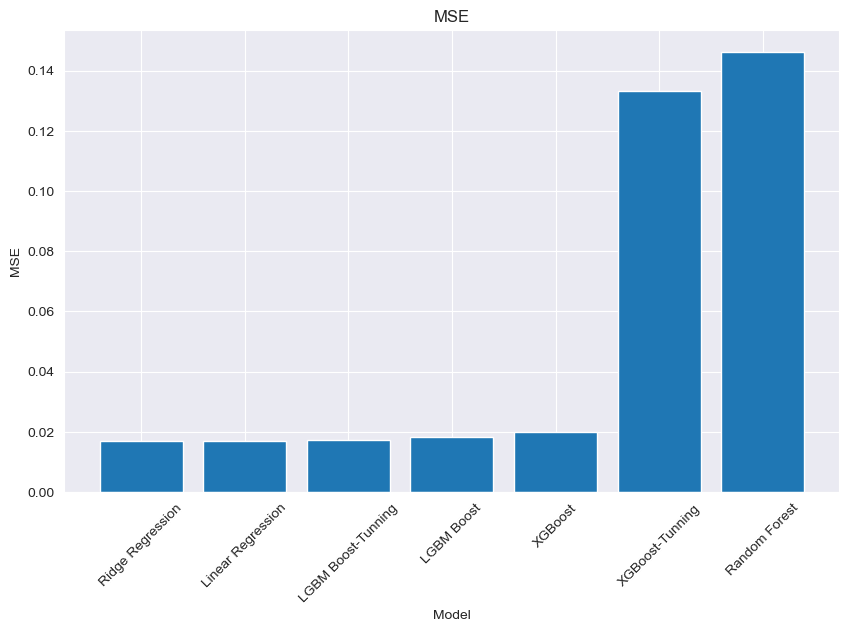

In [197]:
#import matplotlib.pyplot as plt

# Sort the DataFrame by RMSE in ascending order
sorted_df = Evaluation_df.sort_values('MSE')

# Create the bar plot
plt.figure(figsize=(10, 6))
plt.bar(sorted_df['Model'], sorted_df['MSE'])
plt.xlabel('Model')
plt.ylabel('MSE')
plt.title('MSE')
plt.xticks(rotation=45)
plt.show()

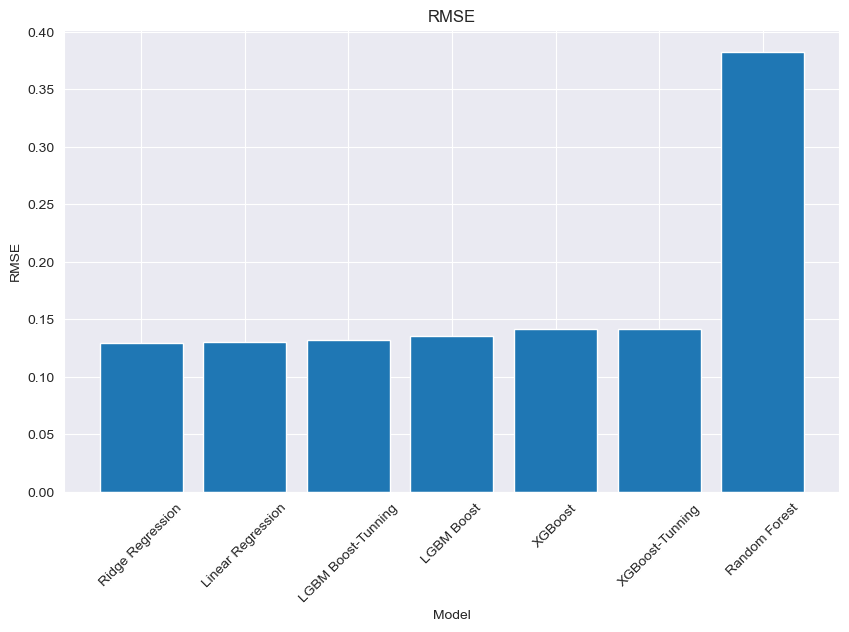

In [198]:

# Sort the DataFrame by RMSE in ascending order
sorted_df = Evaluation_df.sort_values('RMSE')

# Create the bar plot
plt.figure(figsize=(10, 6))
plt.bar(sorted_df['Model'], sorted_df['RMSE'])
plt.xlabel('Model')
plt.ylabel('RMSE')
plt.title('RMSE')
plt.xticks(rotation=45)
plt.show()

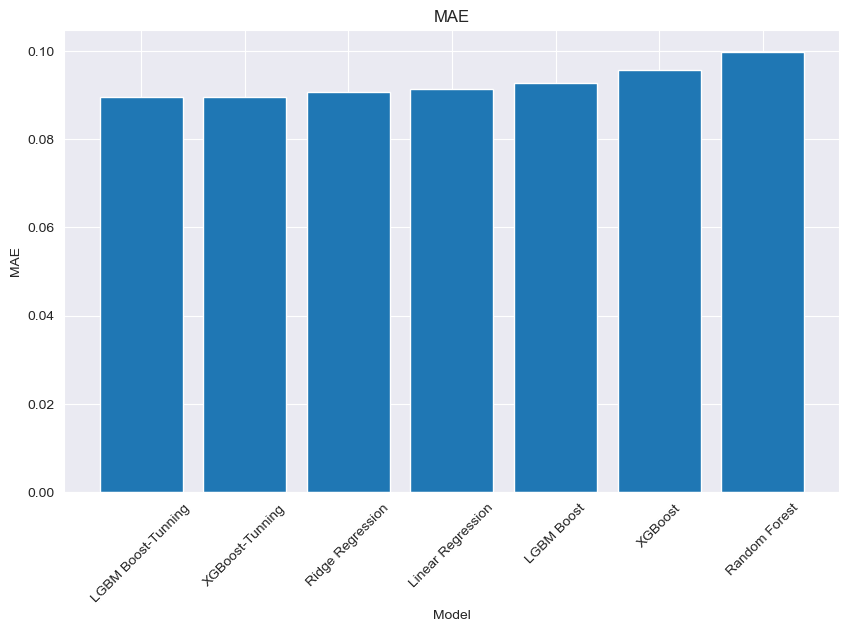

In [199]:

# Sort the DataFrame by RMSE in ascending order
sorted_df = Evaluation_df.sort_values('MAE')

# Create the bar plot
plt.figure(figsize=(10, 6))
plt.bar(sorted_df['Model'], sorted_df['MAE'])
plt.xlabel('Model')
plt.ylabel('MAE')
plt.title('MAE')
plt.xticks(rotation=45)
plt.show()

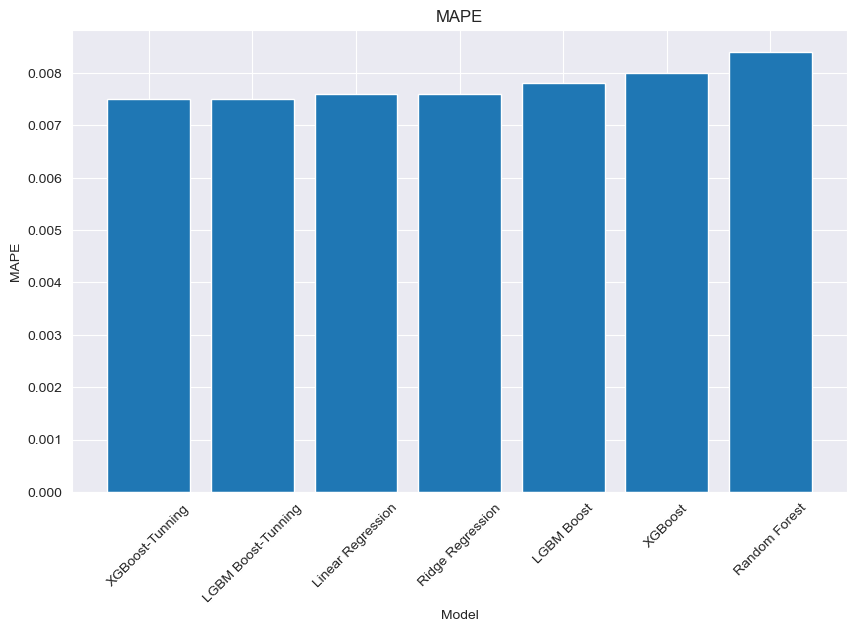

In [200]:


# Sort the DataFrame by RMSE in ascending order
sorted_df = Evaluation_df.sort_values('MAPE')

# Create the bar plot
plt.figure(figsize=(10, 6))
plt.bar(sorted_df['Model'], sorted_df['MAPE'])
plt.xlabel('Model')
plt.ylabel('MAPE')
plt.title('MAPE')
plt.xticks(rotation=45)
plt.show()

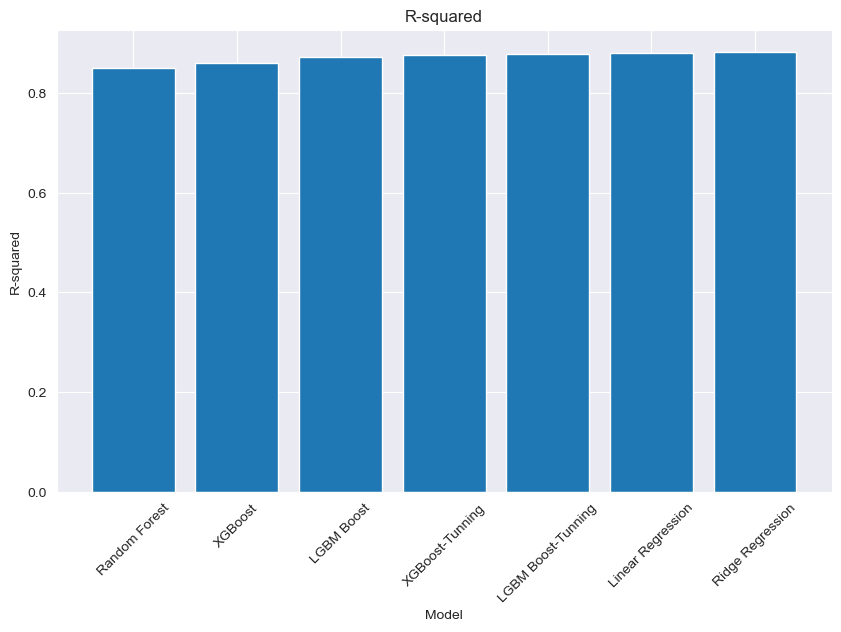

In [201]:

# Sort the DataFrame by RMSE in ascending order
sorted_df = Evaluation_df.sort_values('R-squared')

# Create the bar plot
plt.figure(figsize=(10, 6))
plt.bar(sorted_df['Model'], sorted_df['R-squared'])
plt.xlabel('Model')
plt.ylabel('R-squared')
plt.title('R-squared')
plt.xticks(rotation=45)
plt.show()

In [202]:
y_train.index

Index([2260.0, 2575.0, 2357.0, 1807.0, 1255.0, 1368.0, 2818.0, 1075.0, 1843.0,
       1568.0,
       ...
       1486.0,  331.0, 1242.0,  468.0, 2173.0, 1642.0, 1098.0, 1134.0, 1298.0,
        862.0],
      dtype='float64', name='Id', length=2332)

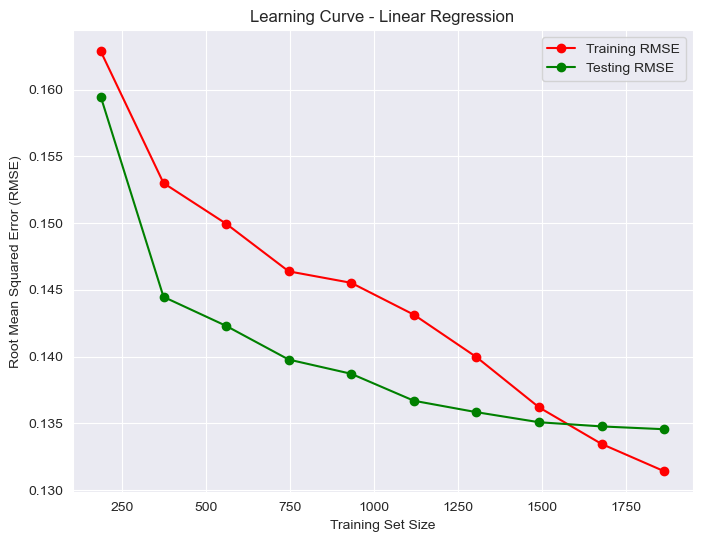

In [203]:
# Create a function for learning curve analysis
def plot_learning_curve(estimator, X, y):
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=5,
                                                            scoring='neg_mean_squared_error',
                                                            train_sizes=np.linspace(0.1, 1.0, 10))
    train_rmse = np.sqrt(-train_scores.mean(axis=1))
    test_rmse = np.sqrt(-test_scores.mean(axis=1))

    # Plot the learning curve
    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_rmse, 'o-', color='r', label='Training RMSE')
    plt.plot(train_sizes, test_rmse, 'o-', color='g', label='Testing RMSE')
    plt.xlabel('Training Set Size')
    plt.ylabel('Root Mean Squared Error (RMSE)')
    plt.title('Learning Curve - Linear Regression')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

# Call the function to plot the learning curve
plot_learning_curve(linear, X_train_selected_lr, y_train)

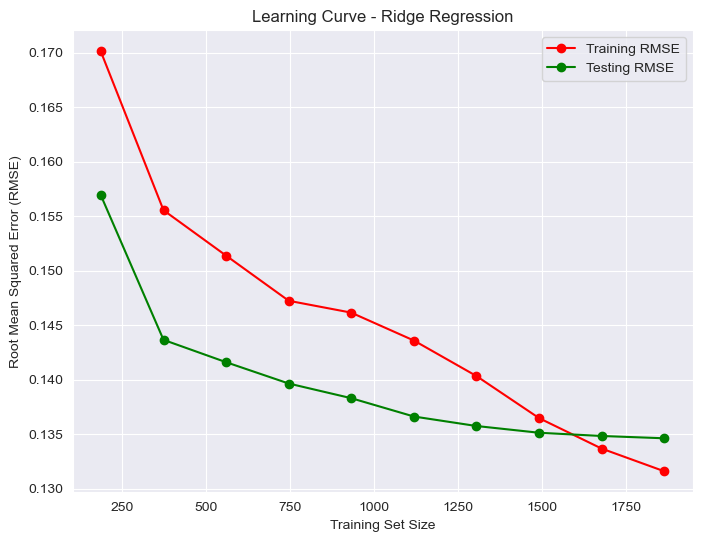

In [204]:
# Create a function for learning curve analysis
def plot_learning_curve(estimator, X, y):
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=5,
                                                            scoring='neg_mean_squared_error',
                                                            train_sizes=np.linspace(0.1, 1.0, 10))
    train_rmse = np.sqrt(-train_scores.mean(axis=1))
    test_rmse = np.sqrt(-test_scores.mean(axis=1))

    # Plot the learning curve
    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_rmse, 'o-', color='r', label='Training RMSE')
    plt.plot(train_sizes, test_rmse, 'o-', color='g', label='Testing RMSE')
    plt.xlabel('Training Set Size')
    plt.ylabel('Root Mean Squared Error (RMSE)')
    plt.title('Learning Curve - Ridge Regression')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

# Call the function to plot the learning curve
plot_learning_curve(ridge, X_train_selected_lr, y_train)

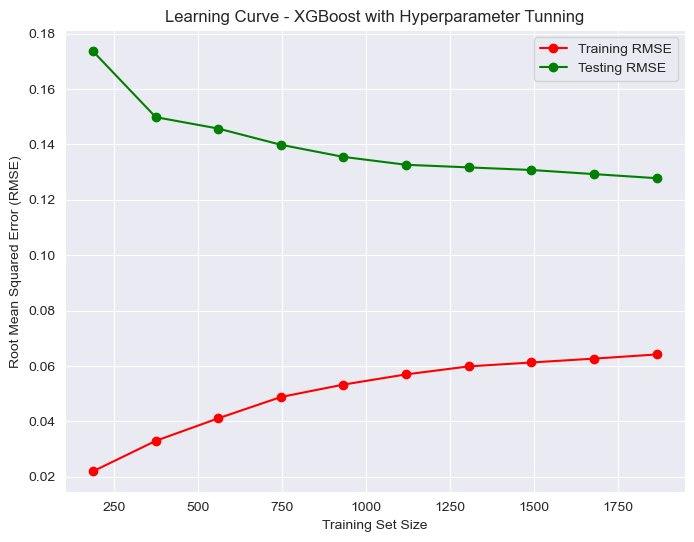

In [205]:
# Create a function for learning curve analysis
def plot_learning_curve(estimator, X, y):
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=5,
                                                            scoring='neg_mean_squared_error',
                                                            train_sizes=np.linspace(0.1, 1.0, 10))
    train_rmse = np.sqrt(-train_scores.mean(axis=1))
    test_rmse = np.sqrt(-test_scores.mean(axis=1))

    # Plot the learning curve
    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_rmse, 'o-', color='r', label='Training RMSE')
    plt.plot(train_sizes, test_rmse, 'o-', color='g', label='Testing RMSE')
    plt.xlabel('Training Set Size')
    plt.ylabel('Root Mean Squared Error (RMSE)')
    plt.title('Learning Curve - XGBoost with Hyperparameter Tunning')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

# Call the function to plot the learning curve
plot_learning_curve(xgboostmodel_hyper, X_train_selected_features_xgb, y_train)

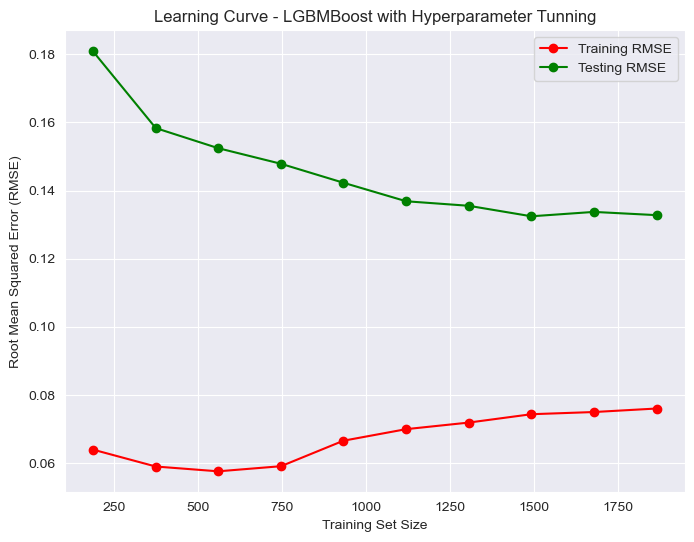

In [206]:
#import matplotlib.pyplot as plt
#import numpy as np
#from sklearn.model_selection import learning_curve

# Create a function for learning curve analysis
def plot_learning_curve(estimator, X, y):
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=5,
                                                            scoring='neg_mean_squared_error',
                                                            train_sizes=np.linspace(0.1, 1.0, 10))
    train_rmse = np.sqrt(-train_scores.mean(axis=1))
    test_rmse = np.sqrt(-test_scores.mean(axis=1))

    # Plot the learning curve
    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_rmse, 'o-', color='r', label='Training RMSE')
    plt.plot(train_sizes, test_rmse, 'o-', color='g', label='Testing RMSE')
    plt.xlabel('Training Set Size')
    plt.ylabel('Root Mean Squared Error (RMSE)')
    plt.title('Learning Curve - LGBMBoost with Hyperparameter Tunning')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

# Call the function to plot the learning curve
plot_learning_curve(lgbmmodel_hyper, X_train_selected_features_lgbm, y_train)